In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.ensemble import IsolationForest
from scipy.stats import zscore, norm
from sklearn.preprocessing import OrdinalEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import plotly.express as px
import plotly.io as pio
import matplotlib.cm
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, SimpleRNN, LSTM, GRU, Dropout
from keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
import math

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
import keras
print(keras.__version__)

import tensorflow as tf

print(f"TensorFlow version: {tf.__version__}")
print(f"Num GPUs Available: {len(tf.config.experimental.list_physical_devices('GPU'))}")



2.15.0
TensorFlow version: 2.15.0
Num GPUs Available: 0


In [4]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '0'  # or any other level
import tensorflow as tf


In [5]:
df = pd.read_csv('Hourly Weather Data in Gallipoli (2008-2021).csv', sep=';')
df

,DateTime,Temperature,Sunshine Duration,Shortwave Radiation,Relative Humidity,Mean Sea Level Pressure,Soil Temperature,Soil Moisture,Wind Speed,Wind Direction
0,1.01.2008 03:00,-0.1,0,0.0,92,1019.2,5.9,0.212,0.0,180.00
1,1.01.2008 04:00,2.5,0,0.0,92,1018.2,5.4,0.212,22.7,43.07
2,1.01.2008 05:00,2.9,0,0.0,95,1017.1,5.1,0.212,25.8,54.09
3,1.01.2008 06:00,3.9,0,0.0,95,1017.4,4.9,0.212,25.8,59.86
4,1.01.2008 07:00,4.9,0,0.0,93,1016.4,5.1,0.211,26.7,61.02
...,...,...,...,...,...,...,...,...,...,...
122728,31.12.2021 19:00,6.3,0,0.0,92,1023.1,9.1,0.260,11.9,54.87
122729,31.12.2021 20:00,5.8,0,0.0,94,1023.3,8.2,0.260,10.7,70.35
122730,31.12.2021 21:00,5.2,0,0.0,93,1023.4,7.5,0.260,9.1,71.57
122731,31.12.2021 22:00,5.0,0,0.0,93,1023.8,6.8,0.260,8.2,61.19


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 122733 entries, 0 to 122732
Data columns (total 10 columns):
 #   Column                   Non-Null Count   Dtype  
---  ------                   --------------   -----  
 0   DateTime                 122733 non-null  object 
 1   Temperature              122733 non-null  float64
 2   Sunshine Duration        122733 non-null  int64  
 3   Shortwave Radiation      122733 non-null  float64
 4   Relative Humidity        122733 non-null  int64  
 5   Mean Sea Level Pressure  122733 non-null  float64
 6   Soil Temperature         122733 non-null  float64
 7   Soil Moisture            122733 non-null  float64
 8   Wind Speed               122733 non-null  float64
 9   Wind Direction           122733 non-null  float64
dtypes: float64(7), int64(2), object(1)
memory usage: 9.4+ MB


In [7]:
df.describe()

,Temperature,Sunshine Duration,Shortwave Radiation,Relative Humidity,Mean Sea Level Pressure,Soil Temperature,Soil Moisture,Wind Speed,Wind Direction
count,122733.000000,122733.000000,122733.000000,122733.000000,122733.000000,122733.000000,122733.000000,122733.000000,122733.000000
mean,15.670196,21.084680,202.333411,69.683924,1015.073141,16.336311,0.210705,19.391254,108.071393
std,8.192027,27.030718,272.710423,19.079325,6.795215,8.054375,0.067094,11.141315,91.270893
min,-13.800000,0.000000,0.000000,13.000000,981.300000,-5.200000,0.102000,0.000000,0.310000
25%,9.700000,0.000000,0.000000,55.000000,1010.600000,10.100000,0.153000,10.400000,44.090000
50%,15.500000,0.000000,16.020000,72.000000,1014.400000,15.900000,0.214000,18.300000,60.360000
75%,21.400000,56.000000,379.140000,86.000000,1019.200000,22.400000,0.263000,26.800000,195.020000
max,40.800000,60.000000,950.520000,100.000000,1043.600000,40.100000,0.433000,93.300000,360.000000


In [8]:
df['DateTime'] = pd.to_datetime(df['DateTime'], format='%d.%m.%Y %H:%M')
df.set_index('DateTime', inplace=True)

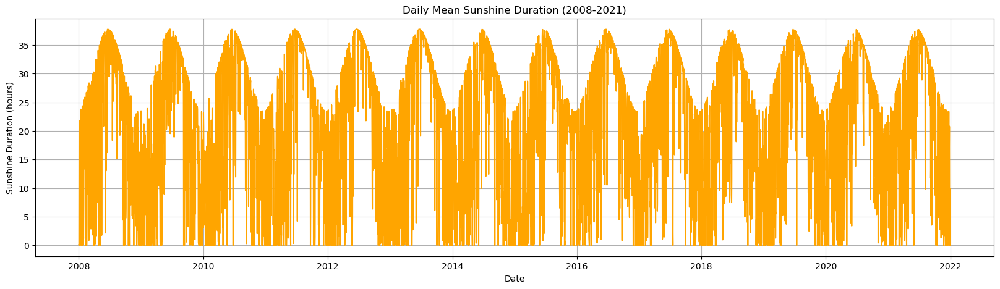

In [9]:
daily_sunshine_duration = df['Sunshine Duration'].resample('D').mean()

plt.figure(figsize=(20, 5))
plt.plot(daily_sunshine_duration, color='orange')
plt.title('Daily Mean Sunshine Duration (2008-2021)')
plt.xlabel('Date')
plt.ylabel('Sunshine Duration (hours)')
plt.grid(True)
plt.show()

In [10]:
def plot_basic(df):
    numerical_features = df.select_dtypes(include=np.number).columns

    fig, axs = plt.subplots(len(numerical_features), 1, figsize=(20, 20), facecolor='white')
    i = 1
    for col, ax in zip(numerical_features, axs):
        ax.plot(df[col].values)
        ax.set_title(col)
        ax.tick_params(axis='both', which='major', labelsize=14)
        ax.grid(True)
        i += 1

    plt.tight_layout()
    plt.show()

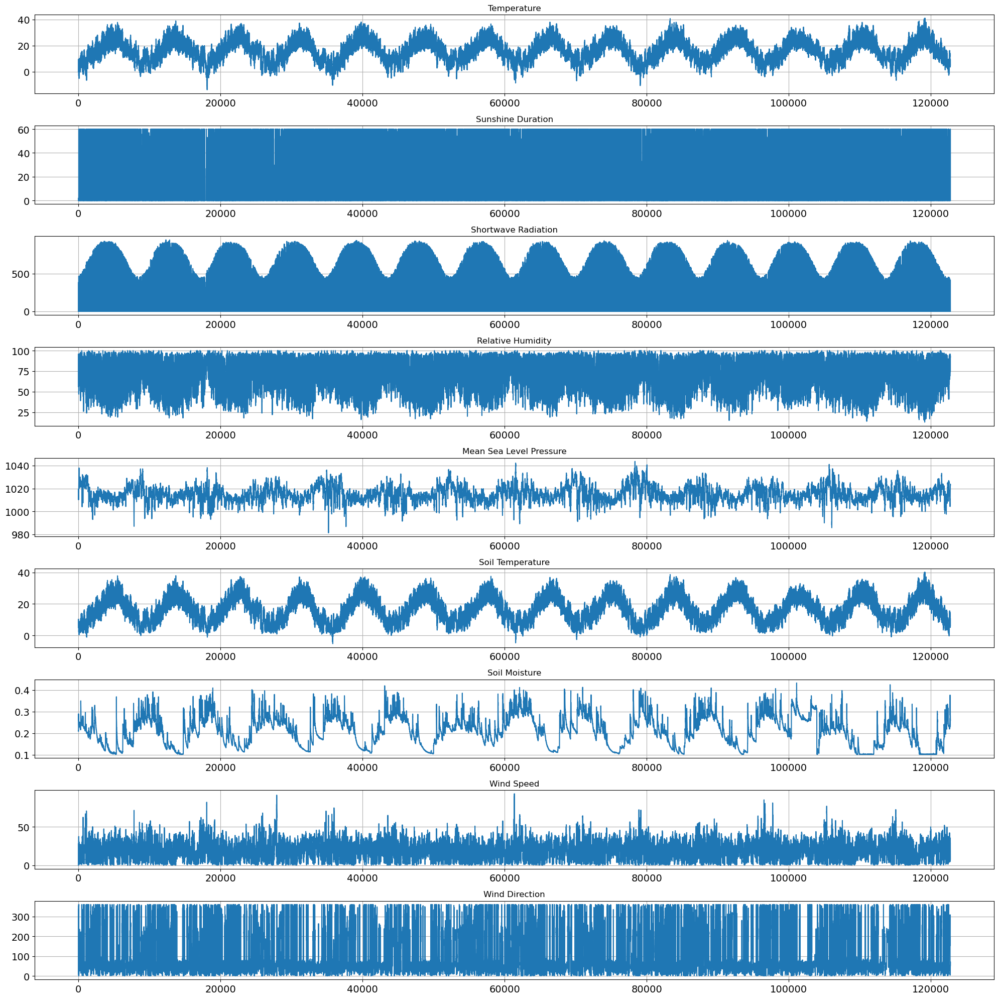

In [11]:
plot_basic(df)

In [12]:
def plot_timeseries_with_outliers(df):

    numerical_features = df.select_dtypes(include=np.number).columns
    
    fig, axs = plt.subplots(len(numerical_features), 1, figsize=(20, len(numerical_features) * 6), constrained_layout=True)
    axs = axs.flatten()

    for i, col in enumerate(numerical_features):
        data = df[col]
        
        Q1 = data.quantile(0.25)
        Q3 = data.quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        axs[i].plot(data, label=col, color='blue')
        axs[i].axhline(y=lower_bound, color='red', linestyle='--', label='Lower Bound (Outliers)')
        axs[i].axhline(y=upper_bound, color='green', linestyle='--', label='Upper Bound (Outliers)')
        axs[i].set_title(f'{col} ({lower_bound:.2f},{upper_bound:.2f})')
        axs[i].set_xlabel('Date')
        axs[i].set_ylabel(col)

        y_min = max(data.min(), lower_bound - 0.1 * (upper_bound - lower_bound))
        y_max = min(data.max(), upper_bound + 0.1 * (upper_bound - lower_bound))
        axs[i].set_ylim(y_min, y_max)
        
    plt.show()

In [13]:
def plot_timeseries(df):

    numerical_features = df.select_dtypes(include=np.number).columns
        
    fig, axs = plt.subplots(len(numerical_features), 1, figsize=(20, len(numerical_features) * 6), constrained_layout=True)
    axs = axs.flatten()

    for i, col in enumerate(numerical_features):
        data = df[col]
        
        Q1 = data.quantile(0.25)
        Q3 = data.quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        axs[i].plot(data, label=col, color='blue')
        axs[i].set_title(f'{col}')
        axs[i].set_xlabel('Date')
        axs[i].set_ylabel(col)
        
    plt.show()

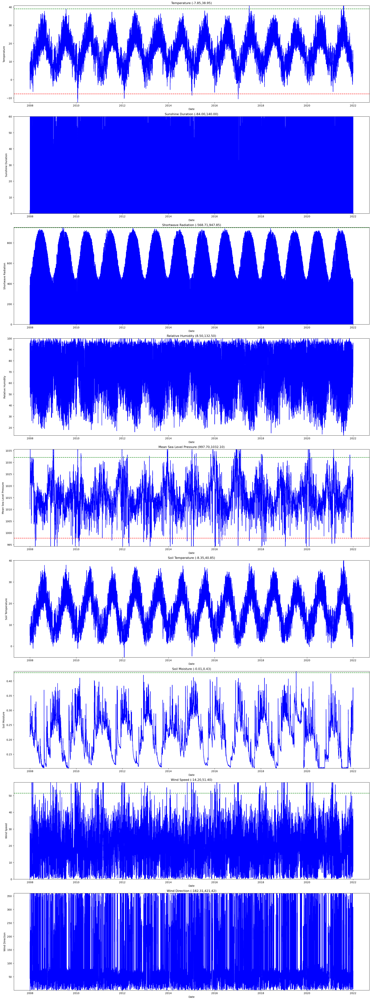

In [14]:
plot_timeseries_with_outliers(df)

In [15]:
def plot_distribution_numerical(df):
    numerical_features = df.select_dtypes(include=np.number).columns
    num_features = len(numerical_features)
    num_cols = 2
    num_rows = (num_features + num_cols - 1) // num_cols

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 20), constrained_layout=True)
    axs = axs.flatten()

    for i, col in enumerate(numerical_features):

        sns.histplot(x=col, data=df, ax=axs[i], kde=True, bins=40, color='blue', stat='density')
        
        mean, std = df[col].mean(), df[col].std()
        x = np.linspace(df[col].min(), df[col].max(), 100)
        p = norm.pdf(x, mean, std)
        axs[i].plot(x, p, 'k', linewidth=2, label='Normal dist.', color='red')

        axs[i].set_title(f'Distribution of {col}\nSkew: {df[col].skew():.4f}')
        axs[i].set_xlabel(col.capitalize())
        axs[i].set_ylabel('Density')
        axs[i].legend()

    # Remove unnecessary subplots
    for j in range(i + 1, len(axs)):
        fig.delaxes(axs[j])
        
    plt.show()

In [16]:
df.skew()

Temperature                0.051333
Sunshine Duration          0.588904
Shortwave Radiation        1.117827
Relative Humidity         -0.434425
Mean Sea Level Pressure    0.282530
Soil Temperature           0.138899
Soil Moisture              0.077508
Wind Speed                 0.725503
Wind Direction             0.995163
dtype: float64

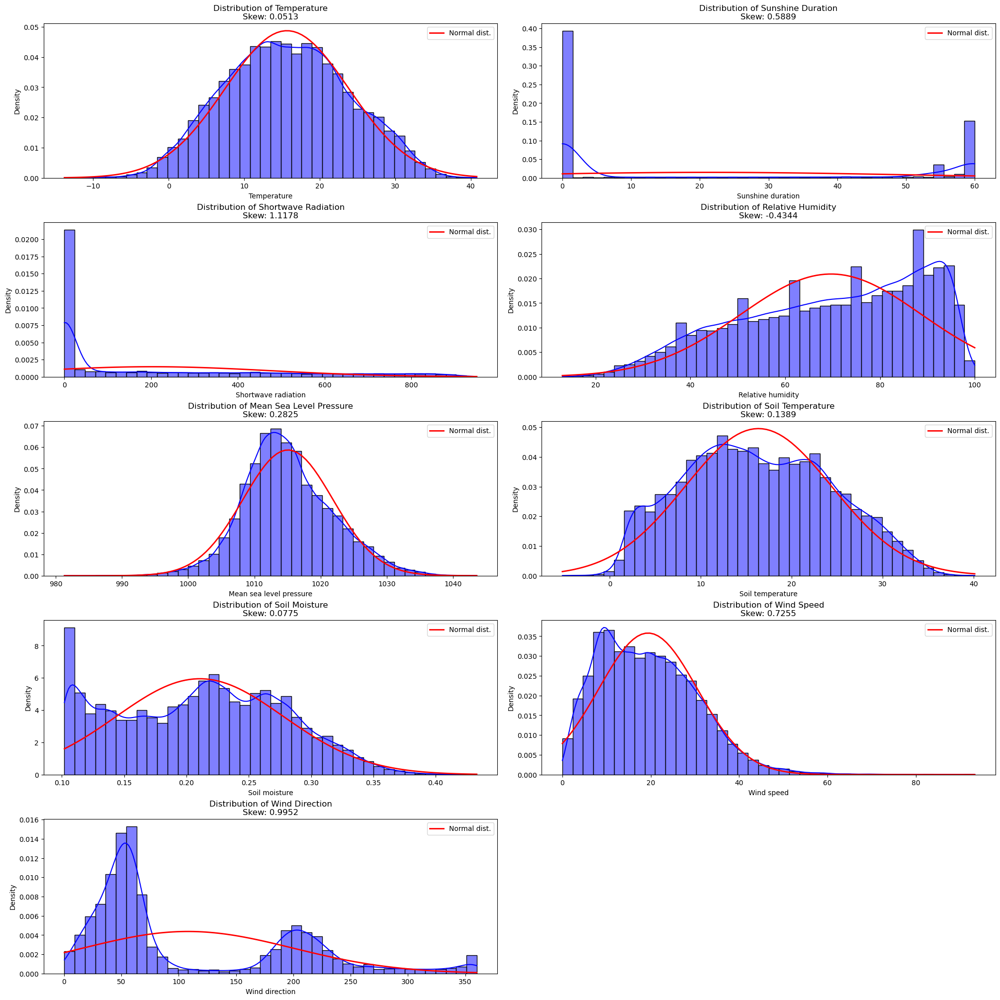

In [17]:
plot_distribution_numerical(df)

In [18]:
def plot_outliers(df):
    numerical_features = df.select_dtypes(include=np.number).columns
    num_features = len(numerical_features)
    num_cols = 2
    num_rows = (num_features + num_cols - 1) // num_cols

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(10, 20), constrained_layout=True)
    axs = axs.flatten()
    
    for i, col in enumerate(numerical_features):
        sns.boxplot(y=col, data=df, ax=axs[i], palette='viridis')
        ax=axs[i].set_title(col.capitalize())

    # removing uneccessary (sub)plots
    for j in range(i + 1, len(axs)):
        fig.delaxes(axs[j])  
        
    plt.show()

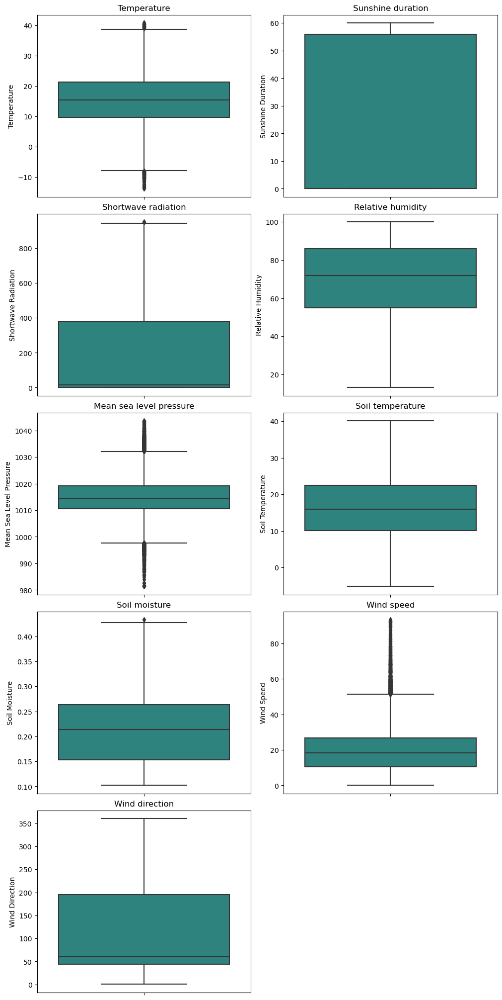

In [19]:
plot_outliers(df)

In [20]:
# log_transform_features = ['Sunshine Duration', 'Relative Humidity', 'Wind Speed']
# for col in log_transform_features:
#     minimum = df[col].min()
#     df[col] = df[col] - minimum + 1
#     df[col] = np.log(df[col])

# df

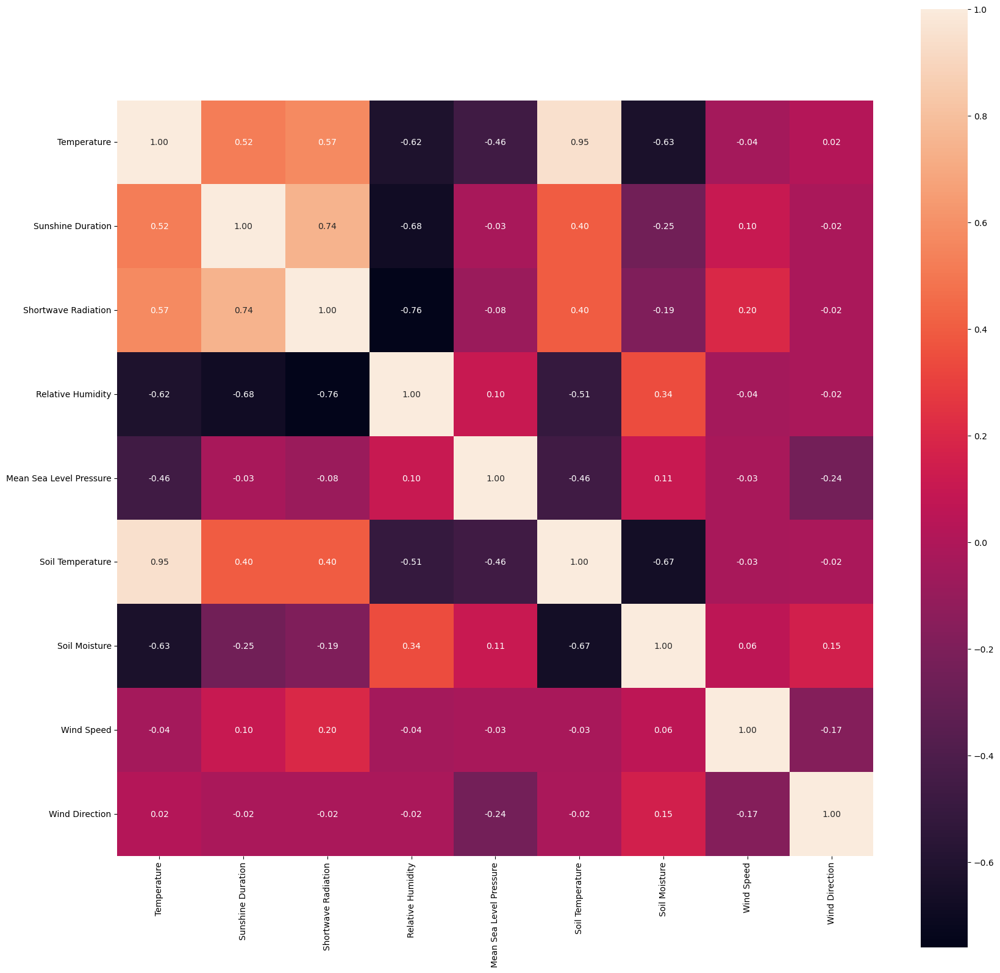

,Temperature,Sunshine Duration,Shortwave Radiation,Relative Humidity,Mean Sea Level Pressure,Soil Temperature,Soil Moisture,Wind Speed,Wind Direction
Temperature,1.00,0.52,0.57,-0.62,-0.46,0.95,-0.63,-0.04,0.02
Sunshine Duration,0.52,1.00,0.74,-0.68,-0.03,0.40,-0.25,0.10,-0.02
Shortwave Radiation,0.57,0.74,1.00,-0.76,-0.08,0.40,-0.19,0.20,-0.02
Relative Humidity,-0.62,-0.68,-0.76,1.00,0.10,-0.51,0.34,-0.04,-0.02
Mean Sea Level Pressure,-0.46,-0.03,-0.08,0.10,1.00,-0.46,0.11,-0.03,-0.24
Soil Temperature,0.95,0.40,0.40,-0.51,-0.46,1.00,-0.67,-0.03,-0.02
Soil Moisture,-0.63,-0.25,-0.19,0.34,0.11,-0.67,1.00,0.06,0.15
Wind Speed,-0.04,0.10,0.20,-0.04,-0.03,-0.03,0.06,1.00,-0.17
Wind Direction,0.02,-0.02,-0.02,-0.02,-0.24,-0.02,0.15,-0.17,1.00


In [21]:
corr = df.corr().apply(lambda x: round(x, 2))
plt.figure(figsize=(20, 20))
sns.heatmap(corr, annot=True, fmt=".2f", square=True)
plt.show()
corr

In [22]:
df = df.drop(columns=['Soil Temperature'])

In [23]:
df.describe()

,Temperature,Sunshine Duration,Shortwave Radiation,Relative Humidity,Mean Sea Level Pressure,Soil Moisture,Wind Speed,Wind Direction
count,122733.000000,122733.000000,122733.000000,122733.000000,122733.000000,122733.000000,122733.000000,122733.000000
mean,15.670196,21.084680,202.333411,69.683924,1015.073141,0.210705,19.391254,108.071393
std,8.192027,27.030718,272.710423,19.079325,6.795215,0.067094,11.141315,91.270893
min,-13.800000,0.000000,0.000000,13.000000,981.300000,0.102000,0.000000,0.310000
25%,9.700000,0.000000,0.000000,55.000000,1010.600000,0.153000,10.400000,44.090000
50%,15.500000,0.000000,16.020000,72.000000,1014.400000,0.214000,18.300000,60.360000
75%,21.400000,56.000000,379.140000,86.000000,1019.200000,0.263000,26.800000,195.020000
max,40.800000,60.000000,950.520000,100.000000,1043.600000,0.433000,93.300000,360.000000


In [24]:
df_outliers_clipped = df.copy(deep=True)

df_outliers_clipped['Temperature'] = df_outliers_clipped['Temperature'].clip(lower=-6, upper=38)
df_outliers_clipped['Relative Humidity'] = df_outliers_clipped['Relative Humidity'].clip(lower=10, upper=100)
df_outliers_clipped['Mean Sea Level Pressure'] = df_outliers_clipped['Mean Sea Level Pressure'].clip(lower=996, upper=1033)
df_outliers_clipped['Soil Moisture'] = df_outliers_clipped['Soil Moisture'].clip(lower=0, upper=0.42)

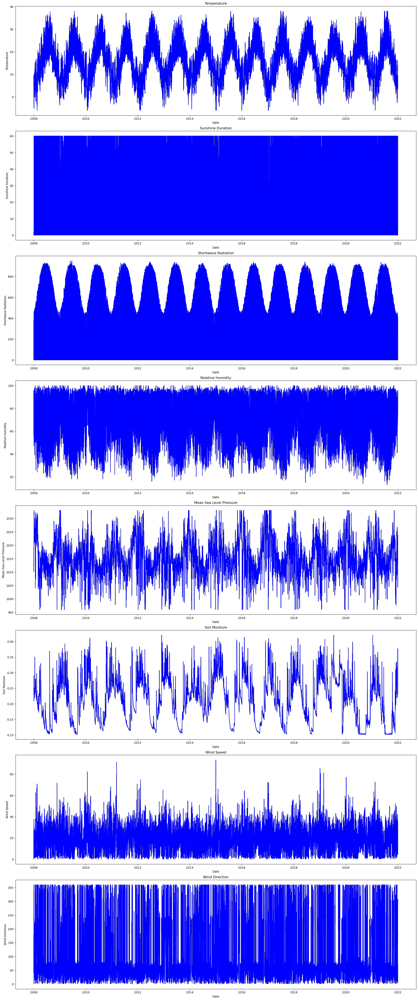

In [25]:
plot_timeseries(df_outliers_clipped)

In [26]:
df_outliers_mean = df.copy(deep=True)

mean_temperature = df_outliers_mean['Temperature'].mean()
mean_humidity = df_outliers_mean['Relative Humidity'].mean()
mean_sea_pressure = df_outliers_mean['Mean Sea Level Pressure'].mean()
mean_moisture = df_outliers_mean['Soil Moisture'].mean()

df_outliers_mean['Temperature'] = df_outliers_mean['Temperature'].apply(
    lambda x: x if -6 <= x <= 38 else mean_temperature
)
df_outliers_mean['Relative Humidity'] = df_outliers_mean['Relative Humidity'].apply(
    lambda x: x if 10 <= x <= 100 else mean_humidity
)
df_outliers_mean['Mean Sea Level Pressure'] = df_outliers_mean['Mean Sea Level Pressure'].apply(
    lambda x: x if 996 <= x <= 1033 else mean_sea_pressure
)
df_outliers_mean['Soil Moisture'] = df_outliers_mean['Soil Moisture'].apply(
    lambda x: x if 0 <= x <= 0.42 else mean_moisture
)

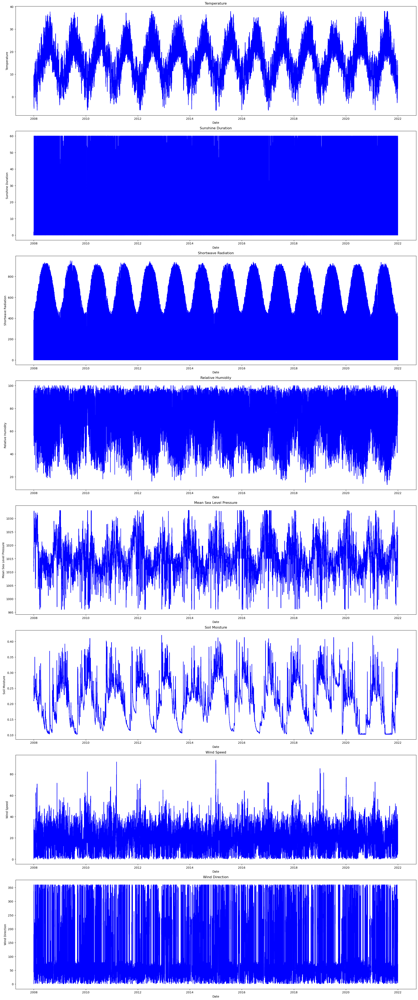

In [27]:
plot_timeseries(df_outliers_mean)

In [28]:
def create_lagged_dataset(df, lagged_inputs=1, lagged_outputs=1):
    df_lagged = pd.DataFrame()
    features= list(df.columns)
    
    for i in range(lagged_inputs, 0, -1):
        for feature in features:
            df_lagged[f'{feature}(t-{i})'] = df[feature].shift(i)
    
    for i in range(0, lagged_outputs):
        for feature in features:
            if i == 0:
                df_lagged[f'{feature}(t)'] = df[feature]
            else:
                df_lagged[f'{feature}(t+{i})'] = df[feature].shift(-i)
    
    df_lagged.dropna(inplace=True)
    
    return df_lagged   

In [29]:
def scale_and_split(df_lagged, target_cols, train_size=0.8, val_size=0.1):
    n = len(df_lagged)
    train_end = int(n * train_size)
    val_end = int(n * (train_size + val_size))

    train_data = df_lagged.iloc[:train_end]
    val_data = df_lagged.iloc[train_end:val_end]
    test_data = df_lagged.iloc[val_end:]

    train_X = train_data.drop(columns=target_cols)
    train_y = train_data[target_cols]
    val_X = val_data.drop(columns=target_cols)
    val_y = val_data[target_cols]
    test_X = test_data.drop(columns=target_cols)
    test_y = test_data[target_cols]

    scaler = MinMaxScaler()
    train_X_scaled = scaler.fit_transform(train_X)

    val_X_scaled = scaler.transform(val_X)
    test_X_scaled = scaler.transform(test_X)

    return train_X_scaled, train_y, val_X_scaled, val_y, test_X_scaled, test_y, scaler

In [30]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
checkpoint = tf.keras.callbacks.ModelCheckpoint('best_model.keras', monitor='val_loss', save_best_only=True)

In [31]:
def plot_history(history):
    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.legend()
    plt.title('Loss Over Epochs')

    plt.subplot(1, 2, 2)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.legend()
    plt.title('Accuracy Over Epochs')

    plt.show()

In [32]:
def calculate_metrics(actual, predicted):
    mse = mean_squared_error(actual, predicted)
    mae = mean_absolute_error(actual, predicted)
    rmse = math.sqrt(mean_squared_error(actual, predicted))
    r2 = r2_score(actual, predicted)
    
    return {"mse": mse, "mae": mae, "rmse": rmse, "r2": r2}

In [33]:
def rescale(scaled_values, values_min, values_max):
    return scaled_values * (values_max[-1] - values_min[-1]) + values_min[-1]

In [34]:
def evaluate(model, test_X, test_y, values_min, values_max):
    print('test_y')
    print(test_y)
    pred_y = model.predict(test_X)

    test_y = test_y.reshape((len(test_y), 1))
    print('test_y reshape')
    print(test_y)
    actual_rescaled = test_y
    print('actual_rescaled')
    print(actual_rescaled)
    pred_y = pred_y.reshape((len(pred_y), 1))
    predicted_rescaled = pred_y
    print('predicted_rescaled')
    print(predicted_rescaled)
    metrics = calculate_metrics(actual_rescaled, predicted_rescaled)
    ret_val = {"actual_rescaled": actual_rescaled, "predicted_rescaled": predicted_rescaled, "metrics": metrics}

    return ret_val

In [35]:
def SimpleRNN_32and16(
    train_X, train_y, val_X, val_y, optimizer='adam', loss='mse', metrics=['accuracy'],
    batch_size=64, epochs=20, dropout=0.2
):
    model = Sequential()
    model.add(SimpleRNN(32, return_sequences=True, input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(Dropout(dropout))
    model.add(SimpleRNN(16, return_sequences=True))
    model.add(Dropout(dropout))
    model.add(Dense(1))

    model.compile(loss=loss, optimizer=optimizer, metrics=metrics)
    model.summary()
    
    history = model.fit(train_X, train_y, epochs=epochs, batch_size=batch_size, validation_data=(val_X, val_y), 
                        verbose=2, shuffle=False, callbacks=[early_stopping, checkpoint])

    plot_history(history)

    return model

In [36]:
def LSTM_32and16(
    train_X, train_y, val_X, val_y, optimizer='adam', loss='mse', metrics=['accuracy'],
    batch_size=64, epochs=20, dropout=0.2
):
    model = Sequential()
    model.add(LSTM(32, return_sequences=True, input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(Dropout(dropout))
    model.add(LSTM(16, return_sequences=True))
    model.add(Dropout(dropout))
    model.add(Dense(1))

    model.compile(loss=loss, optimizer=optimizer, metrics=metrics)
    model.summary()
    
    history = model.fit(train_X, train_y, epochs=epochs, batch_size=batch_size, validation_data=(val_X, val_y), 
                        verbose=2, shuffle=False, callbacks=[early_stopping, checkpoint])

    plot_history(history)

    return model

In [37]:
def GRU_32and16(
    train_X, train_y, val_X, val_y, optimizer='adam', loss='mse', metrics=['accuracy'],
    batch_size=64, epochs=20, dropout=0.2
):
    model = Sequential()
    model.add(GRU(32, return_sequences=True, input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(Dropout(dropout))
    model.add(GRU(16, return_sequences=True))
    model.add(Dropout(dropout))
    model.add(Dense(1))

    model.compile(loss=loss, optimizer=optimizer, metrics=metrics)
    model.summary()
    
    history = model.fit(train_X, train_y, epochs=epochs, batch_size=batch_size, validation_data=(val_X, val_y), 
                        verbose=2, shuffle=False, callbacks=[early_stopping, checkpoint])

    plot_history(history)

    return model

In [38]:
df_lagged = create_lagged_dataset(df_outliers_clipped[['Temperature']], 24)
target_cols = ['Temperature(t)']
train_X_scaled, train_y, val_X_scaled, val_y, test_X_scaled, test_y, scaler = scale_and_split(df_lagged, target_cols)

In [39]:
train_X_simple_rnn = train_X_scaled.reshape((train_X_scaled.shape[0], 1, train_X_scaled.shape[1]))
val_X_simple_rnn = val_X_scaled.reshape((val_X_scaled.shape[0], 1, val_X_scaled.shape[1]))
test_X_simple_rnn = test_X_scaled.reshape((test_X_scaled.shape[0], 1, test_X_scaled.shape[1]))

train_y_simple_rnn = train_y.values if hasattr(train_y, 'values') else train_y
val_y_simple_rnn = val_y.values if hasattr(val_y, 'values') else val_y
test_y_simple_rnn = test_y.values if hasattr(test_y, 'values') else test_y

In [40]:
scaler.data_max_

array([38., 38., 38., 38., 38., 38., 38., 38., 38., 38., 38., 38., 38.,
       38., 38., 38., 38., 38., 38., 38., 38., 38., 38., 38.])

In [41]:
scaler.data_min_

array([-6., -6., -6., -6., -6., -6., -6., -6., -6., -6., -6., -6., -6.,
       -6., -6., -6., -6., -6., -6., -6., -6., -6., -6., -6.])



Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn (SimpleRNN)      (None, 1, 32)             1824      
                                                                 
 dropout (Dropout)           (None, 1, 32)             0         
                                                                 
 simple_rnn_1 (SimpleRNN)    (None, 1, 16)             784       
                                                                 
 dropout_1 (Dropout)         (None, 1, 16)             0         
                                                                 
 dense (Dense)               (None, 1, 1)              17        
                                                                 
Total params: 2625 (10.25 KB)
Trainable params: 2625 (10.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20


1534/15

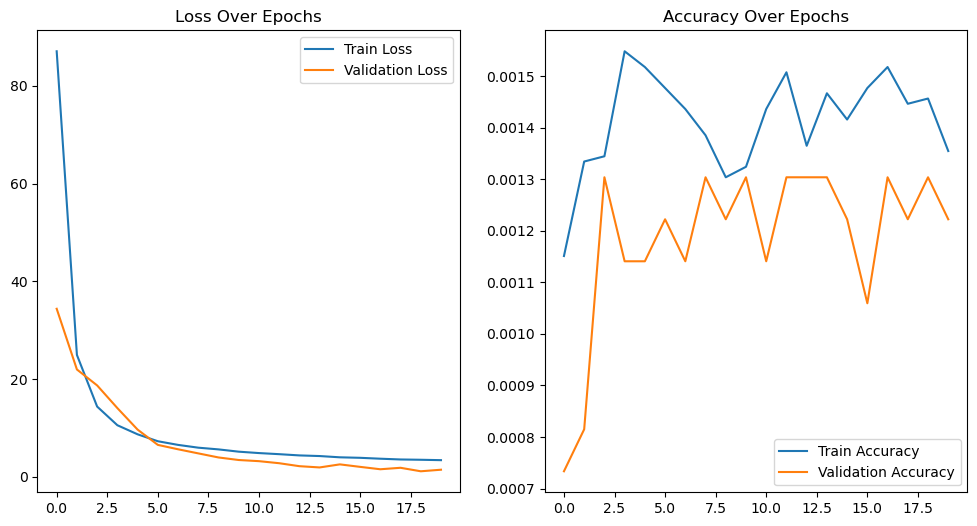

In [42]:
model = SimpleRNN_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adam', loss='mse')

In [43]:
def plot_actual_vs_predicted(actual, predicted, title='Actual vs Predicted Values', xlabel='Sample', ylabel='Value'):
    plt.figure(figsize=(10, 6))
    plt.plot(actual, label='Actual')
    plt.plot(predicted, label='Predicted')
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    plt.show()

In [44]:
results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "Simple RNN, 32,16, ADAM MSE, Batch 64, epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 1s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[29.610035 ]
 [29.147083 ]
 [28.092648 ]
 ...
 [ 5.702358 ]
 [ 5.0794873]
 [ 4.918661 ]]
Name: Simple RNN, 32,16, ADAM MSE, Batch 64, epochs 20, dropout 0.2
MSE: 1.96420181390443
MAE: 0.9774198122454315
RMSE: 1.4014998444182682
R2 Score: 0.9711023326071342


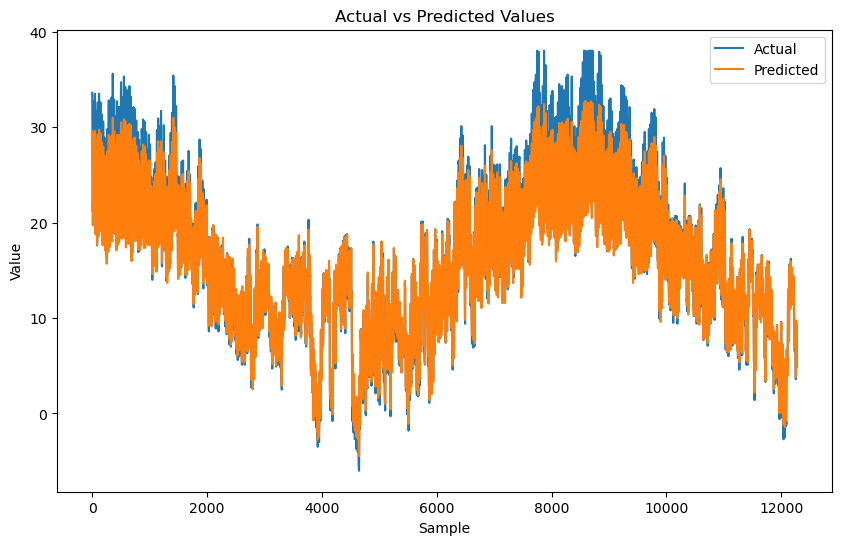

In [45]:
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)

In [46]:
def plot_comparison(train, val, test, predicted, title1='Train + CV + Test', title2='Train + CV + Predicted', xlabel='Sample', ylabel='Value'):
    original = np.concatenate([train, val, test])
    combined = np.concatenate([train, val, predicted.flatten()])

    plt.figure(figsize=(12, 10))
    
    plt.subplot(2, 1, 1)
    plt.plot(original, label='Original')
    plt.title(title1)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    
    plt.subplot(2, 1, 2)
    plt.plot(np.concatenate([train, val]), label='Train + CV')
    plt.plot(range(len(train) + len(val), len(train) + len(val) + len(predicted)), predicted.flatten(), label='Predicted', color='orange')
    plt.title(title2)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend()
    
    plt.tight_layout()
    plt.show()

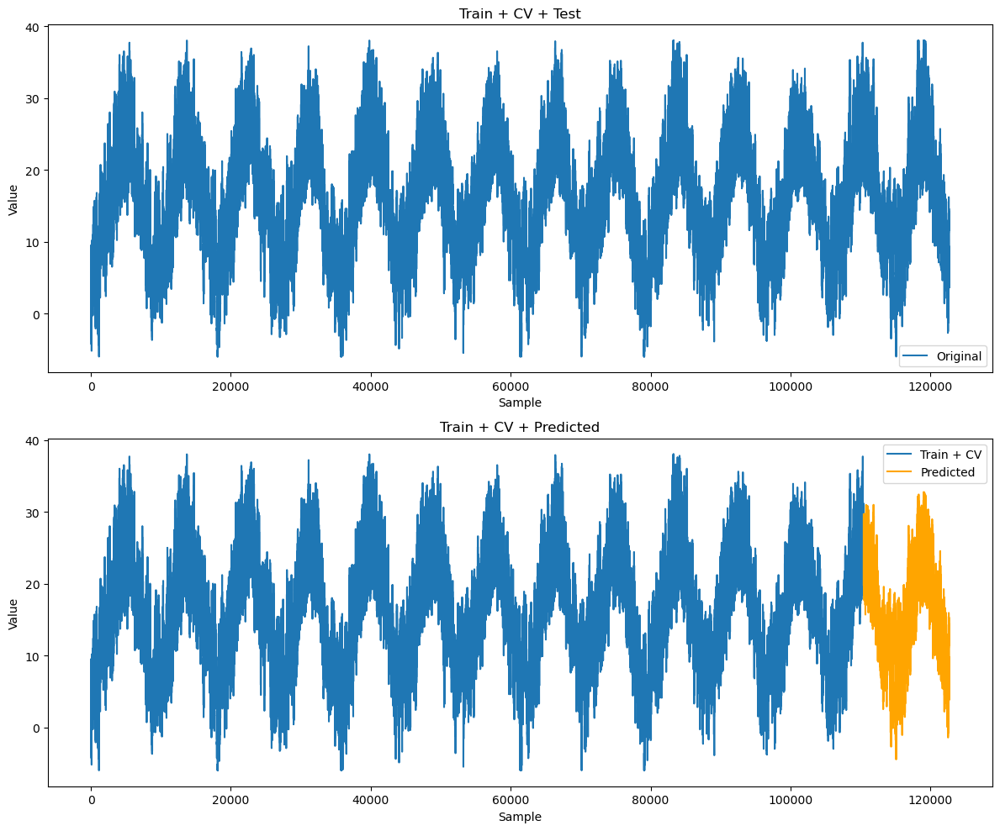

In [47]:
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)

In [48]:
df_results = pd.DataFrame([metrics])

In [49]:
df_results

,Name,MSE,MAE,RMSE,R2 Score
0,"Simple RNN, 32,16, ADAM MSE, Batch 64, epochs ...",1.964202,0.97742,1.4015,0.971102


Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_2 (SimpleRNN)    (None, 1, 32)             1824      
                                                                 
 dropout_2 (Dropout)         (None, 1, 32)             0         
                                                                 
 simple_rnn_3 (SimpleRNN)    (None, 1, 16)             784       
                                                                 
 dropout_3 (Dropout)         (None, 1, 16)             0         
                                                                 
 dense_1 (Dense)             (None, 1, 1)              17        
                                                                 
Total params: 2625 (10.25 KB)
Trainable params: 2625 (10.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534/1534

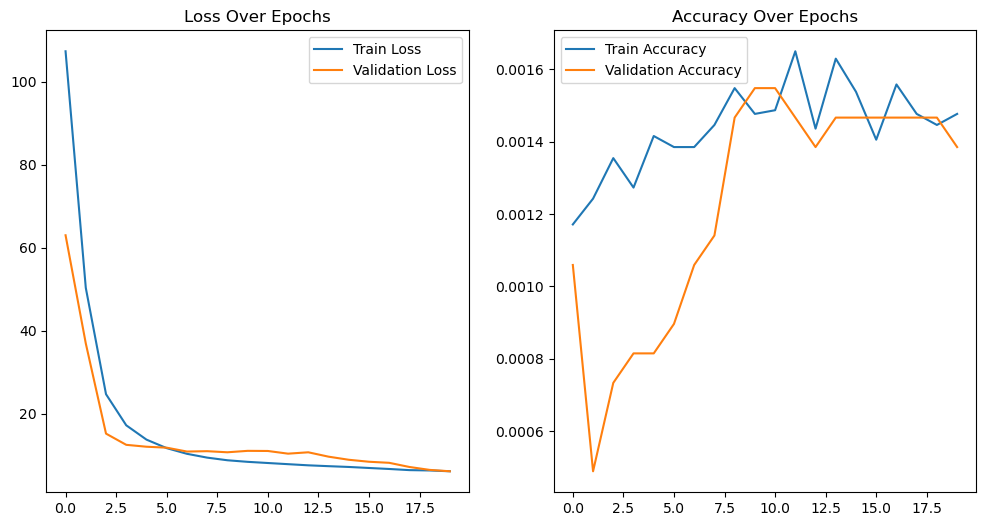

In [50]:
model = SimpleRNN_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adamax', loss='mse')

In [51]:
results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "Simple RNN, 32,16, ADAMAX MSE, batch 64, epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 1s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[26.817888 ]
 [26.497854 ]
 [25.706102 ]
 ...
 [ 5.1304226]
 [ 4.600181 ]
 [ 4.5122585]]
Name: Simple RNN, 32,16, ADAMAX MSE, batch 64, epochs 20, dropout 0.2
MSE: 7.897633326973586
MAE: 1.9780190815776768
RMSE: 2.8102728207370875
R2 Score: 0.8838086904013013


{'Name': 'Simple RNN, 32,16, ADAMAX MSE, batch 64, epochs 20, dropout 0.2', 'MSE': 7.897633326973586, 'MAE': 1.9780190815776768, 'RMSE': 2.8102728207370875, 'R2 Score': 0.8838086904013013}


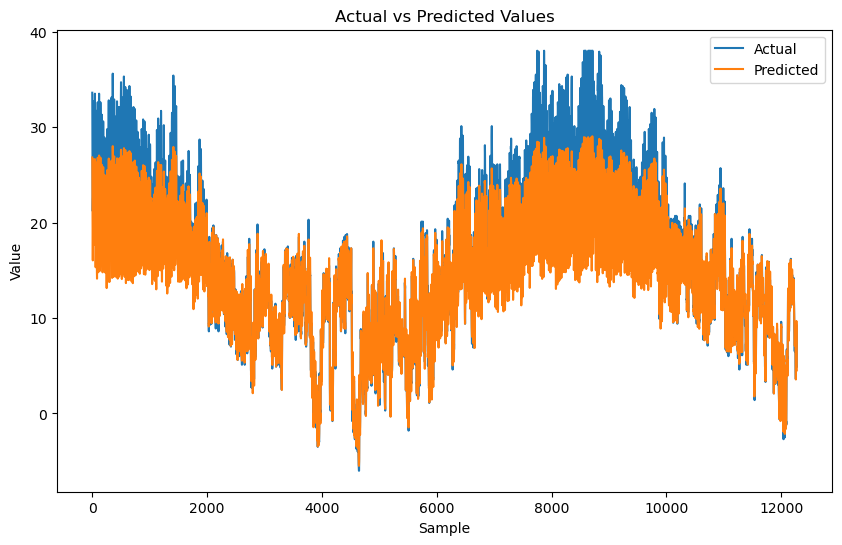

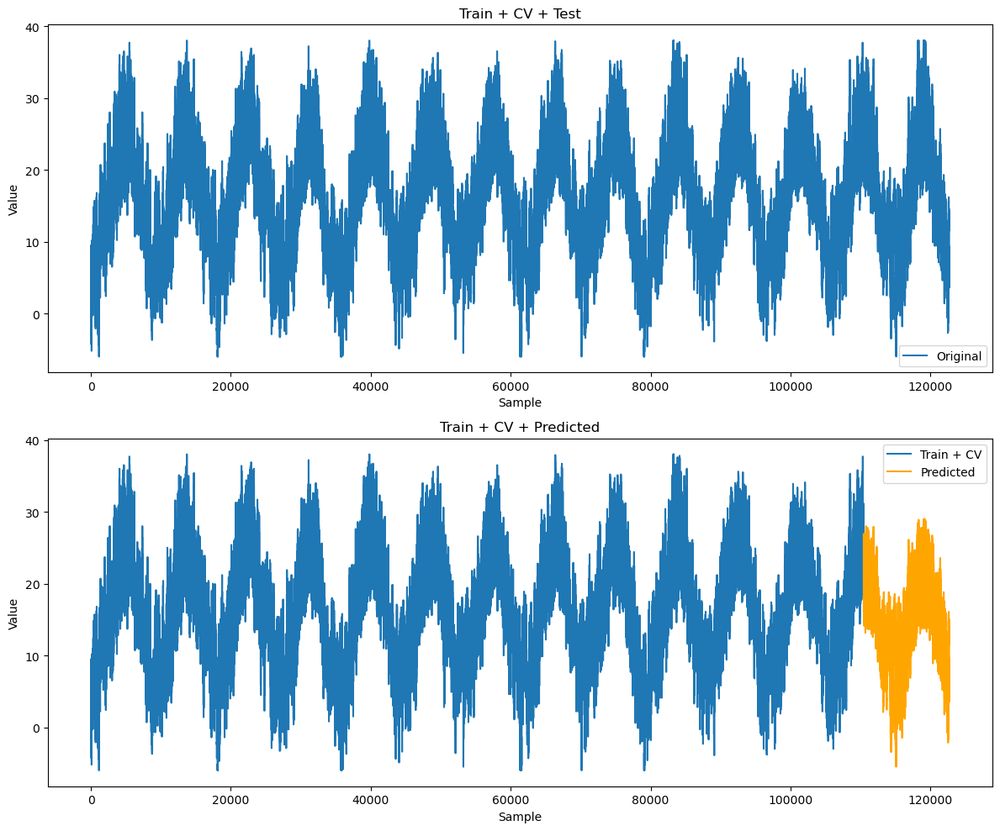

In [52]:
print(metrics)
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)

In [53]:
metrics

{'Name': 'Simple RNN, 32,16, ADAMAX MSE, batch 64, epochs 20, dropout 0.2',
 'MSE': 7.897633326973586,
 'MAE': 1.9780190815776768,
 'RMSE': 2.8102728207370875,
 'R2 Score': 0.8838086904013013}

In [54]:
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)
df_results

{'Name': 'Simple RNN, 32,16, ADAMAX MSE, batch 64, epochs 20, dropout 0.2', 'MSE': 7.897633326973586, 'MAE': 1.9780190815776768, 'RMSE': 2.8102728207370875, 'R2 Score': 0.8838086904013013}


,Name,MSE,MAE,RMSE,R2 Score
0,"Simple RNN, 32,16, ADAM MSE, Batch 64, epochs ...",1.964202,0.977420,1.401500,0.971102
1,"Simple RNN, 32,16, ADAMAX MSE, batch 64, epoch...",7.897633,1.978019,2.810273,0.883809


Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_4 (SimpleRNN)    (None, 1, 32)             1824      
                                                                 
 dropout_4 (Dropout)         (None, 1, 32)             0         
                                                                 
 simple_rnn_5 (SimpleRNN)    (None, 1, 16)             784       
                                                                 
 dropout_5 (Dropout)         (None, 1, 16)             0         
                                                                 
 dense_2 (Dense)             (None, 1, 1)              17        
                                                                 
Total params: 2625 (10.25 KB)
Trainable params: 2625 (10.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534/1534

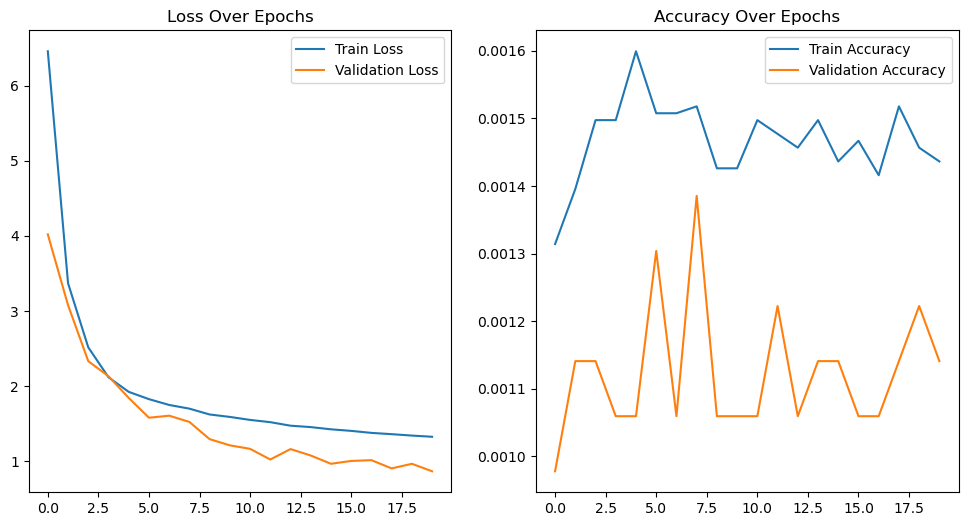

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 1s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[29.443655]
 [29.016562]
 [28.017084]
 ...
 [ 5.960623]
 [ 5.43624 ]
 [ 5.157702]]
Name: Simple RNN, 32,16, ADAM MAE, Batch 64, Epochs 20, dropout 0.2
MSE: 1.976923155785306
MAE: 0.9548356461511364
RMSE: 1.4060309938921354
R2 Score: 0.9709151740861196


In [55]:
model = SimpleRNN_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adam', loss='mae')

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "Simple RNN, 32,16, ADAM MAE, Batch 64, Epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")

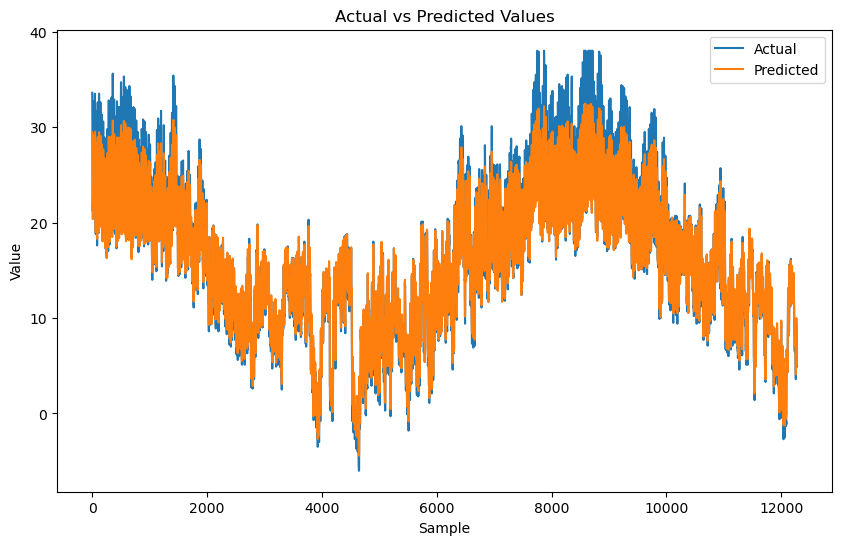

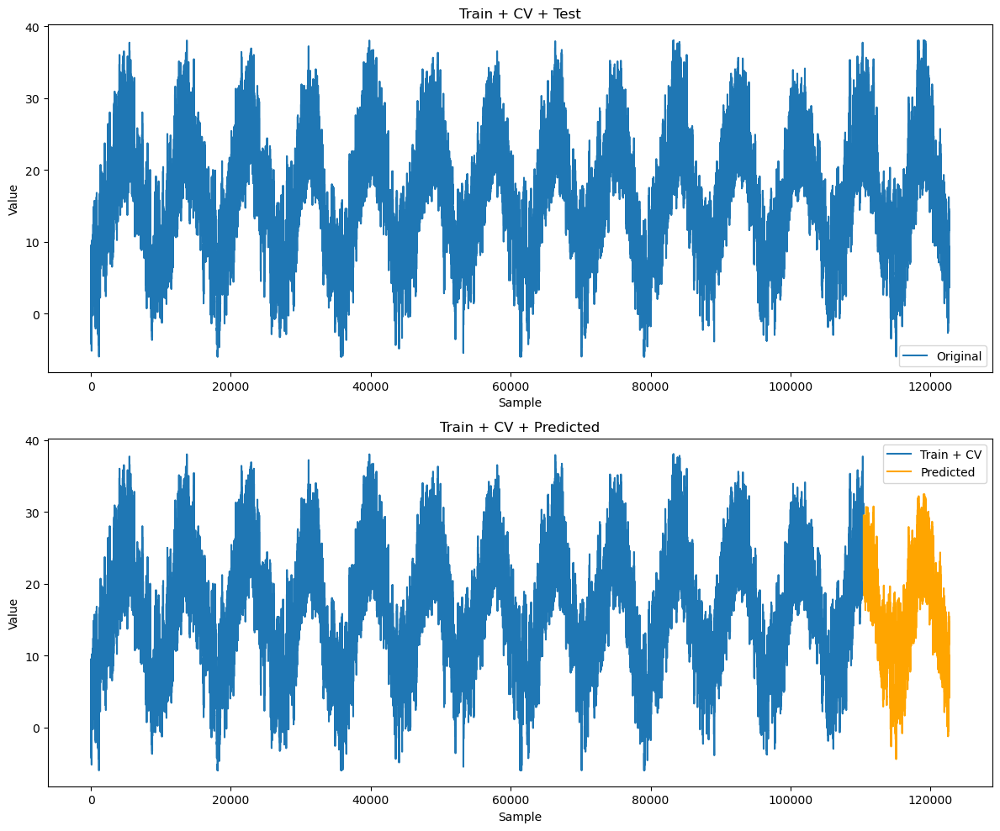

{'Name': 'Simple RNN, 32,16, ADAM MAE, Batch 64, Epochs 20, dropout 0.2', 'MSE': 1.976923155785306, 'MAE': 0.9548356461511364, 'RMSE': 1.4060309938921354, 'R2 Score': 0.9709151740861196}


In [56]:
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_6 (SimpleRNN)    (None, 1, 32)             1824      
                                                                 
 dropout_6 (Dropout)         (None, 1, 32)             0         
                                                                 
 simple_rnn_7 (SimpleRNN)    (None, 1, 16)             784       
                                                                 
 dropout_7 (Dropout)         (None, 1, 16)             0         
                                                                 
 dense_3 (Dense)             (None, 1, 1)              17        
                                                                 
Total params: 2625 (10.25 KB)
Trainable params: 2625 (10.25 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534/1534

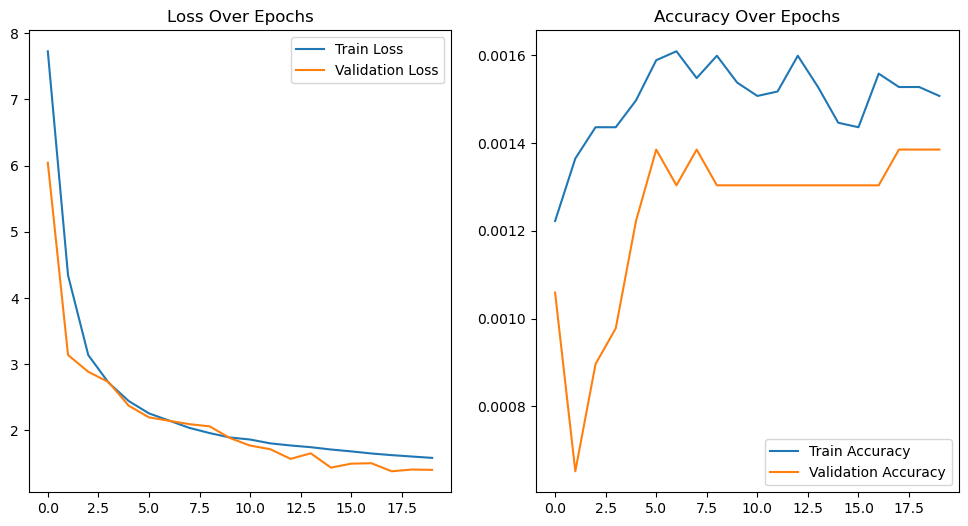

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 1s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[27.92947  ]
 [27.522385 ]
 [26.638905 ]
 ...
 [ 5.3393292]
 [ 4.829273 ]
 [ 4.409278 ]]
Name: Simple RNN, 32,16, ADAMAX MAE, Batch 64, Epochs 20, dropout 0.2
MSE: 4.374293163068647
MAE: 1.4673419784094823
RMSE: 2.0914810931654744
R2 Score: 0.9356446633892604


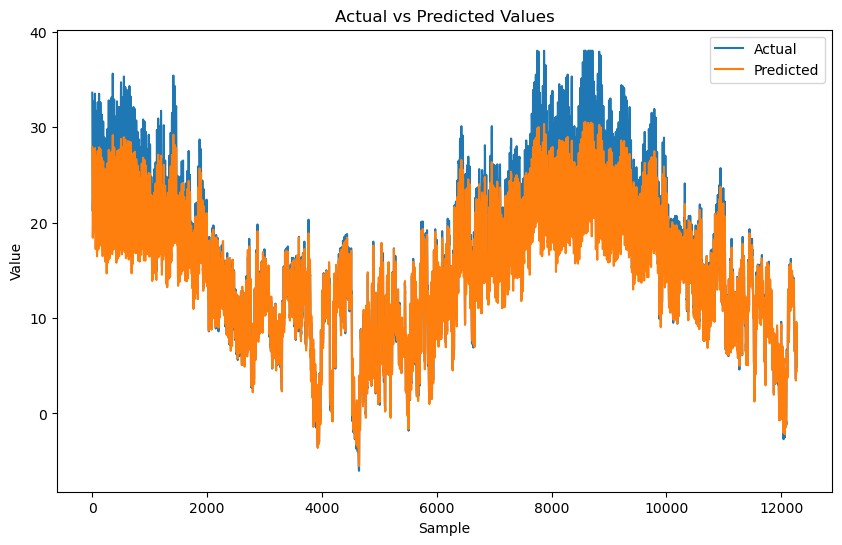

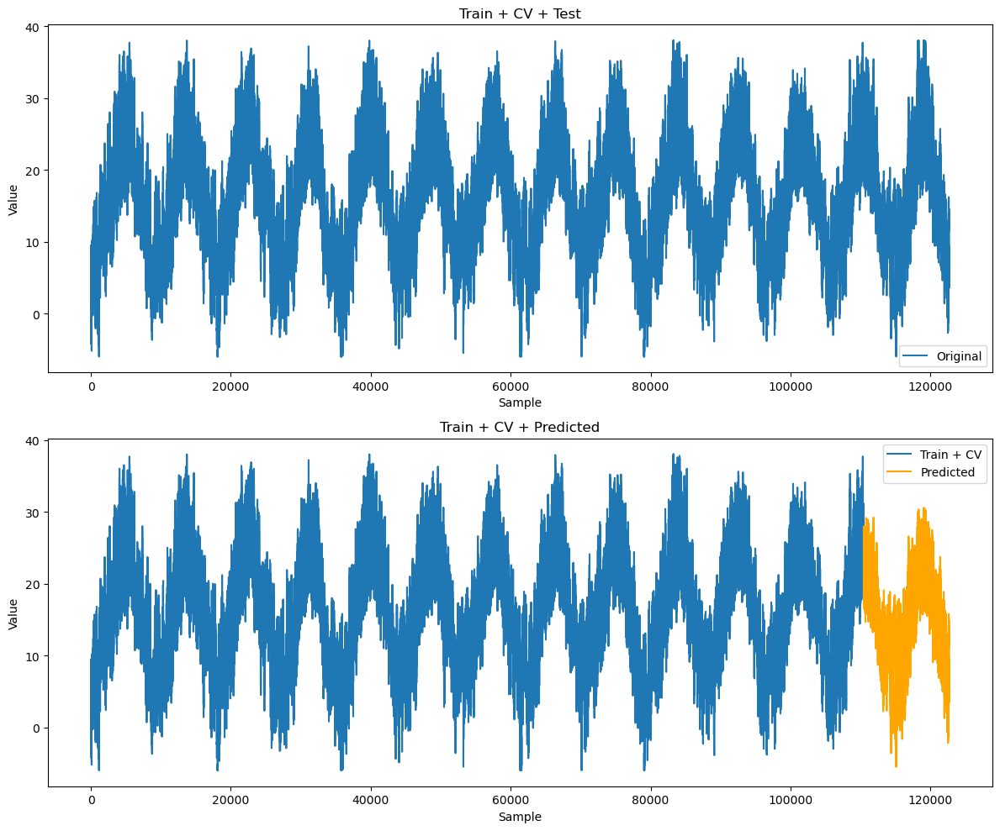

{'Name': 'Simple RNN, 32,16, ADAMAX MAE, Batch 64, Epochs 20, dropout 0.2', 'MSE': 4.374293163068647, 'MAE': 1.4673419784094823, 'RMSE': 2.0914810931654744, 'R2 Score': 0.9356446633892604}


In [57]:
model = SimpleRNN_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adamax', loss='mae')

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "Simple RNN, 32,16, ADAMAX MAE, Batch 64, Epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

In [58]:
df_results

,Name,MSE,MAE,RMSE,R2 Score
0,"Simple RNN, 32,16, ADAM MSE, Batch 64, epochs ...",1.964202,0.977420,1.401500,0.971102
1,"Simple RNN, 32,16, ADAMAX MSE, batch 64, epoch...",7.897633,1.978019,2.810273,0.883809
2,"Simple RNN, 32,16, ADAM MAE, Batch 64, Epochs ...",1.976923,0.954836,1.406031,0.970915
3,"Simple RNN, 32,16, ADAMAX MAE, Batch 64, Epoch...",4.374293,1.467342,2.091481,0.935645


Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 1, 32)             7296      
                                                                 
 dropout_8 (Dropout)         (None, 1, 32)             0         
                                                                 
 lstm_1 (LSTM)               (None, 1, 16)             3136      
                                                                 
 dropout_9 (Dropout)         (None, 1, 16)             0         
                                                                 
 dense_4 (Dense)             (None, 1, 1)              17        
                                                                 
Total params: 10449 (40.82 KB)
Trainable params: 10449 (40.82 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534/15

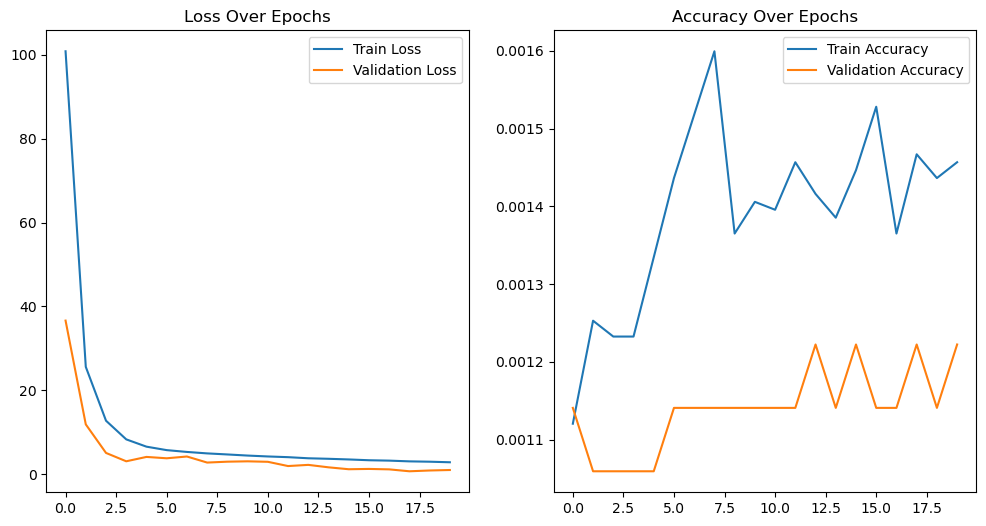

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 2s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[30.92146  ]
 [30.454582 ]
 [29.24385  ]
 ...
 [ 5.6441135]
 [ 5.0621014]
 [ 4.835779 ]]
Name: LSTM, 32,16, ADAM MSE, Batch 64, Epochs 20, dropout 0.2
MSE: 1.170285451210028
MAE: 0.7916492905227006
RMSE: 1.081797324460561
R2 Score: 0.9827825636427079


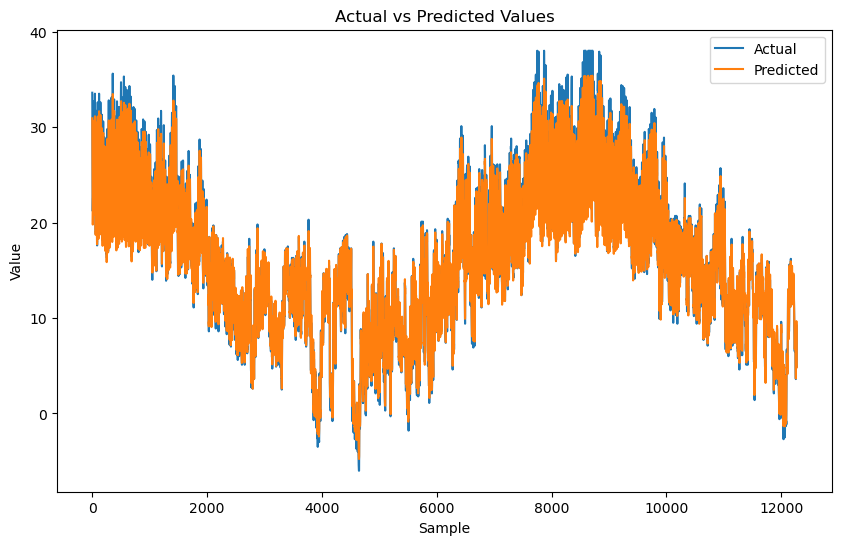

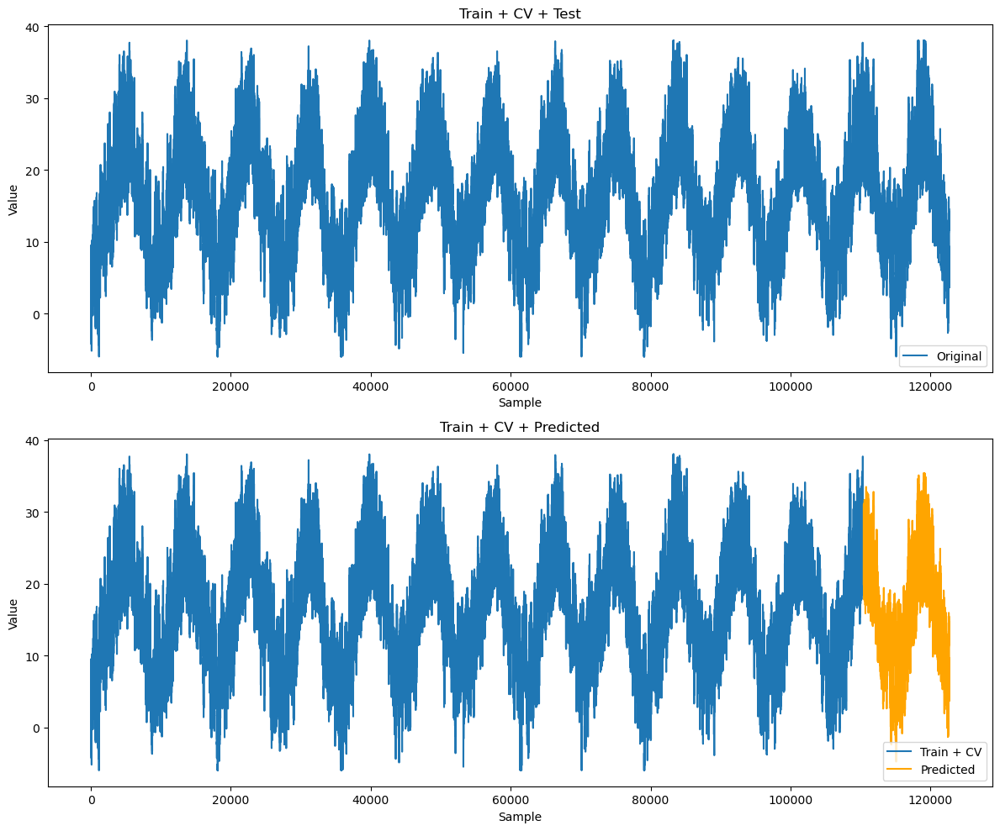

{'Name': 'LSTM, 32,16, ADAM MSE, Batch 64, Epochs 20, dropout 0.2', 'MSE': 1.170285451210028, 'MAE': 0.7916492905227006, 'RMSE': 1.081797324460561, 'R2 Score': 0.9827825636427079}


In [59]:
model = LSTM_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adam', loss='mse')

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "LSTM, 32,16, ADAM MSE, Batch 64, Epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

In [60]:
df_results

,Name,MSE,MAE,RMSE,R2 Score
0,"Simple RNN, 32,16, ADAM MSE, Batch 64, epochs ...",1.964202,0.977420,1.401500,0.971102
1,"Simple RNN, 32,16, ADAMAX MSE, batch 64, epoch...",7.897633,1.978019,2.810273,0.883809
2,"Simple RNN, 32,16, ADAM MAE, Batch 64, Epochs ...",1.976923,0.954836,1.406031,0.970915
3,"Simple RNN, 32,16, ADAMAX MAE, Batch 64, Epoch...",4.374293,1.467342,2.091481,0.935645
4,"LSTM, 32,16, ADAM MSE, Batch 64, Epochs 20, dr...",1.170285,0.791649,1.081797,0.982783


Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_2 (LSTM)               (None, 1, 32)             7296      
                                                                 
 dropout_10 (Dropout)        (None, 1, 32)             0         
                                                                 
 lstm_3 (LSTM)               (None, 1, 16)             3136      
                                                                 
 dropout_11 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_5 (Dense)             (None, 1, 1)              17        
                                                                 
Total params: 10449 (40.82 KB)
Trainable params: 10449 (40.82 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534/15

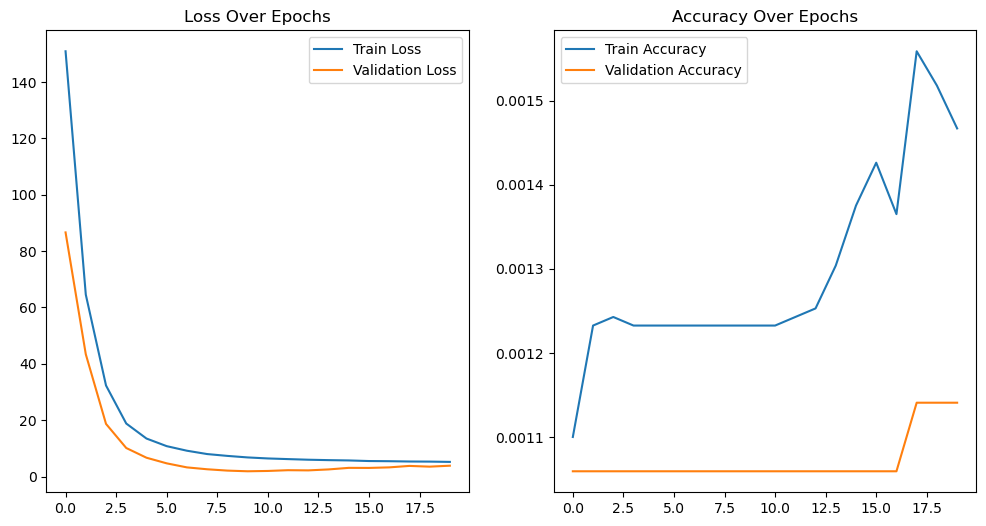

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 2s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[27.99821  ]
 [27.82041  ]
 [27.374647 ]
 ...
 [ 5.070779 ]
 [ 4.6356535]
 [ 4.3722124]]
Name: LSTM, 32,16, ADAMAX MSE, Batch 64, Epochs 20, dropout 0.2
MSE: 3.089672230269483
MAE: 1.192901386723873
RMSE: 1.7577463498097452
R2 Score: 0.9545442225787264


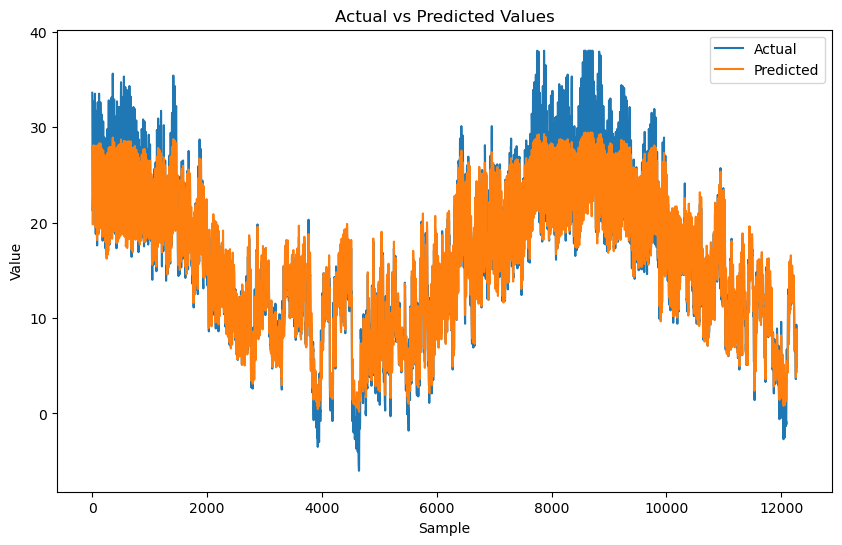

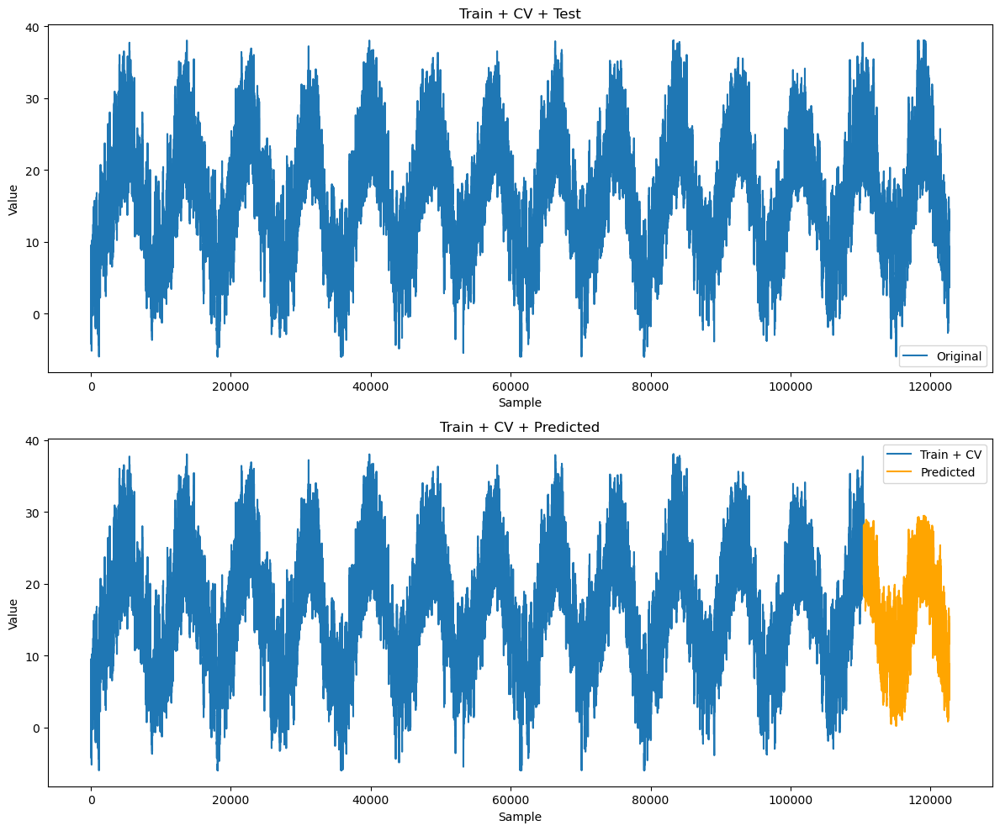

{'Name': 'LSTM, 32,16, ADAMAX MSE, Batch 64, Epochs 20, dropout 0.2', 'MSE': 3.089672230269483, 'MAE': 1.192901386723873, 'RMSE': 1.7577463498097452, 'R2 Score': 0.9545442225787264}


In [61]:
model = LSTM_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adamax', loss='mse')

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "LSTM, 32,16, ADAMAX MSE, Batch 64, Epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_4 (LSTM)               (None, 1, 32)             7296      
                                                                 
 dropout_12 (Dropout)        (None, 1, 32)             0         
                                                                 
 lstm_5 (LSTM)               (None, 1, 16)             3136      
                                                                 
 dropout_13 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_6 (Dense)             (None, 1, 1)              17        
                                                                 
Total params: 10449 (40.82 KB)
Trainable params: 10449 (40.82 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534/15

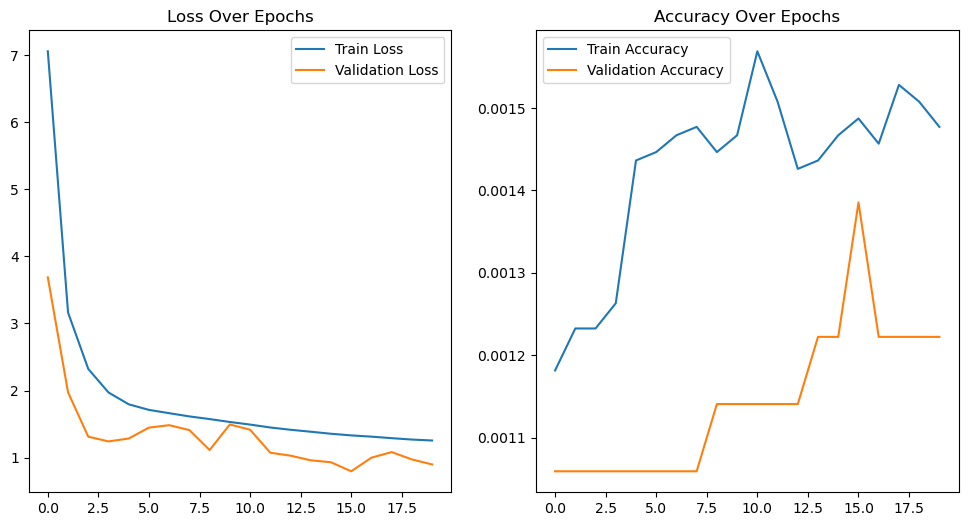

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 2s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[29.749903 ]
 [29.273617 ]
 [28.0943   ]
 ...
 [ 5.622858 ]
 [ 5.0853333]
 [ 4.870466 ]]
Name: LSTM, 32,16, ADAM MAE, Batch 64, Epochs 20, dropout 0.2
MSE: 1.8615029789003712
MAE: 0.9517724836419588
RMSE: 1.3643690772296078
R2 Score: 0.9726132551378912


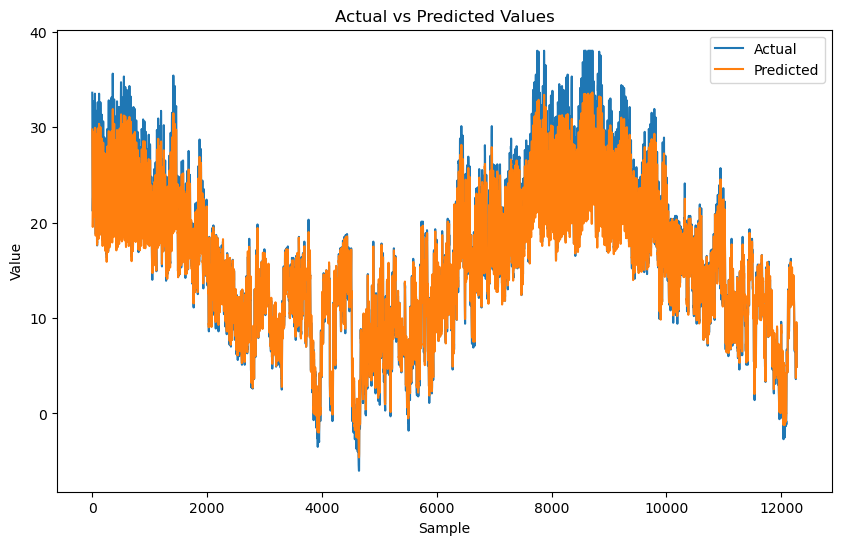

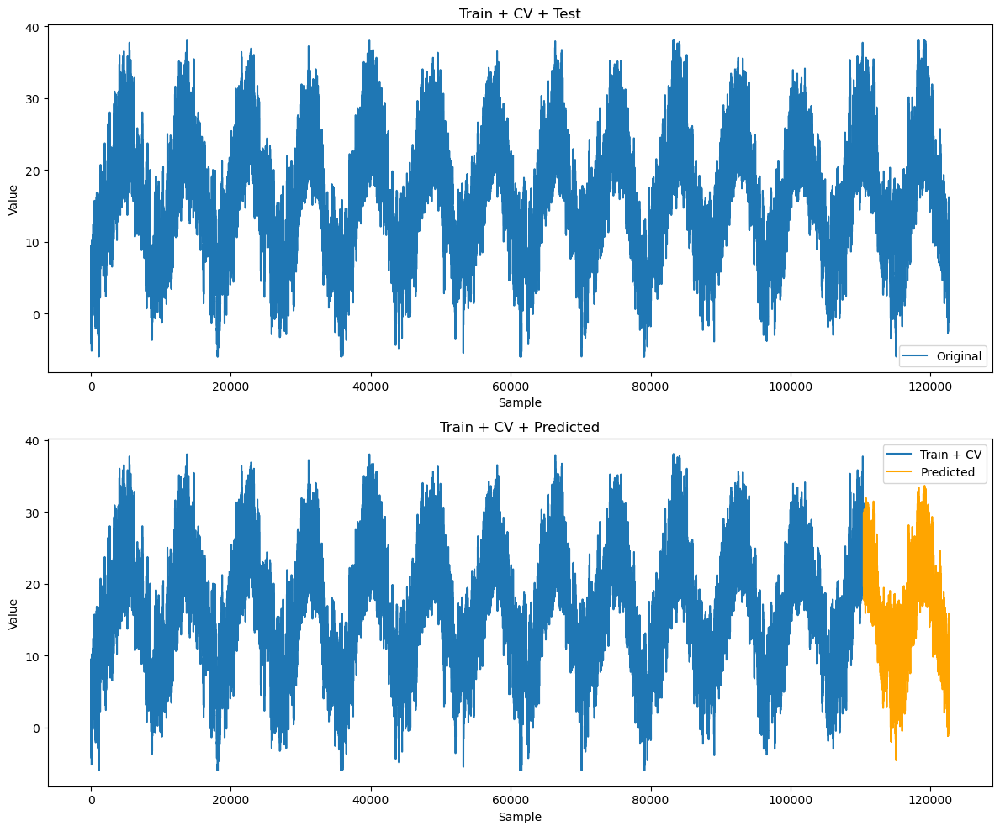

{'Name': 'LSTM, 32,16, ADAM MAE, Batch 64, Epochs 20, dropout 0.2', 'MSE': 1.8615029789003712, 'MAE': 0.9517724836419588, 'RMSE': 1.3643690772296078, 'R2 Score': 0.9726132551378912}


In [62]:
model = LSTM_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adam', loss='mae')

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "LSTM, 32,16, ADAM MAE, Batch 64, Epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

Model: "sequential_7"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_6 (LSTM)               (None, 1, 32)             7296      
                                                                 
 dropout_14 (Dropout)        (None, 1, 32)             0         
                                                                 
 lstm_7 (LSTM)               (None, 1, 16)             3136      
                                                                 
 dropout_15 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_7 (Dense)             (None, 1, 1)              17        
                                                                 
Total params: 10449 (40.82 KB)
Trainable params: 10449 (40.82 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534/15

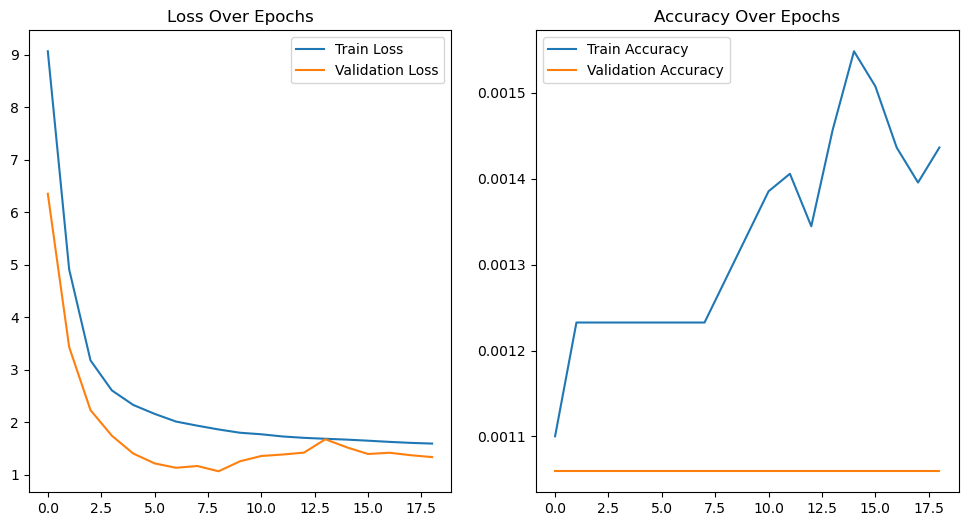

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 2s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[27.631367 ]
 [27.364048 ]
 [26.796509 ]
 ...
 [ 4.881091 ]
 [ 4.3884716]
 [ 4.2821975]]
Name: LSTM, 32,16, ADAMAX MAE, Batch 64, Epochs 20, dropout 0.2
MSE: 3.4094644917283423
MAE: 1.2378808312909195
RMSE: 1.8464735285750355
R2 Score: 0.9498393850508143


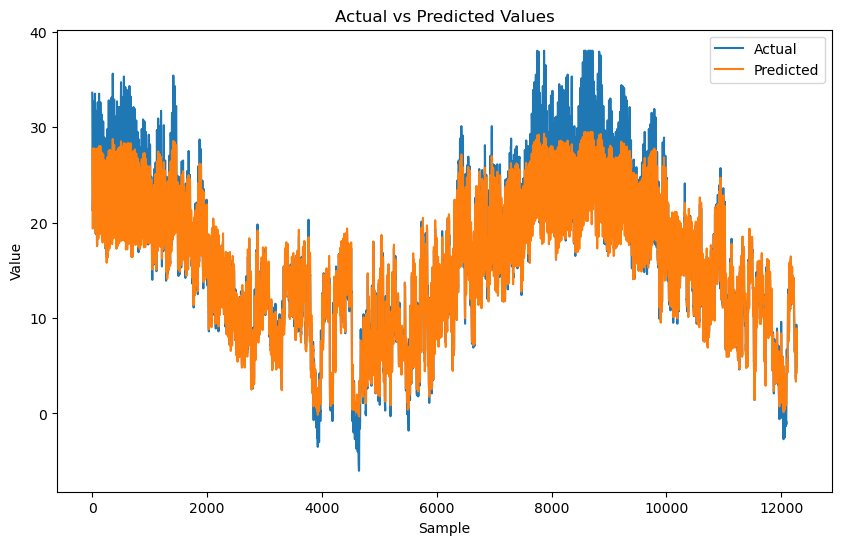

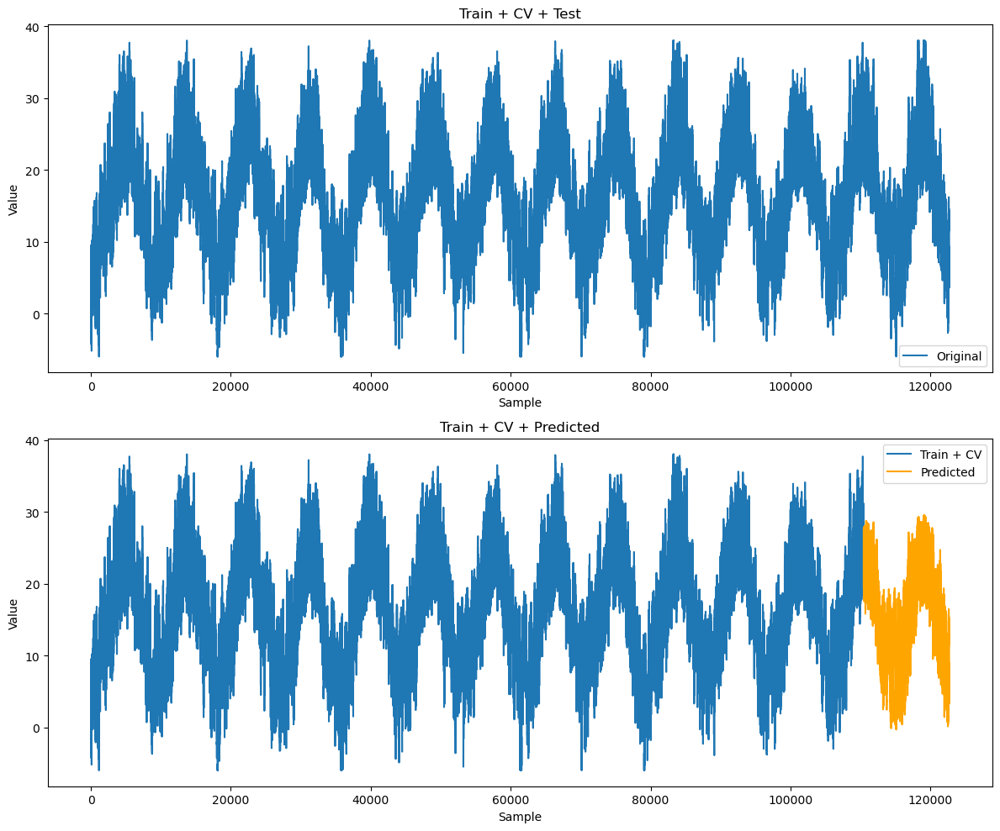

{'Name': 'LSTM, 32,16, ADAMAX MAE, Batch 64, Epochs 20, dropout 0.2', 'MSE': 3.4094644917283423, 'MAE': 1.2378808312909195, 'RMSE': 1.8464735285750355, 'R2 Score': 0.9498393850508143}


In [63]:
model = LSTM_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adamax', loss='mae')

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "LSTM, 32,16, ADAMAX MAE, Batch 64, Epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

In [64]:
df_results

,Name,MSE,MAE,RMSE,R2 Score
0,"Simple RNN, 32,16, ADAM MSE, Batch 64, epochs ...",1.964202,0.977420,1.401500,0.971102
1,"Simple RNN, 32,16, ADAMAX MSE, batch 64, epoch...",7.897633,1.978019,2.810273,0.883809
2,"Simple RNN, 32,16, ADAM MAE, Batch 64, Epochs ...",1.976923,0.954836,1.406031,0.970915
3,"Simple RNN, 32,16, ADAMAX MAE, Batch 64, Epoch...",4.374293,1.467342,2.091481,0.935645
4,"LSTM, 32,16, ADAM MSE, Batch 64, Epochs 20, dr...",1.170285,0.791649,1.081797,0.982783
5,"LSTM, 32,16, ADAMAX MSE, Batch 64, Epochs 20, ...",3.089672,1.192901,1.757746,0.954544
6,"LSTM, 32,16, ADAM MAE, Batch 64, Epochs 20, dr...",1.861503,0.951772,1.364369,0.972613
7,"LSTM, 32,16, ADAMAX MAE, Batch 64, Epochs 20, ...",3.409464,1.237881,1.846474,0.949839


Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru (GRU)                   (None, 1, 32)             5568      
                                                                 
 dropout_16 (Dropout)        (None, 1, 32)             0         
                                                                 
 gru_1 (GRU)                 (None, 1, 16)             2400      
                                                                 
 dropout_17 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_8 (Dense)             (None, 1, 1)              17        
                                                                 
Total params: 7985 (31.19 KB)
Trainable params: 7985 (31.19 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534/1534

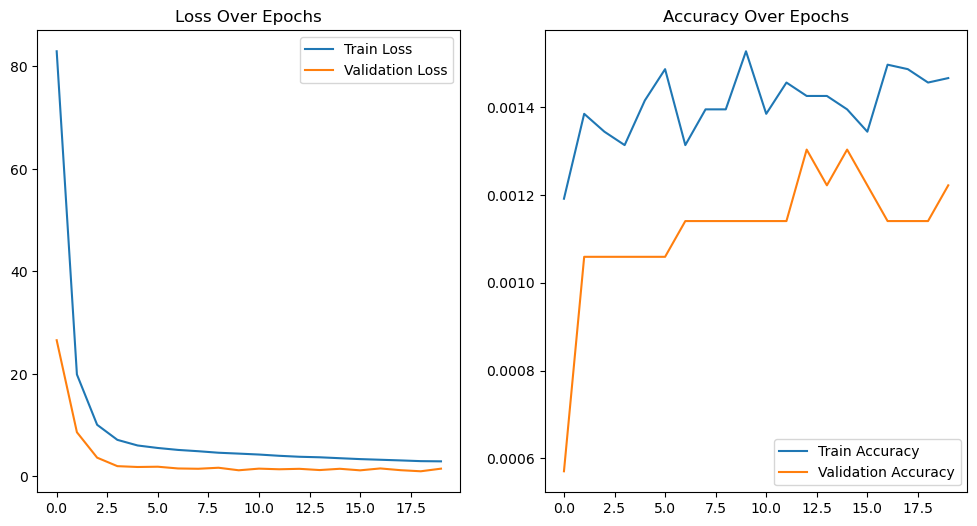

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 2s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[30.337128 ]
 [29.89764  ]
 [28.671013 ]
 ...
 [ 5.5619874]
 [ 5.0983467]
 [ 4.9172726]]
Name: GRU, 32,16, ADAM MSE, Batch 64, Epochs 20, dropout 0.2
MSE: 1.7214552897435829
MAE: 0.972279436708167
RMSE: 1.3120424115643452
R2 Score: 0.9746736602916507


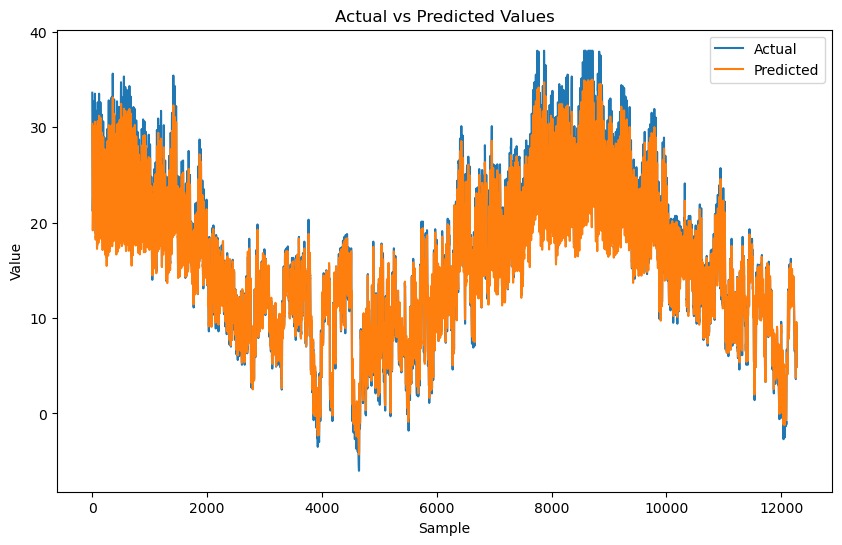

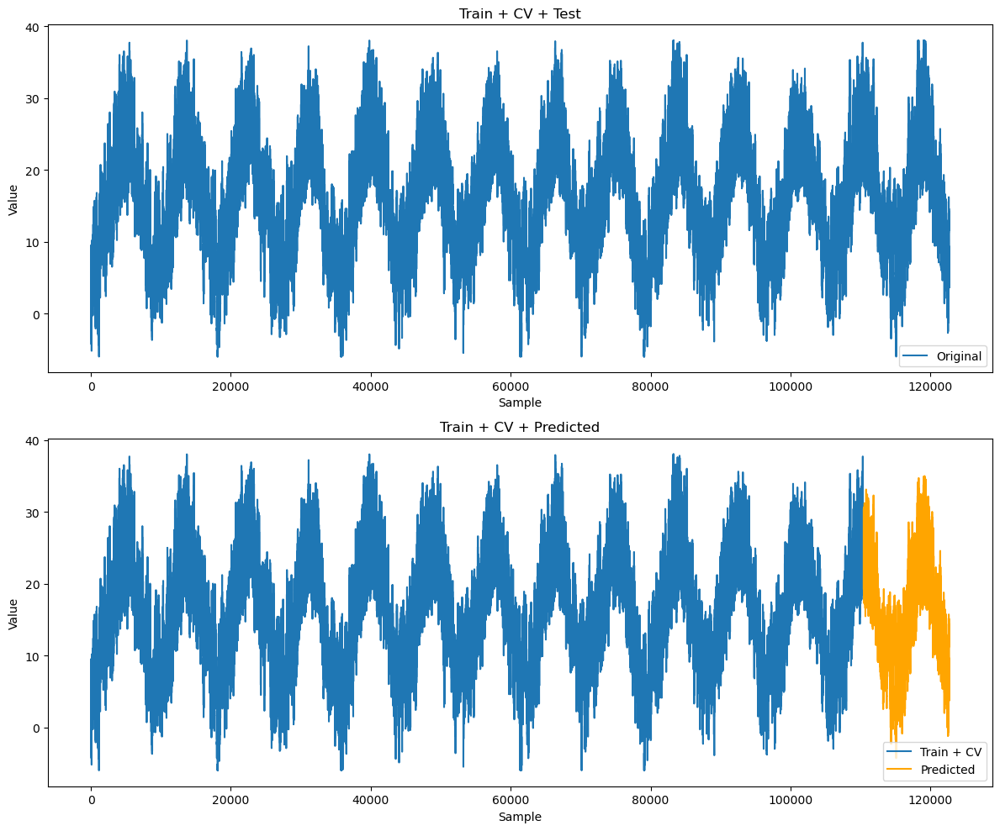

{'Name': 'GRU, 32,16, ADAM MSE, Batch 64, Epochs 20, dropout 0.2', 'MSE': 1.7214552897435829, 'MAE': 0.972279436708167, 'RMSE': 1.3120424115643452, 'R2 Score': 0.9746736602916507}


In [65]:
model = GRU_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adam', loss='mse')

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "GRU, 32,16, ADAM MSE, Batch 64, Epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_2 (GRU)                 (None, 1, 32)             5568      
                                                                 
 dropout_18 (Dropout)        (None, 1, 32)             0         
                                                                 
 gru_3 (GRU)                 (None, 1, 16)             2400      
                                                                 
 dropout_19 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_9 (Dense)             (None, 1, 1)              17        
                                                                 
Total params: 7985 (31.19 KB)
Trainable params: 7985 (31.19 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534/1534

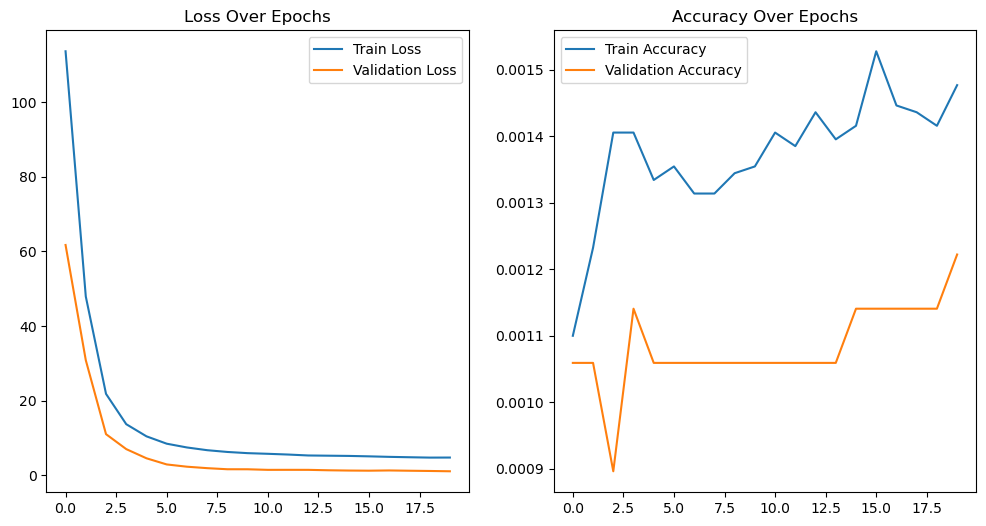

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 2s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[30.022896 ]
 [29.566542 ]
 [28.58658  ]
 ...
 [ 4.929207 ]
 [ 4.5663986]
 [ 4.554195 ]]
Name: GRU, 32,16, ADAMAX MSE, Batch 64, Epochs 20, dropout 0.2
MSE: 1.5830555405042197
MAE: 0.8953033452764154
RMSE: 1.2581953506924988
R2 Score: 0.9767098206762219


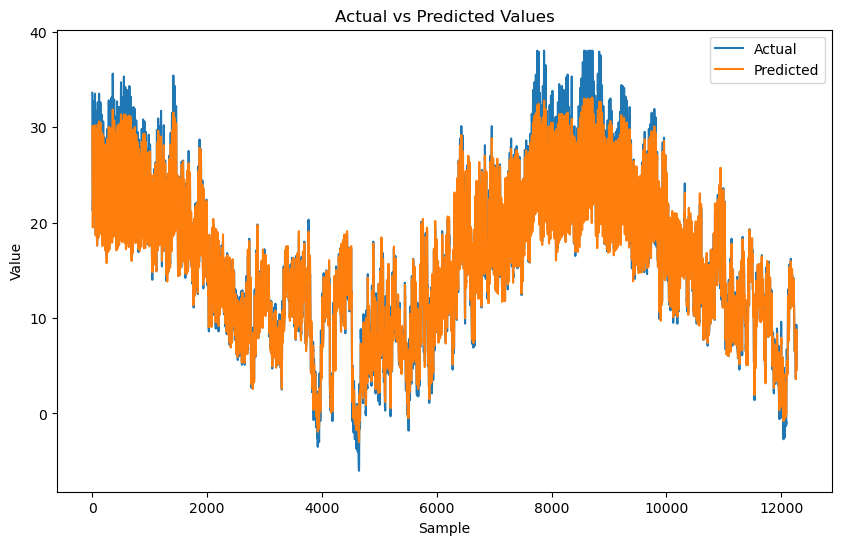

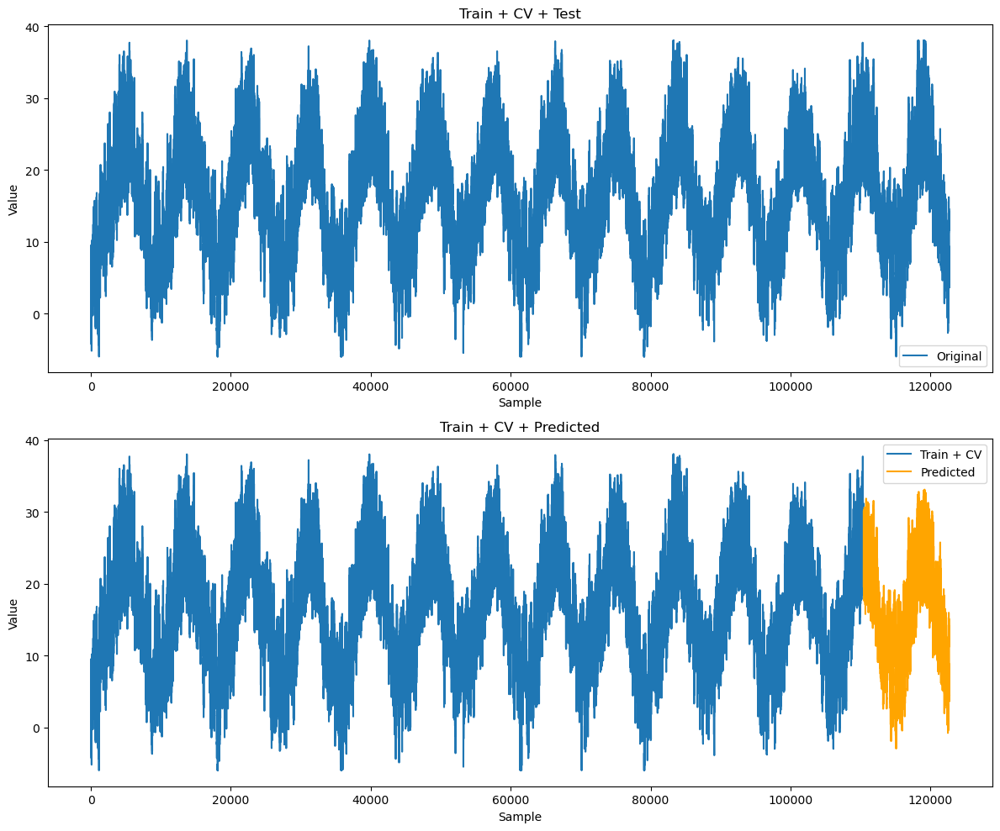

{'Name': 'GRU, 32,16, ADAMAX MSE, Batch 64, Epochs 20, dropout 0.2', 'MSE': 1.5830555405042197, 'MAE': 0.8953033452764154, 'RMSE': 1.2581953506924988, 'R2 Score': 0.9767098206762219}


In [66]:
model = GRU_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adamax', loss='mse')

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "GRU, 32,16, ADAMAX MSE, Batch 64, Epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

Model: "sequential_10"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_4 (GRU)                 (None, 1, 32)             5568      
                                                                 
 dropout_20 (Dropout)        (None, 1, 32)             0         
                                                                 
 gru_5 (GRU)                 (None, 1, 16)             2400      
                                                                 
 dropout_21 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_10 (Dense)            (None, 1, 1)              17        
                                                                 
Total params: 7985 (31.19 KB)
Trainable params: 7985 (31.19 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534/153

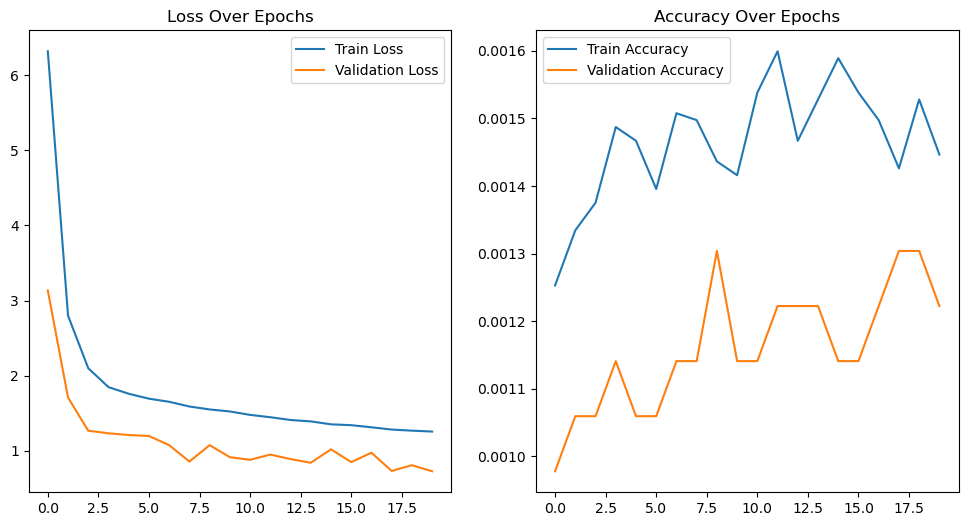

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 2s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[30.858139 ]
 [30.348467 ]
 [29.145847 ]
 ...
 [ 5.770745 ]
 [ 5.258983 ]
 [ 5.0519648]]
Name: GRU, 32,16, ADAM MAE, Batch 64, Epochs 20, dropout 0.2
MSE: 1.1049685552636717
MAE: 0.7677217528013911
RMSE: 1.0511748452392073
R2 Score: 0.9837435167997769


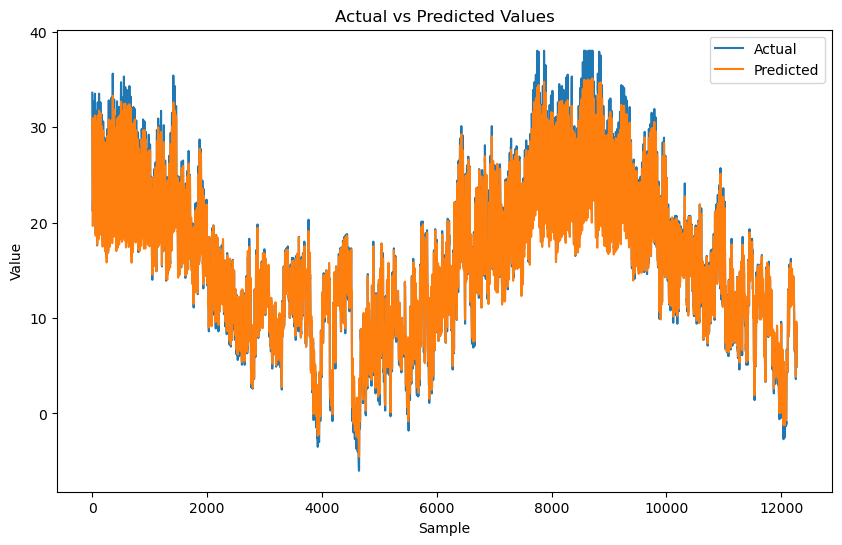

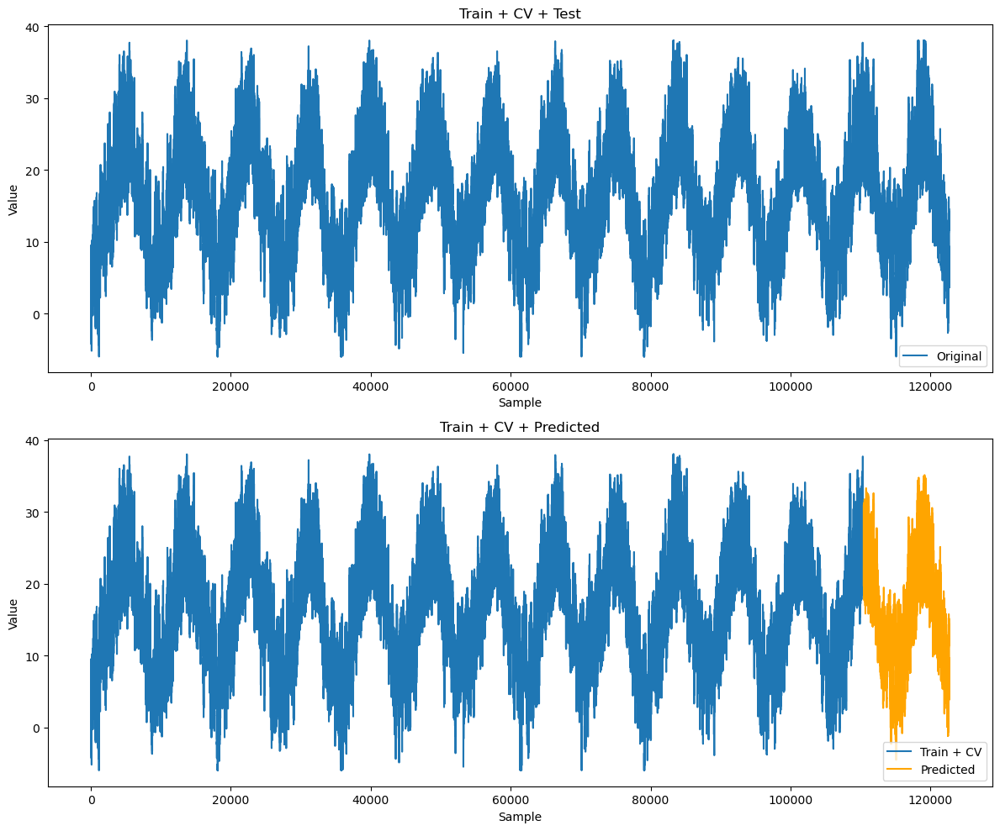

{'Name': 'GRU, 32,16, ADAM MAE, Batch 64, Epochs 20, dropout 0.2', 'MSE': 1.1049685552636717, 'MAE': 0.7677217528013911, 'RMSE': 1.0511748452392073, 'R2 Score': 0.9837435167997769}


In [67]:
model = GRU_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adam', loss='mae')

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "GRU, 32,16, ADAM MAE, Batch 64, Epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

Model: "sequential_11"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_6 (GRU)                 (None, 1, 32)             5568      
                                                                 
 dropout_22 (Dropout)        (None, 1, 32)             0         
                                                                 
 gru_7 (GRU)                 (None, 1, 16)             2400      
                                                                 
 dropout_23 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_11 (Dense)            (None, 1, 1)              17        
                                                                 
Total params: 7985 (31.19 KB)
Trainable params: 7985 (31.19 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534/153

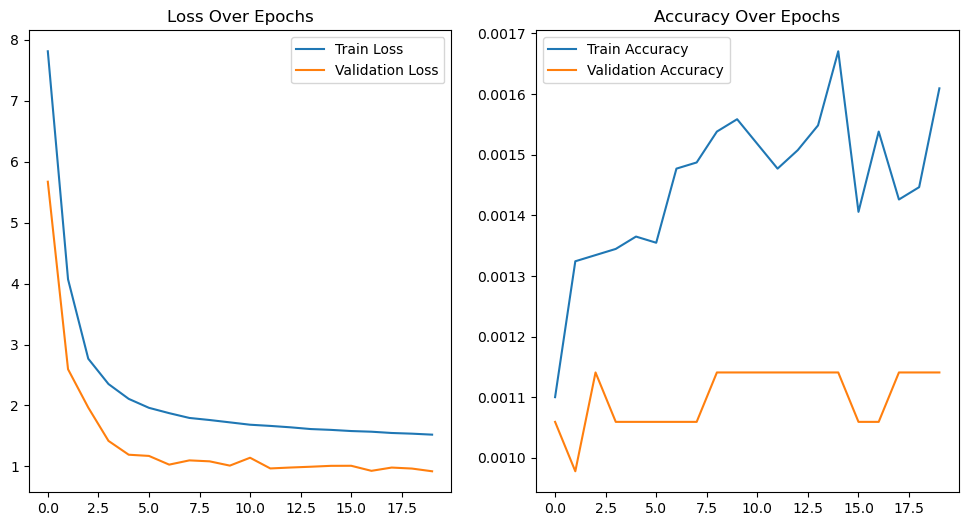

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 1s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[29.517637 ]
 [29.005701 ]
 [27.958948 ]
 ...
 [ 5.1205783]
 [ 4.7160497]
 [ 4.6429114]]
Name: GRU, 32,16, ADAMAX MAE, Batch 64, Epochs 20, dropout 0.2
MSE: 2.001388950921801
MAE: 1.0073124446065294
RMSE: 1.4147045454517353
R2 Score: 0.9705552291938221


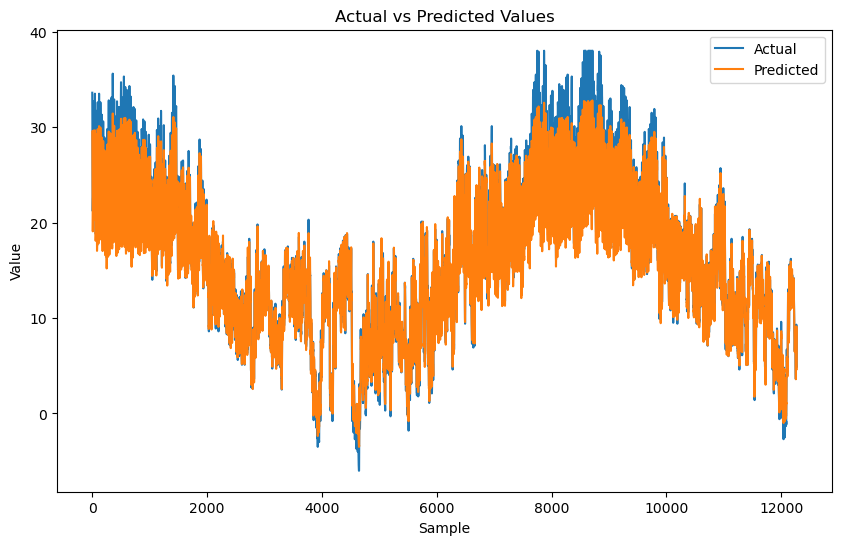

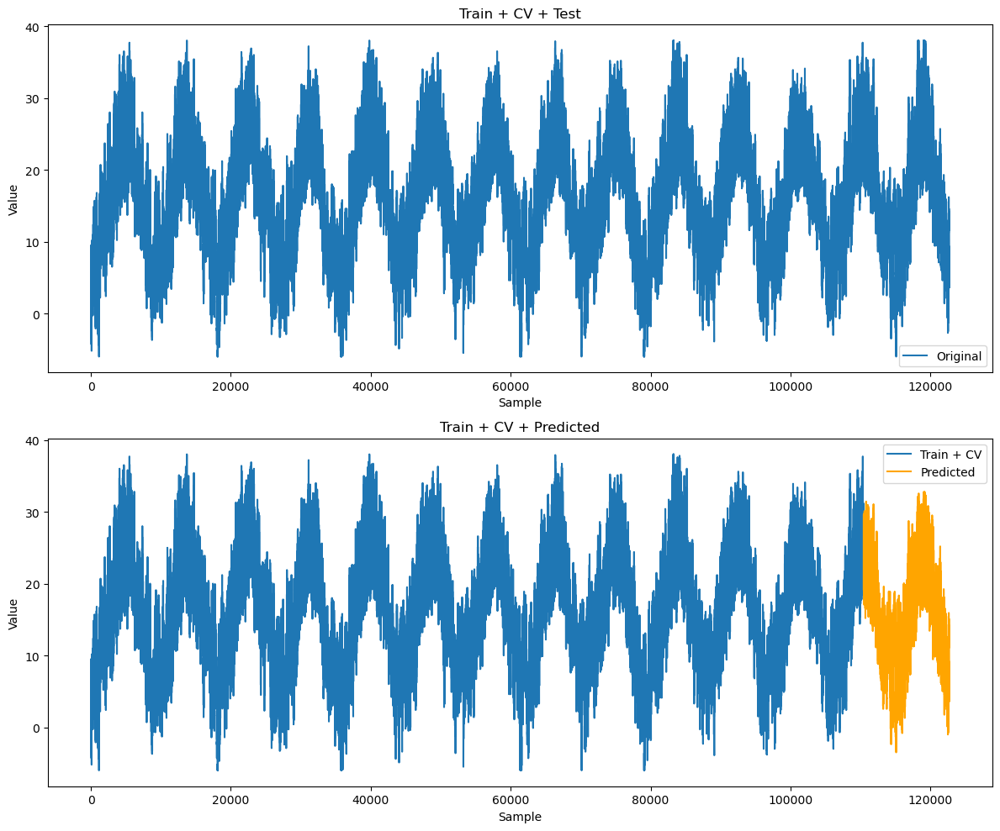

{'Name': 'GRU, 32,16, ADAMAX MAE, Batch 64, Epochs 20, dropout 0.2', 'MSE': 2.001388950921801, 'MAE': 1.0073124446065294, 'RMSE': 1.4147045454517353, 'R2 Score': 0.9705552291938221}


In [68]:
model = GRU_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adamax', loss='mae')

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "GRU, 32,16, ADAMAX MAE, Batch 64, Epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

In [69]:
df_results

,Name,MSE,MAE,RMSE,R2 Score
0,"Simple RNN, 32,16, ADAM MSE, Batch 64, epochs ...",1.964202,0.977420,1.401500,0.971102
1,"Simple RNN, 32,16, ADAMAX MSE, batch 64, epoch...",7.897633,1.978019,2.810273,0.883809
2,"Simple RNN, 32,16, ADAM MAE, Batch 64, Epochs ...",1.976923,0.954836,1.406031,0.970915
3,"Simple RNN, 32,16, ADAMAX MAE, Batch 64, Epoch...",4.374293,1.467342,2.091481,0.935645
4,"LSTM, 32,16, ADAM MSE, Batch 64, Epochs 20, dr...",1.170285,0.791649,1.081797,0.982783
5,"LSTM, 32,16, ADAMAX MSE, Batch 64, Epochs 20, ...",3.089672,1.192901,1.757746,0.954544
6,"LSTM, 32,16, ADAM MAE, Batch 64, Epochs 20, dr...",1.861503,0.951772,1.364369,0.972613
7,"LSTM, 32,16, ADAMAX MAE, Batch 64, Epochs 20, ...",3.409464,1.237881,1.846474,0.949839
8,"GRU, 32,16, ADAM MSE, Batch 64, Epochs 20, dro...",1.721455,0.972279,1.312042,0.974674
9,"GRU, 32,16, ADAMAX MSE, Batch 64, Epochs 20, d...",1.583056,0.895303,1.258195,0.976710


In [70]:
df_lagged = create_lagged_dataset(df_outliers_clipped, 24)
target_cols = ['Temperature(t)']
train_X_scaled, train_y, val_X_scaled, val_y, test_X_scaled, test_y, scaler = scale_and_split(df_lagged, target_cols)

train_X_simple_rnn = train_X_scaled.reshape((train_X_scaled.shape[0], 1, train_X_scaled.shape[1]))
val_X_simple_rnn = val_X_scaled.reshape((val_X_scaled.shape[0], 1, val_X_scaled.shape[1]))
test_X_simple_rnn = test_X_scaled.reshape((test_X_scaled.shape[0], 1, test_X_scaled.shape[1]))

train_y_simple_rnn = train_y.values if hasattr(train_y, 'values') else train_y
val_y_simple_rnn = val_y.values if hasattr(val_y, 'values') else val_y
test_y_simple_rnn = test_y.values if hasattr(test_y, 'values') else test_y

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_8 (SimpleRNN)    (None, 1, 32)             7424      
                                                                 
 dropout_24 (Dropout)        (None, 1, 32)             0         
                                                                 
 simple_rnn_9 (SimpleRNN)    (None, 1, 16)             784       
                                                                 
 dropout_25 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_12 (Dense)            (None, 1, 1)              17        
                                                                 
Total params: 8225 (32.13 KB)
Trainable params: 8225 (32.13 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534/153

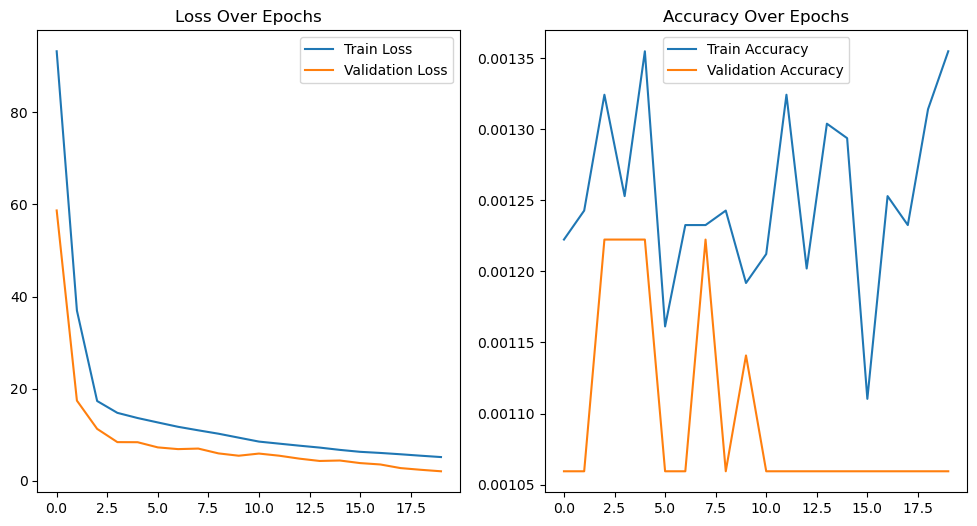

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 1s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[29.314373 ]
 [28.950066 ]
 [27.914612 ]
 ...
 [ 6.649352 ]
 [ 6.434168 ]
 [ 6.2927027]]
Name: Simple RNN multivariate, 32,16, ADAM MSE, Batch 64, Epochs 20, dropout 0.2
MSE: 2.861329833913449
MAE: 1.305224350986849
RMSE: 1.6915465804740493
R2 Score: 0.9579036343127325


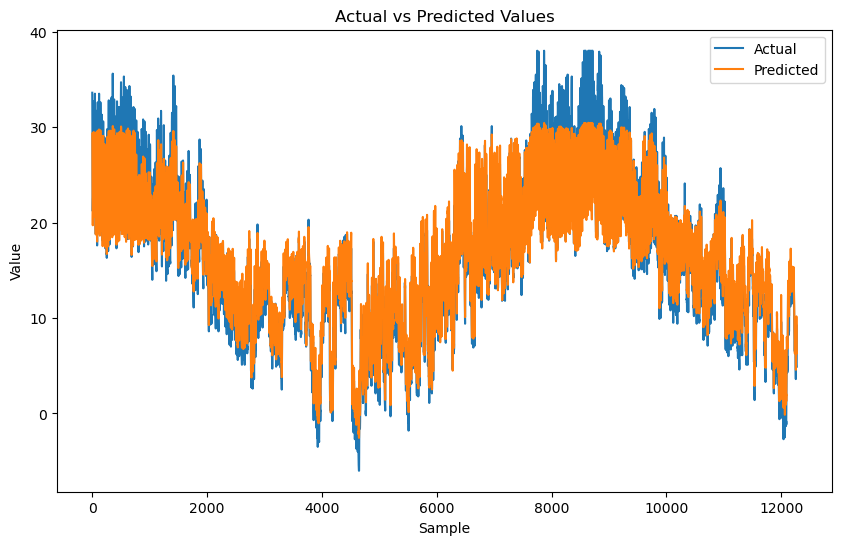

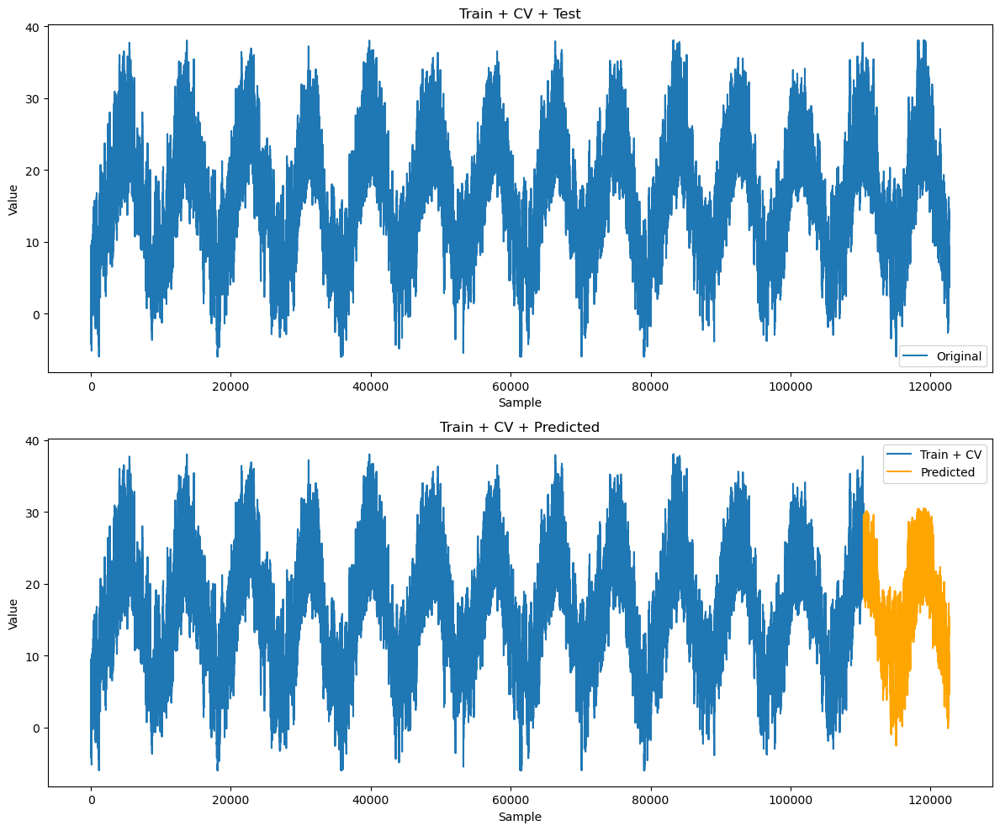

{'Name': 'Simple RNN multivariate, 32,16, ADAM MSE, Batch 64, Epochs 20, dropout 0.2', 'MSE': 2.861329833913449, 'MAE': 1.305224350986849, 'RMSE': 1.6915465804740493, 'R2 Score': 0.9579036343127325}


In [71]:
model = SimpleRNN_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adam', loss='mse')

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "Simple RNN multivariate, 32,16, ADAM MSE, Batch 64, Epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_10 (SimpleRNN)   (None, 1, 32)             7424      
                                                                 
 dropout_26 (Dropout)        (None, 1, 32)             0         
                                                                 
 simple_rnn_11 (SimpleRNN)   (None, 1, 16)             784       
                                                                 
 dropout_27 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_13 (Dense)            (None, 1, 1)              17        
                                                                 
Total params: 8225 (32.13 KB)
Trainable params: 8225 (32.13 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534/153

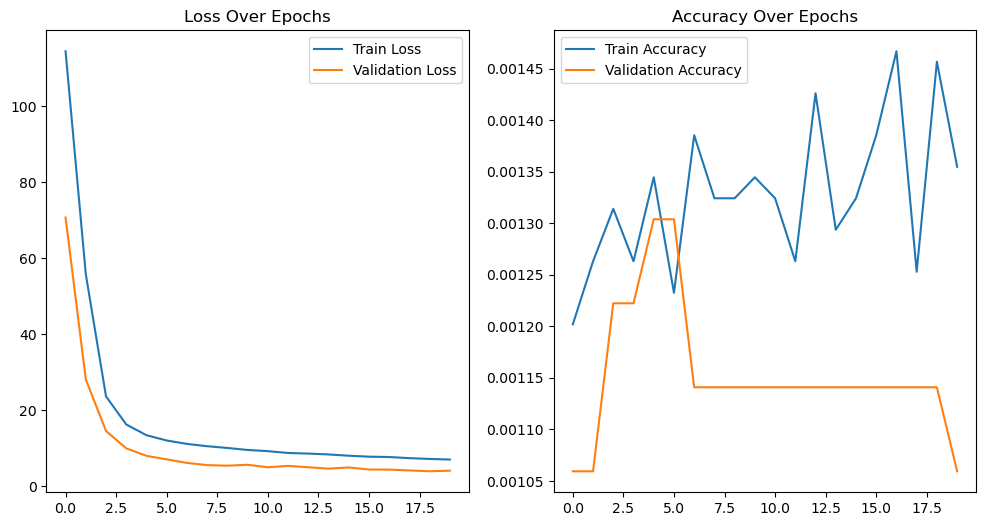

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 1s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[27.277542 ]
 [26.826328 ]
 [25.917805 ]
 ...
 [ 6.375161 ]
 [ 5.9951077]
 [ 5.8062925]]
Name: Simple RNN multivariate, 32,16, ADAMAX MSE, Batch 64, Epochs 20, dropout 0.2
MSE: 5.6396361924467735
MAE: 1.770029091316256
RMSE: 2.3747918208648886
R2 Score: 0.9170287239567609


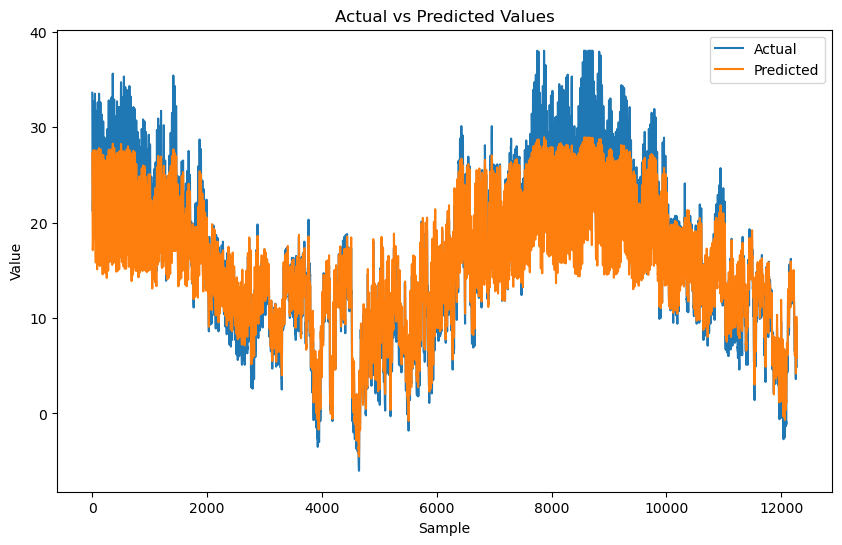

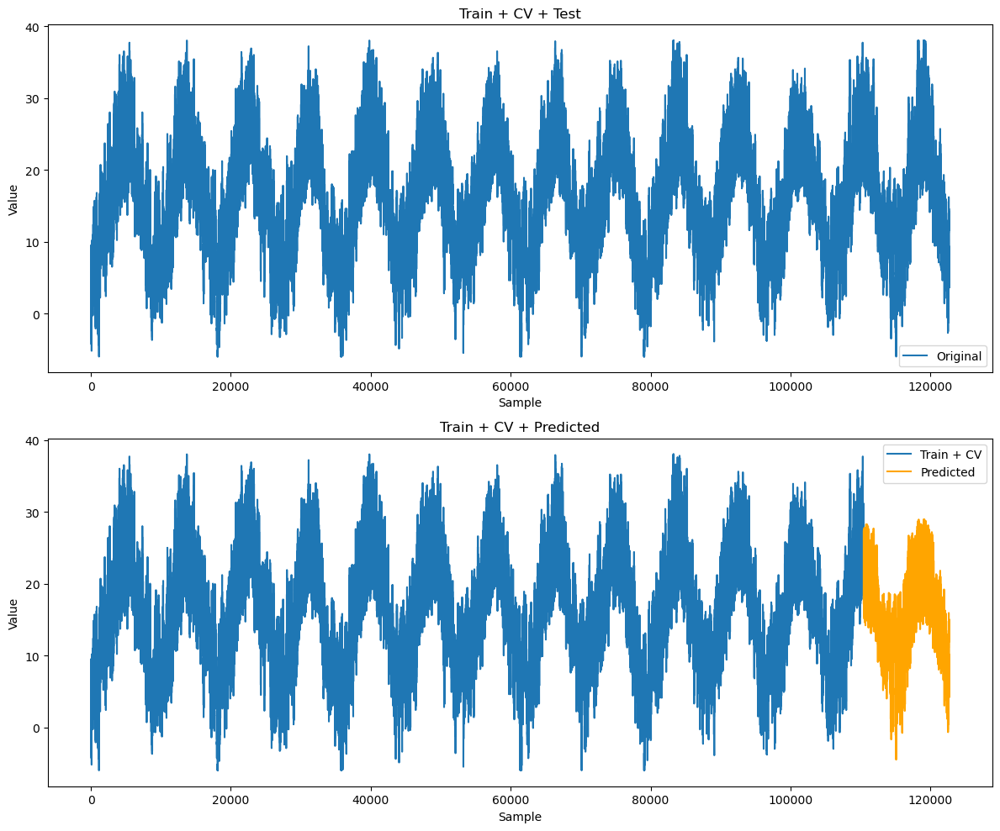

{'Name': 'Simple RNN multivariate, 32,16, ADAMAX MSE, Batch 64, Epochs 20, dropout 0.2', 'MSE': 5.6396361924467735, 'MAE': 1.770029091316256, 'RMSE': 2.3747918208648886, 'R2 Score': 0.9170287239567609}


In [72]:
model = SimpleRNN_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adamax', loss='mse')

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "Simple RNN multivariate, 32,16, ADAMAX MSE, Batch 64, Epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

Model: "sequential_14"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_12 (SimpleRNN)   (None, 1, 32)             7424      
                                                                 
 dropout_28 (Dropout)        (None, 1, 32)             0         
                                                                 
 simple_rnn_13 (SimpleRNN)   (None, 1, 16)             784       
                                                                 
 dropout_29 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_14 (Dense)            (None, 1, 1)              17        
                                                                 
Total params: 8225 (32.13 KB)
Trainable params: 8225 (32.13 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534/153

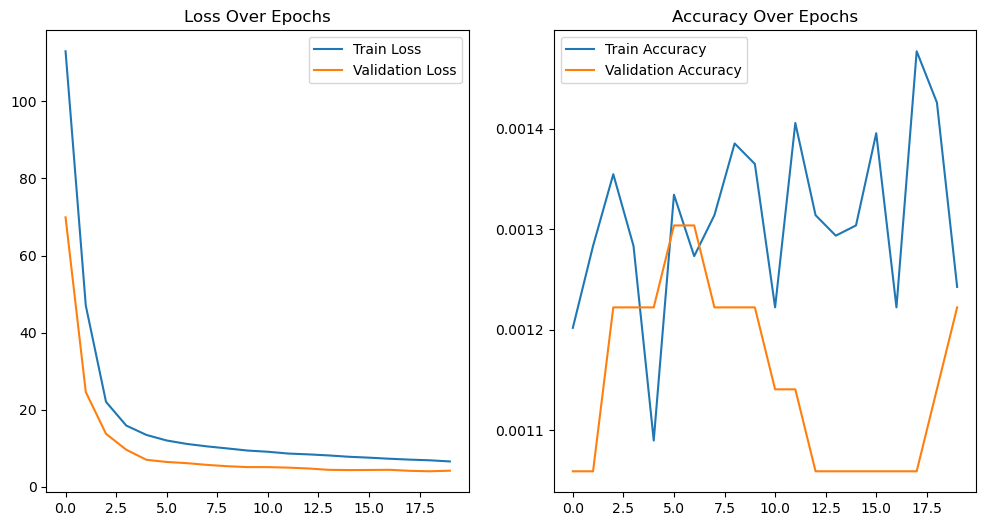

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 1s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[27.478712 ]
 [26.96308  ]
 [26.040024 ]
 ...
 [ 5.401777 ]
 [ 5.0565567]
 [ 5.095527 ]]
Name: Simple RNN multivariate, 32,16, ADAMAX MSE, Batch 64, Epochs 20, dropout 0.2
MSE: 4.96670074165997
MAE: 1.6225047529846361
RMSE: 2.2286095983056273
R2 Score: 0.9269290634717979


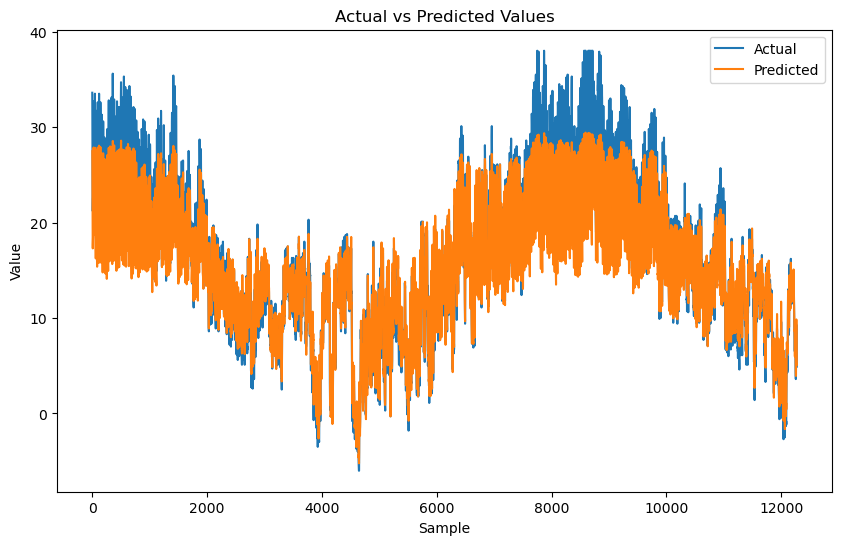

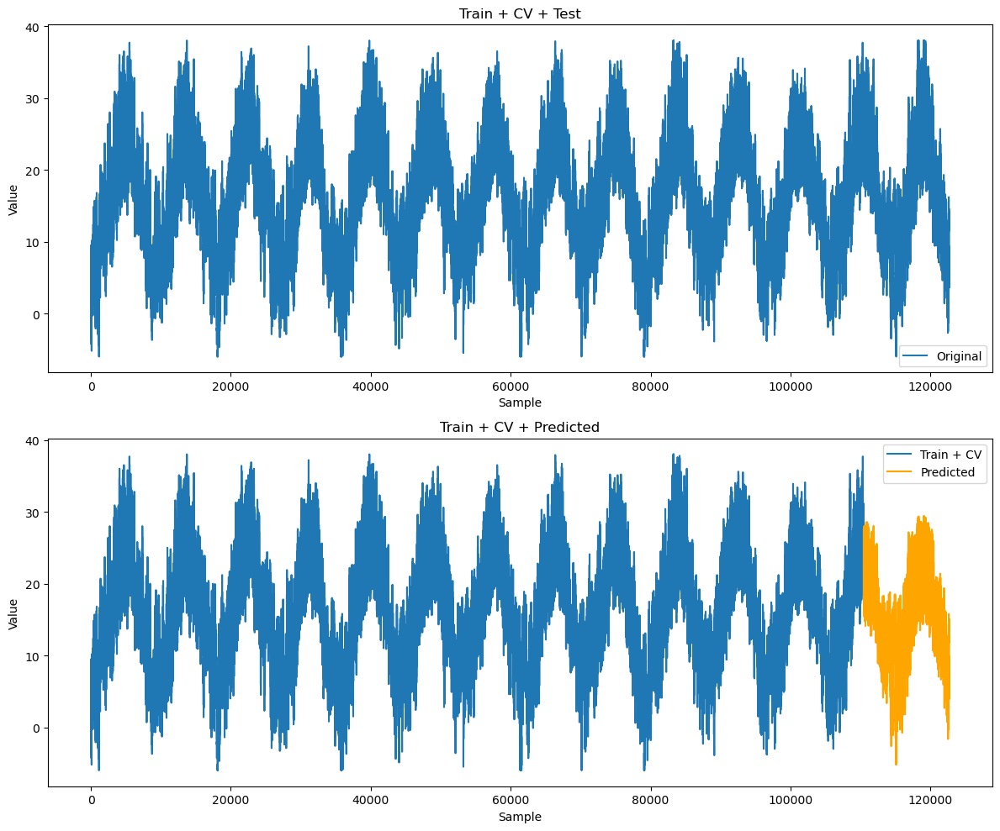

{'Name': 'Simple RNN multivariate, 32,16, ADAMAX MSE, Batch 64, Epochs 20, dropout 0.2', 'MSE': 4.96670074165997, 'MAE': 1.6225047529846361, 'RMSE': 2.2286095983056273, 'R2 Score': 0.9269290634717979}


In [73]:
model = SimpleRNN_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adamax', loss='mse')

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "Simple RNN multivariate, 32,16, ADAMAX MSE, Batch 64, Epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

Model: "sequential_15"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_14 (SimpleRNN)   (None, 1, 32)             7424      
                                                                 
 dropout_30 (Dropout)        (None, 1, 32)             0         
                                                                 
 simple_rnn_15 (SimpleRNN)   (None, 1, 16)             784       
                                                                 
 dropout_31 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_15 (Dense)            (None, 1, 1)              17        
                                                                 
Total params: 8225 (32.13 KB)
Trainable params: 8225 (32.13 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534/153

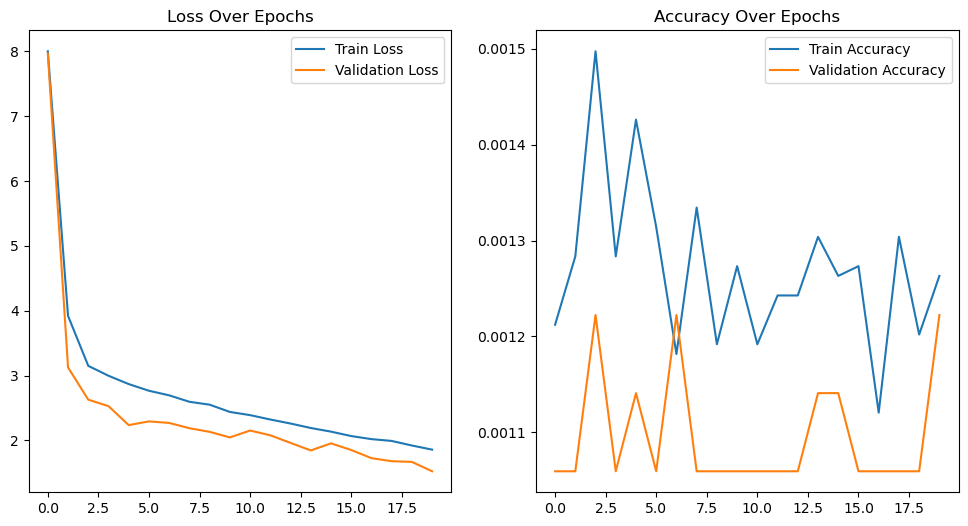

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 1s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[28.19262  ]
 [27.997921 ]
 [27.432896 ]
 ...
 [ 6.4549265]
 [ 6.2932515]
 [ 5.9968877]]
Name: Simple RNN multivariate, 32,16, ADAM MAE, Batch 64, Epochs 20, dropout 0.2
MSE: 4.540228215564608
MAE: 1.6424433900464592
RMSE: 2.1307811280290165
R2 Score: 0.9332033989927501


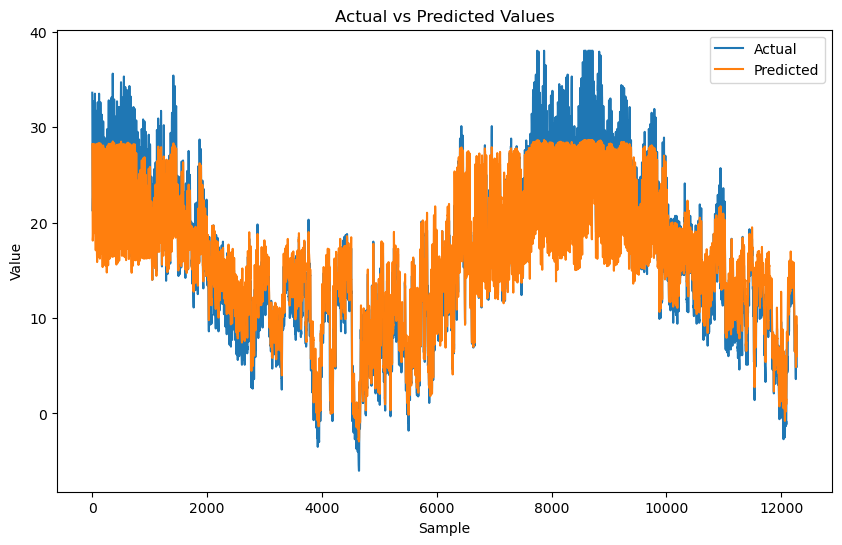

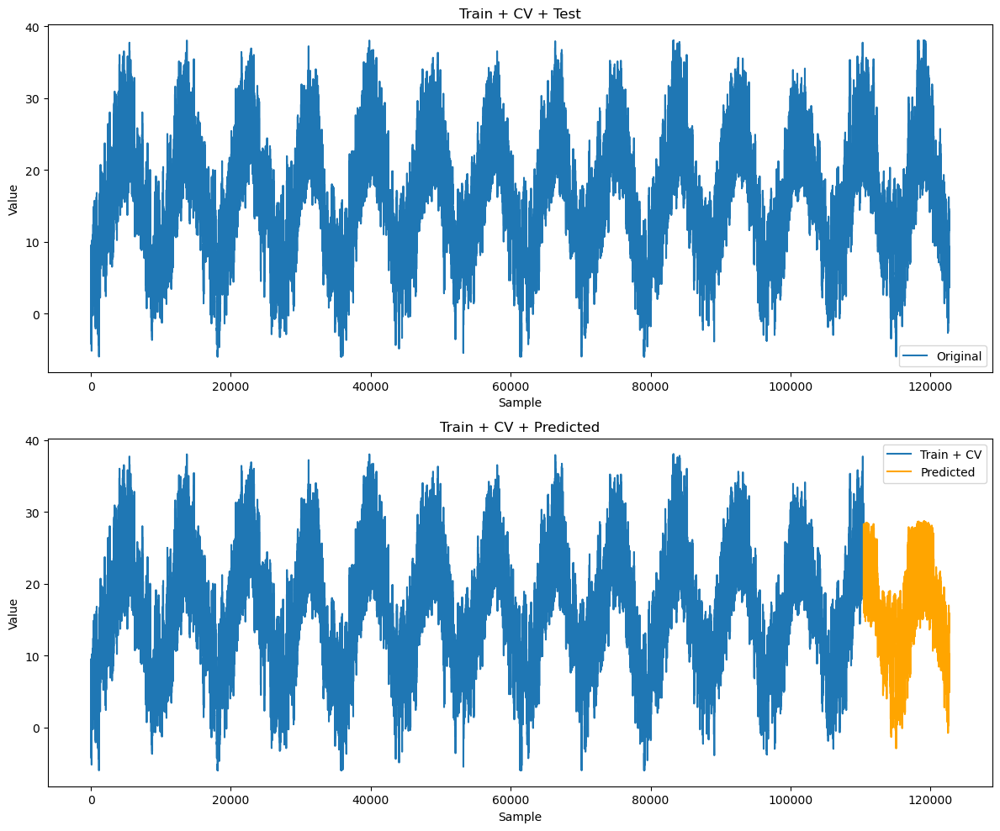

{'Name': 'Simple RNN multivariate, 32,16, ADAM MAE, Batch 64, Epochs 20, dropout 0.2', 'MSE': 4.540228215564608, 'MAE': 1.6424433900464592, 'RMSE': 2.1307811280290165, 'R2 Score': 0.9332033989927501}


In [74]:
model = SimpleRNN_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adam', loss='mae')

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "Simple RNN multivariate, 32,16, ADAM MAE, Batch 64, Epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

Model: "sequential_16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 simple_rnn_16 (SimpleRNN)   (None, 1, 32)             7424      
                                                                 
 dropout_32 (Dropout)        (None, 1, 32)             0         
                                                                 
 simple_rnn_17 (SimpleRNN)   (None, 1, 16)             784       
                                                                 
 dropout_33 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_16 (Dense)            (None, 1, 1)              17        
                                                                 
Total params: 8225 (32.13 KB)
Trainable params: 8225 (32.13 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534/153

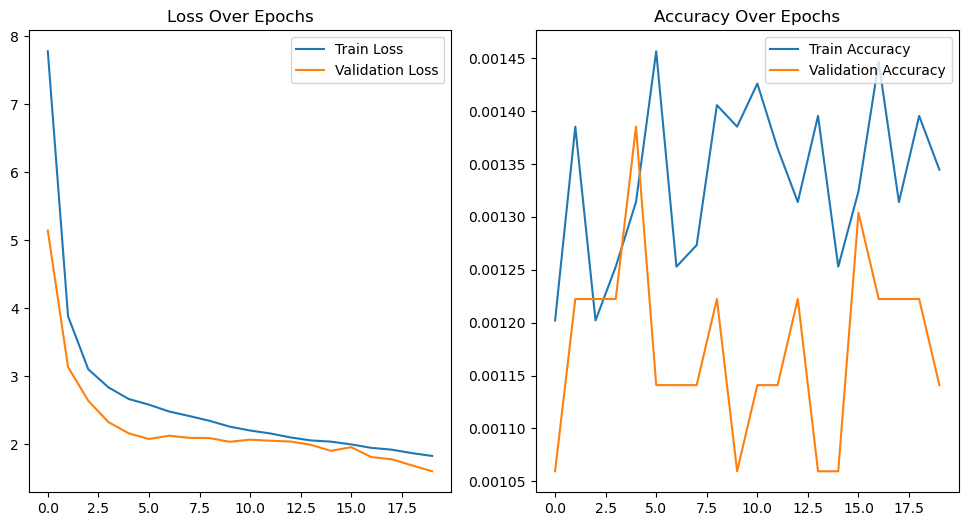

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 1s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[27.005936 ]
 [26.598751 ]
 [25.899601 ]
 ...
 [ 6.1811695]
 [ 5.83951  ]
 [ 5.5543427]]
Name: Simple RNN multivariate, 32,16, ADAMAX MAE, Batch 64, Epochs 20, dropout 0.2
MSE: 4.829306920148275
MAE: 1.5810937205869464
RMSE: 2.197568410800509
R2 Score: 0.9289504244784795


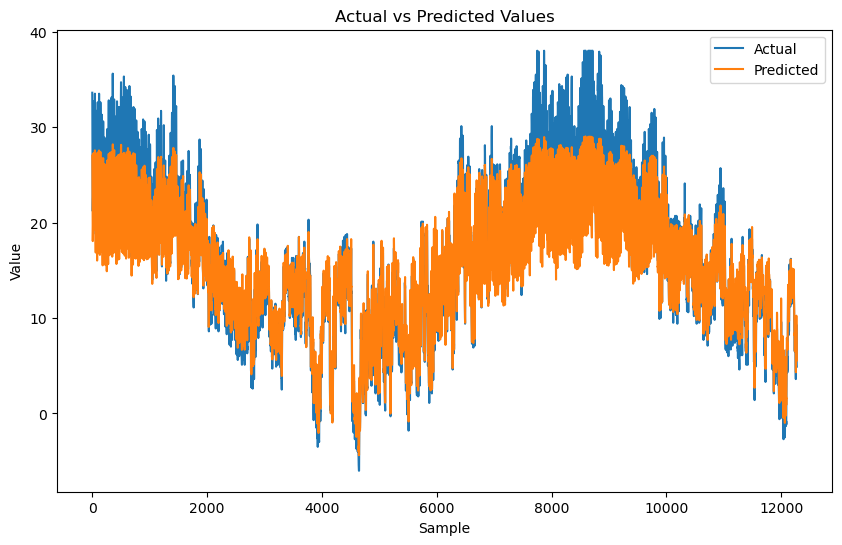

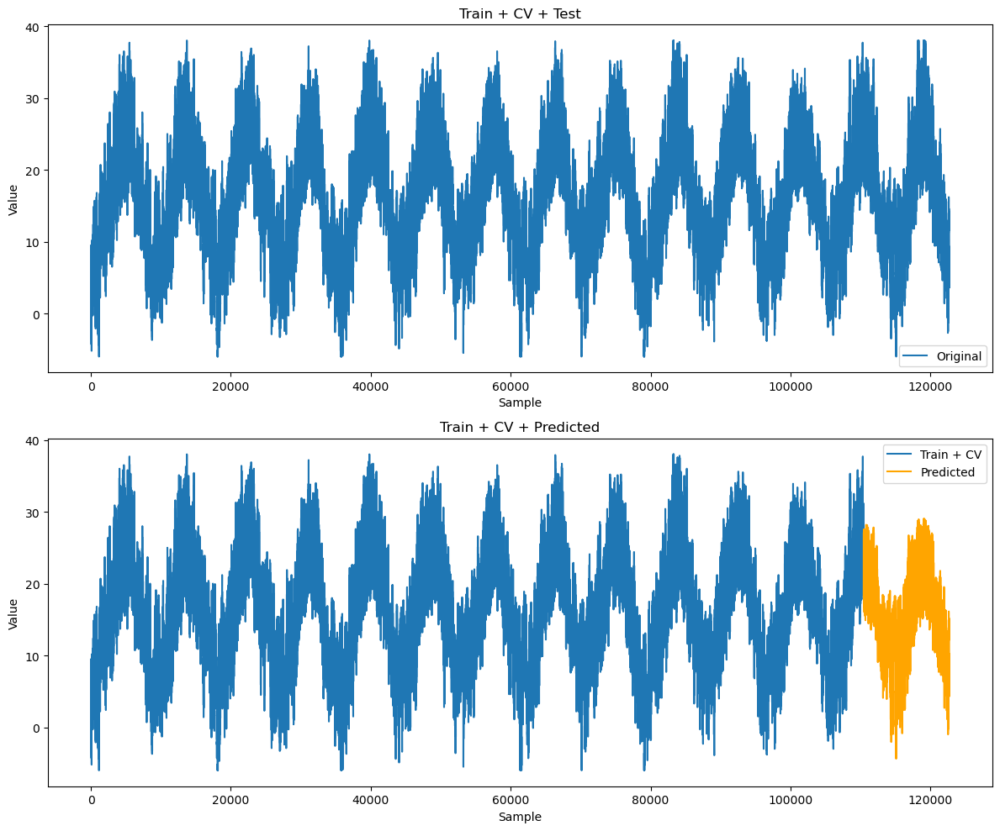

{'Name': 'Simple RNN multivariate, 32,16, ADAMAX MAE, Batch 64, Epochs 20, dropout 0.2', 'MSE': 4.829306920148275, 'MAE': 1.5810937205869464, 'RMSE': 2.197568410800509, 'R2 Score': 0.9289504244784795}


In [75]:
model = SimpleRNN_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adamax', loss='mae')

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "Simple RNN multivariate, 32,16, ADAMAX MAE, Batch 64, Epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

Model: "sequential_17"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (None, 1, 32)             29696     
                                                                 
 dropout_34 (Dropout)        (None, 1, 32)             0         
                                                                 
 lstm_9 (LSTM)               (None, 1, 16)             3136      
                                                                 
 dropout_35 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_17 (Dense)            (None, 1, 1)              17        
                                                                 
Total params: 32849 (128.32 KB)
Trainable params: 32849 (128.32 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534

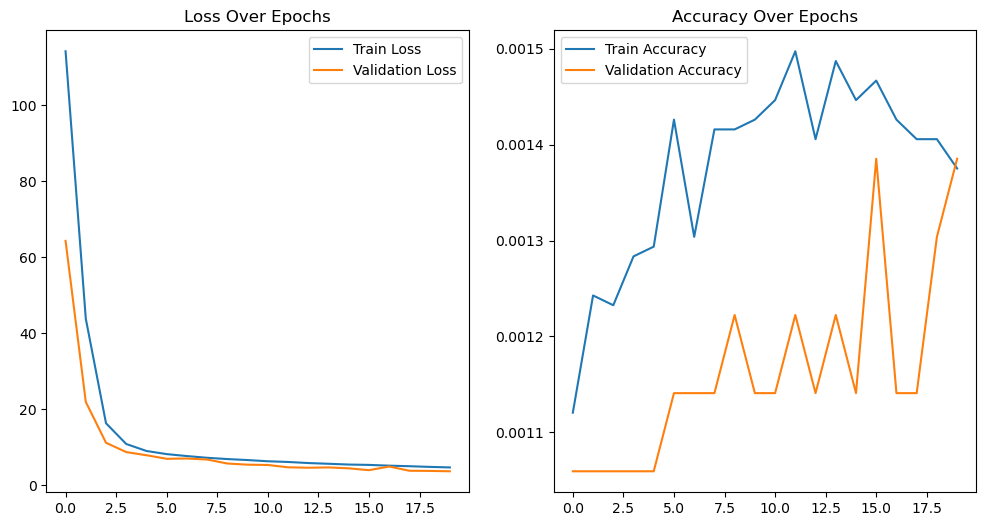

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 2s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[31.355299 ]
 [30.925232 ]
 [29.169884 ]
 ...
 [ 5.819811 ]
 [ 5.513513 ]
 [ 5.2427335]]
Name: LSTM multivariate, 32,16, ADAM MSE, Batch 64, Epochs 20, dropout 0.2
MSE: 3.6803226464333836
MAE: 1.4723664401339374
RMSE: 1.9184167030218913
R2 Score: 0.9458544743303865


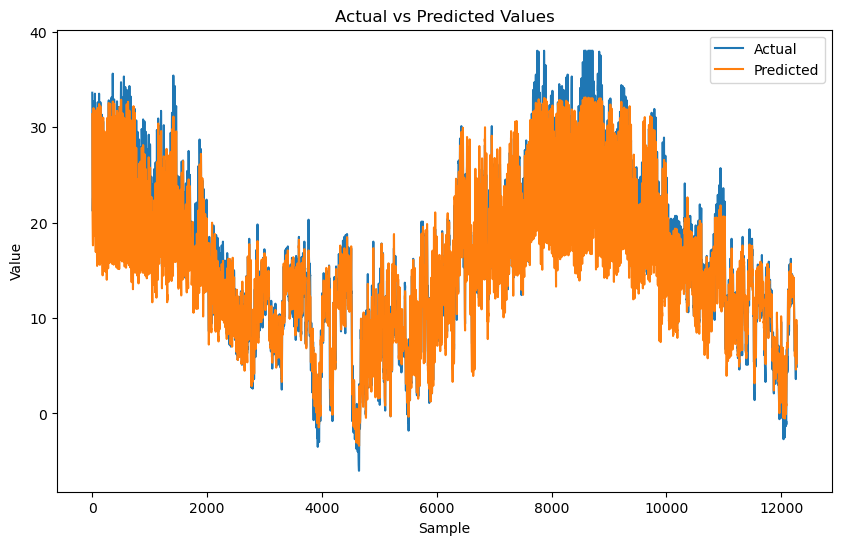

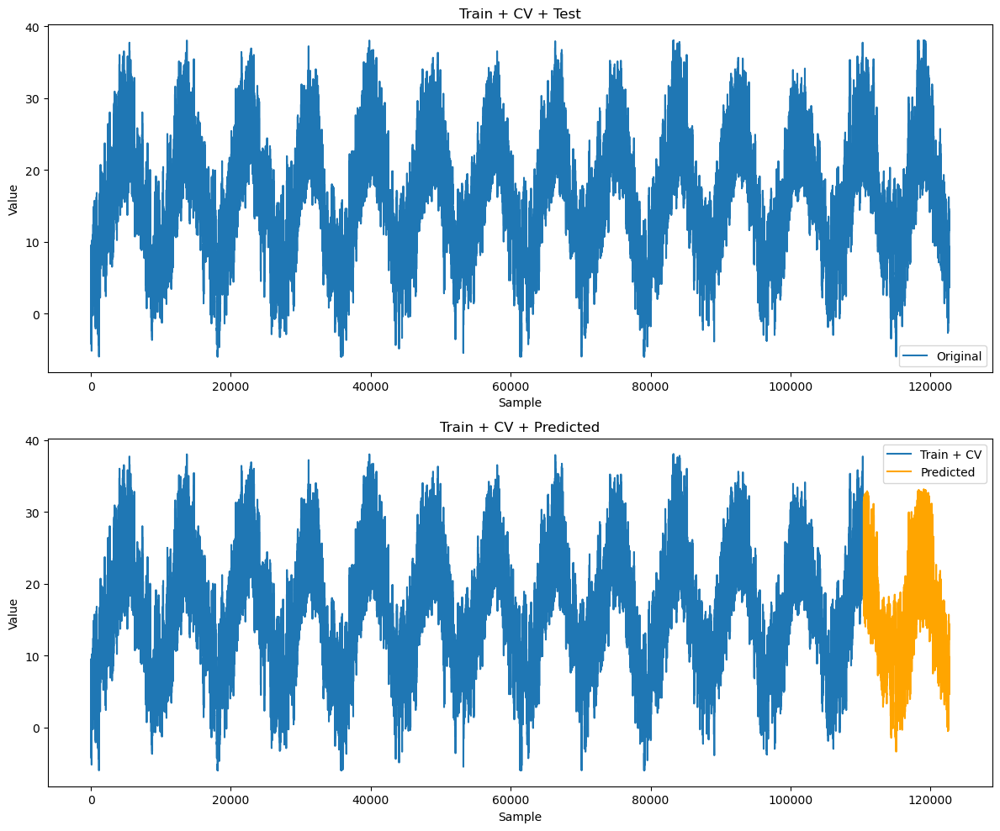

{'Name': 'LSTM multivariate, 32,16, ADAM MSE, Batch 64, Epochs 20, dropout 0.2', 'MSE': 3.6803226464333836, 'MAE': 1.4723664401339374, 'RMSE': 1.9184167030218913, 'R2 Score': 0.9458544743303865}


In [76]:
model = LSTM_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adam', loss='mse')

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "LSTM multivariate, 32,16, ADAM MSE, Batch 64, Epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

Model: "sequential_18"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_10 (LSTM)              (None, 1, 32)             29696     
                                                                 
 dropout_36 (Dropout)        (None, 1, 32)             0         
                                                                 
 lstm_11 (LSTM)              (None, 1, 16)             3136      
                                                                 
 dropout_37 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_18 (Dense)            (None, 1, 1)              17        
                                                                 
Total params: 32849 (128.32 KB)
Trainable params: 32849 (128.32 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534

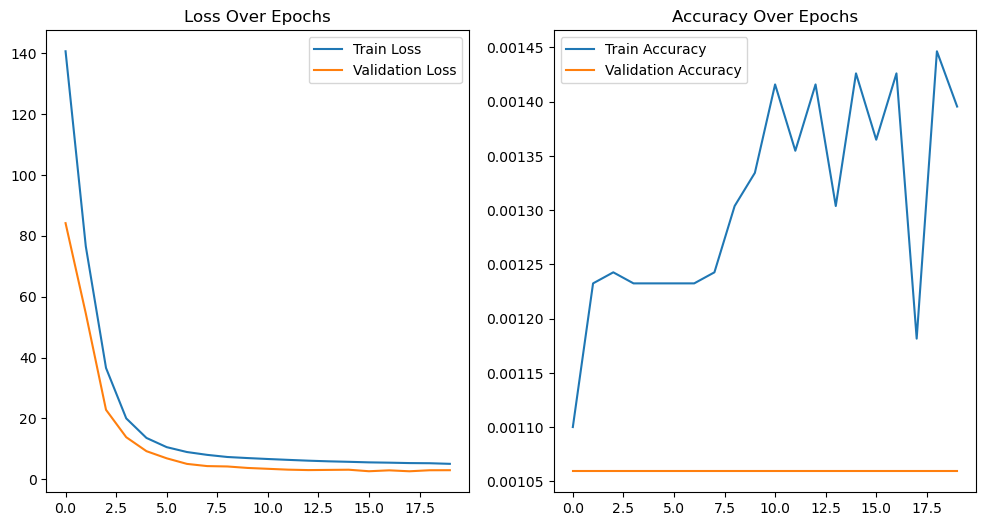

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 2s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[30.089548 ]
 [29.753    ]
 [28.572975 ]
 ...
 [ 6.256069 ]
 [ 5.925779 ]
 [ 5.8502545]]
Name: LSTM multivariate, 32,16, ADAMAX MSE, Batch 64, Epochs 20, dropout 0.2
MSE: 3.1620527139611467
MAE: 1.3554440974897768
RMSE: 1.7782161606399676
R2 Score: 0.953479348730912


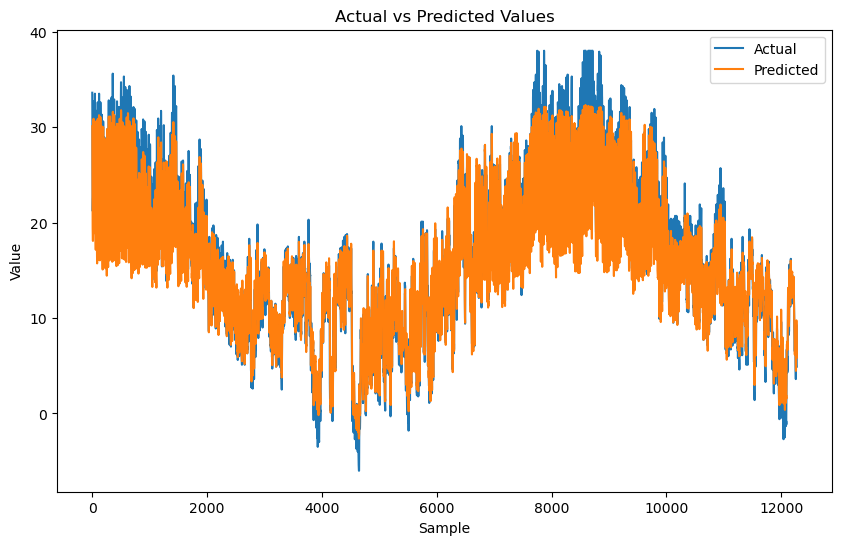

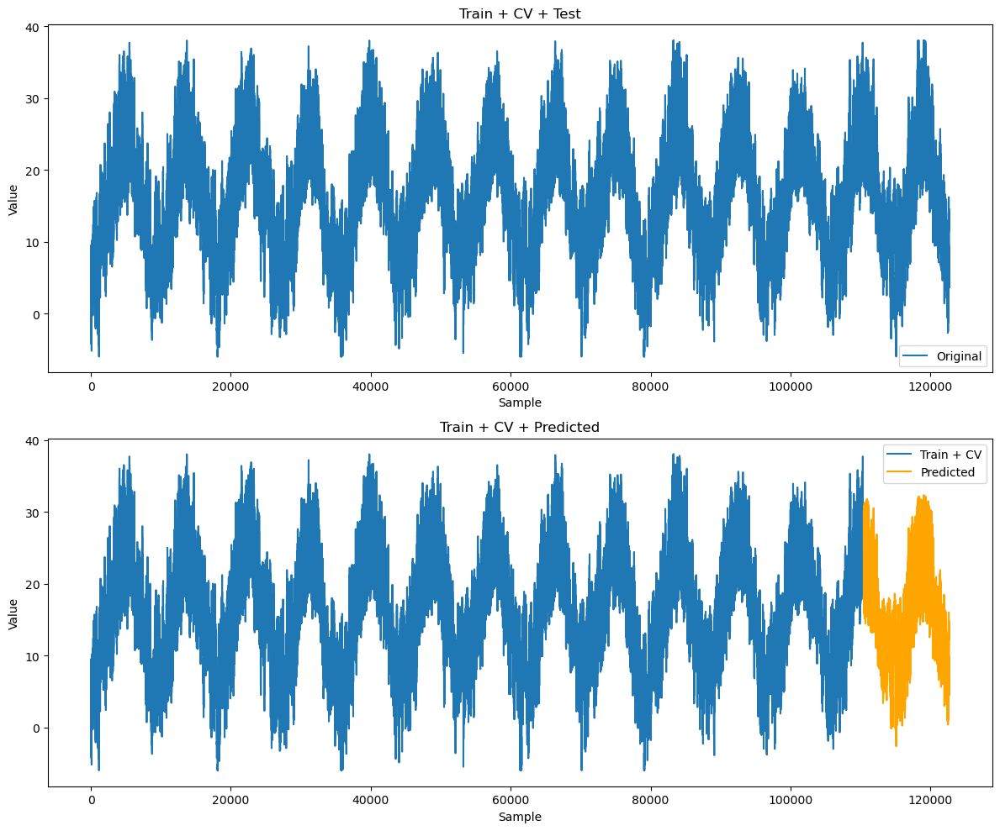

{'Name': 'LSTM multivariate, 32,16, ADAMAX MSE, Batch 64, Epochs 20, dropout 0.2', 'MSE': 3.1620527139611467, 'MAE': 1.3554440974897768, 'RMSE': 1.7782161606399676, 'R2 Score': 0.953479348730912}


In [77]:
model = LSTM_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adamax', loss='mse')

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "LSTM multivariate, 32,16, ADAMAX MSE, Batch 64, Epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_12 (LSTM)              (None, 1, 32)             29696     
                                                                 
 dropout_38 (Dropout)        (None, 1, 32)             0         
                                                                 
 lstm_13 (LSTM)              (None, 1, 16)             3136      
                                                                 
 dropout_39 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_19 (Dense)            (None, 1, 1)              17        
                                                                 
Total params: 32849 (128.32 KB)
Trainable params: 32849 (128.32 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534

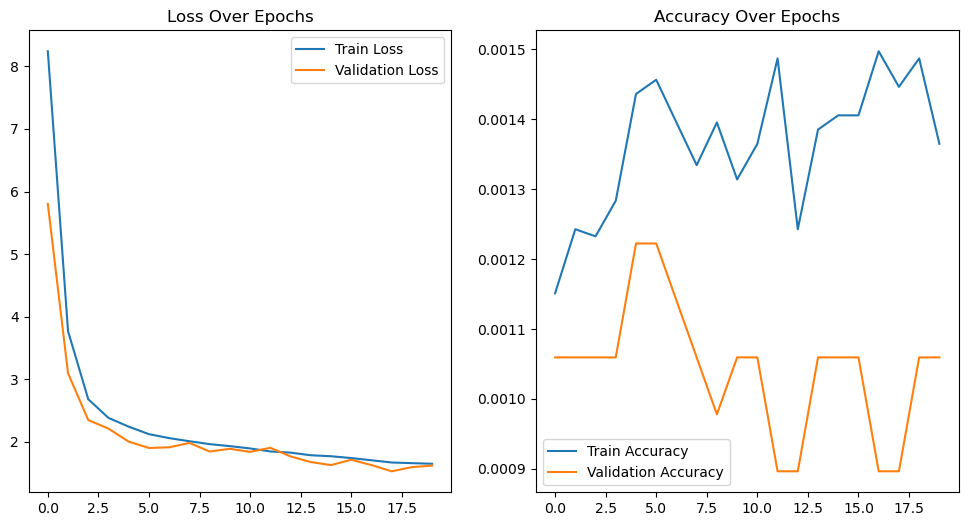

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 2s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[30.548635]
 [30.112959]
 [28.78135 ]
 ...
 [ 6.109053]
 [ 5.938113]
 [ 5.719766]]
Name: LSTM multivariate, 32,16, ADAM MAE, Batch 64, Epochs 20, dropout 0.2
MSE: 3.116094083491707
MAE: 1.3597230386660177
RMSE: 1.7652461821206997
R2 Score: 0.9541554998309345


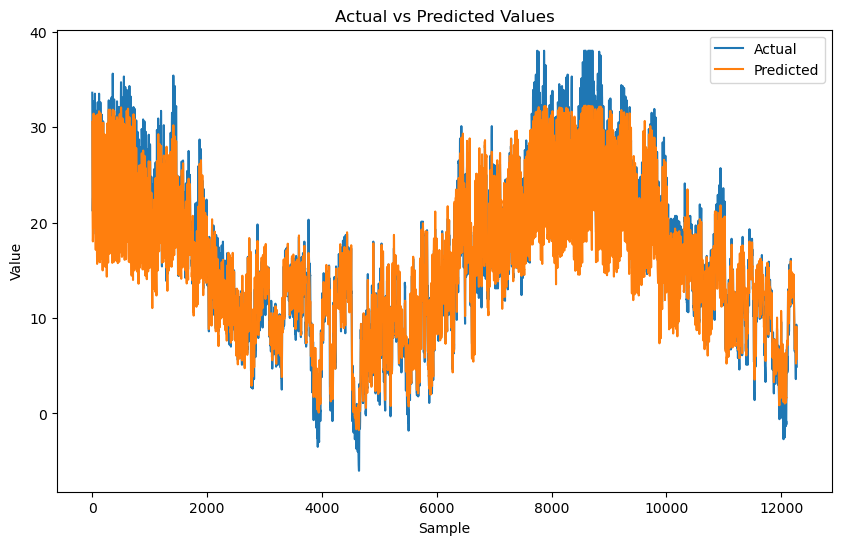

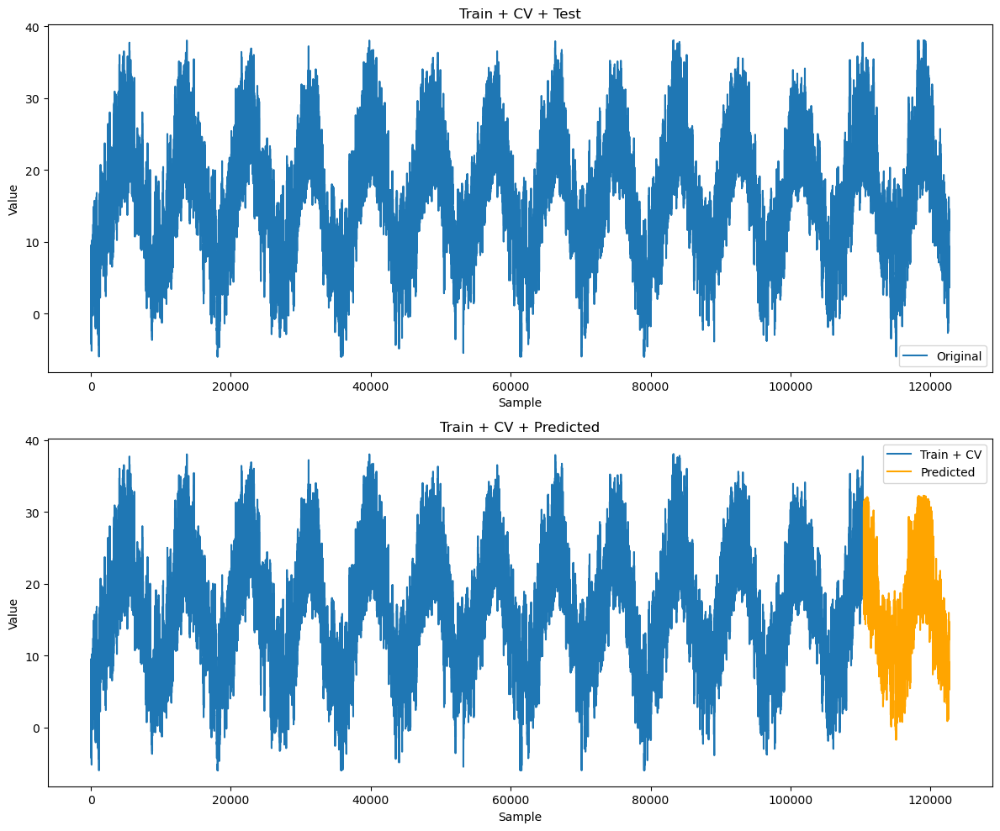

{'Name': 'LSTM multivariate, 32,16, ADAM MAE, Batch 64, Epochs 20, dropout 0.2', 'MSE': 3.116094083491707, 'MAE': 1.3597230386660177, 'RMSE': 1.7652461821206997, 'R2 Score': 0.9541554998309345}


In [78]:
model = LSTM_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adam', loss='mae')

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "LSTM multivariate, 32,16, ADAM MAE, Batch 64, Epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

Model: "sequential_20"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_14 (LSTM)              (None, 1, 32)             29696     
                                                                 
 dropout_40 (Dropout)        (None, 1, 32)             0         
                                                                 
 lstm_15 (LSTM)              (None, 1, 16)             3136      
                                                                 
 dropout_41 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_20 (Dense)            (None, 1, 1)              17        
                                                                 
Total params: 32849 (128.32 KB)
Trainable params: 32849 (128.32 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534

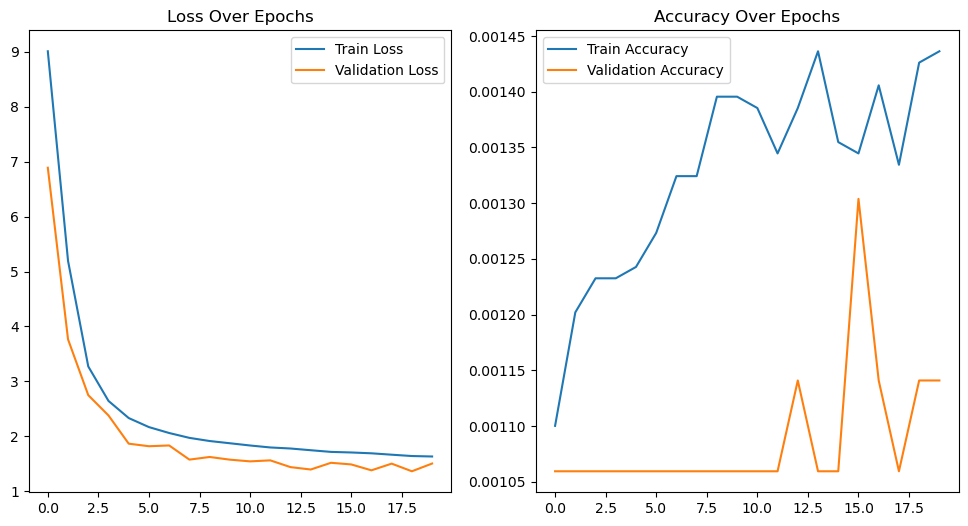

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 2s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[30.084488 ]
 [29.564028 ]
 [28.281593 ]
 ...
 [ 5.76906  ]
 [ 5.593402 ]
 [ 5.2532988]]
Name: LSTM multivariate, 32,16, ADAMAX MAE, Batch 64, Epochs 20, dropout 0.2
MSE: 3.1724585307562565
MAE: 1.3711150356536292
RMSE: 1.7811396718832178
R2 Score: 0.9533262566043457


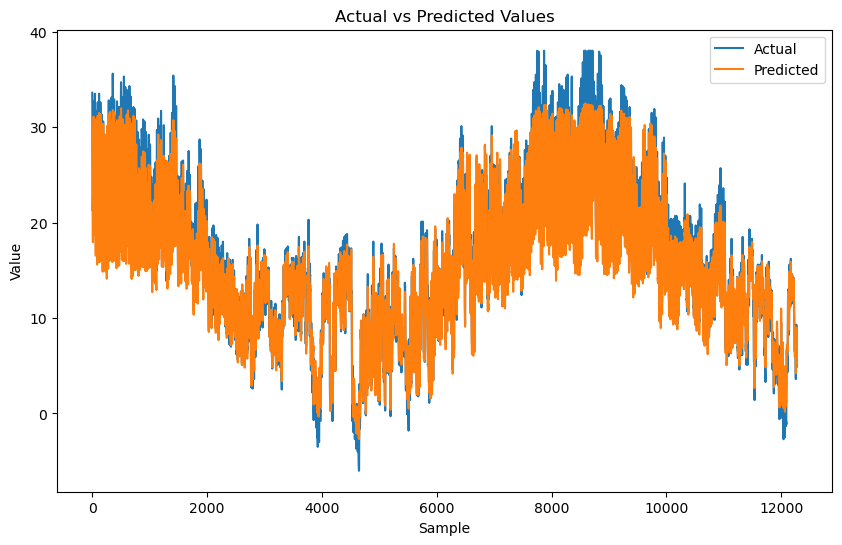

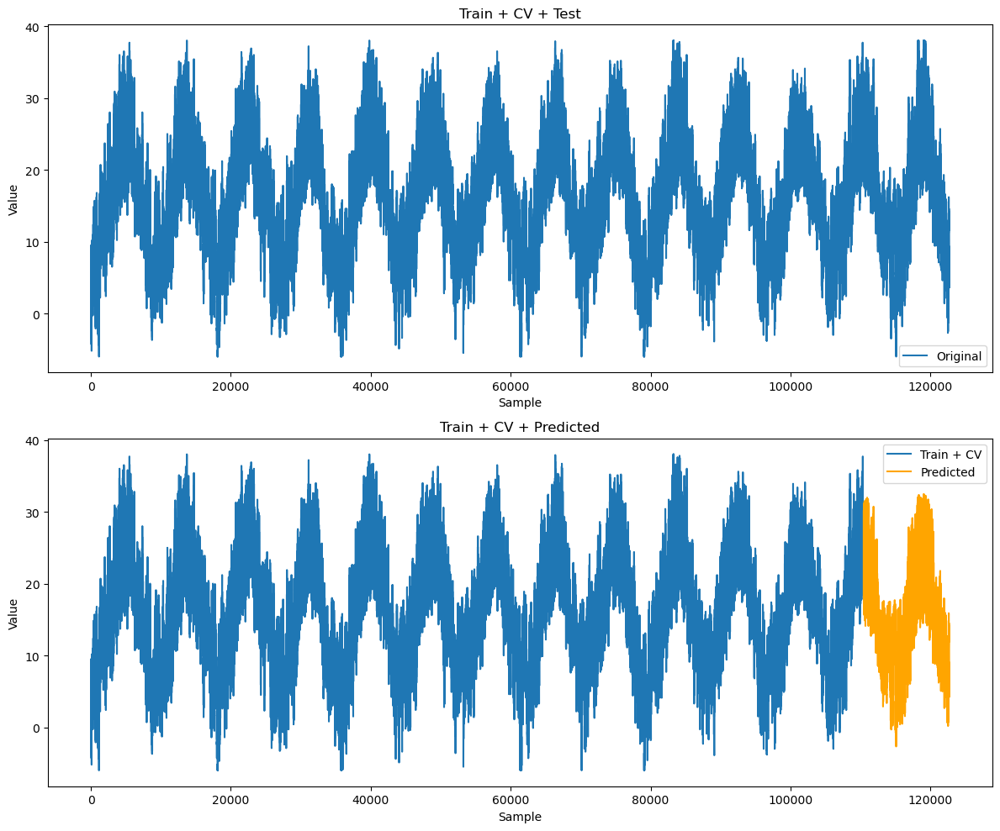

{'Name': 'LSTM multivariate, 32,16, ADAMAX MAE, Batch 64, Epochs 20, dropout 0.2', 'MSE': 3.1724585307562565, 'MAE': 1.3711150356536292, 'RMSE': 1.7811396718832178, 'R2 Score': 0.9533262566043457}


In [79]:
model = LSTM_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adamax', loss='mae')

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "LSTM multivariate, 32,16, ADAMAX MAE, Batch 64, Epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_8 (GRU)                 (None, 1, 32)             22368     
                                                                 
 dropout_42 (Dropout)        (None, 1, 32)             0         
                                                                 
 gru_9 (GRU)                 (None, 1, 16)             2400      
                                                                 
 dropout_43 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_21 (Dense)            (None, 1, 1)              17        
                                                                 
Total params: 24785 (96.82 KB)
Trainable params: 24785 (96.82 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534/1

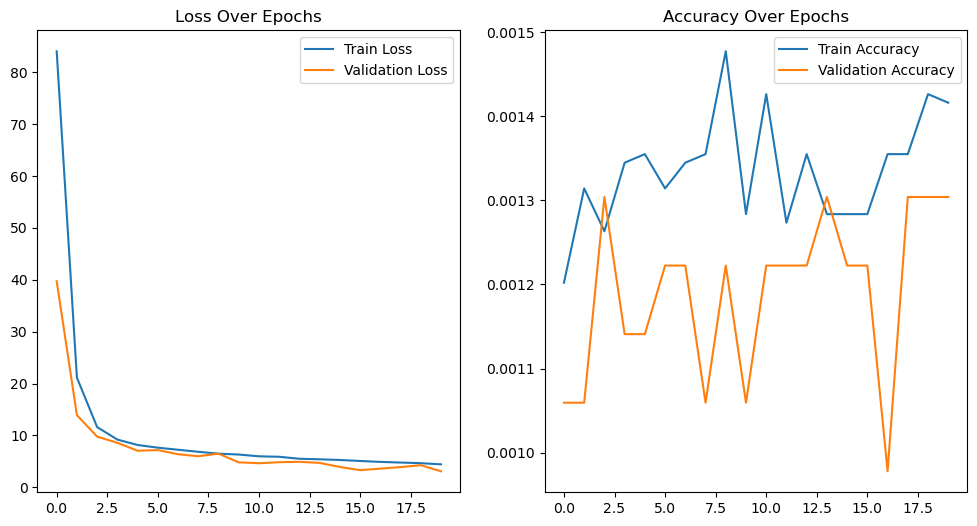

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 2s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[30.974087 ]
 [30.546116 ]
 [29.26989  ]
 ...
 [ 6.1725984]
 [ 5.8160777]
 [ 5.539883 ]]
Name: GRU multivariate, 32,16, ADAM MSE, Batch 64, Epochs 20, dropout 0.2
MSE: 2.5969140342314216
MAE: 1.2463182172082805
RMSE: 1.611494348184759
R2 Score: 0.961793764022694


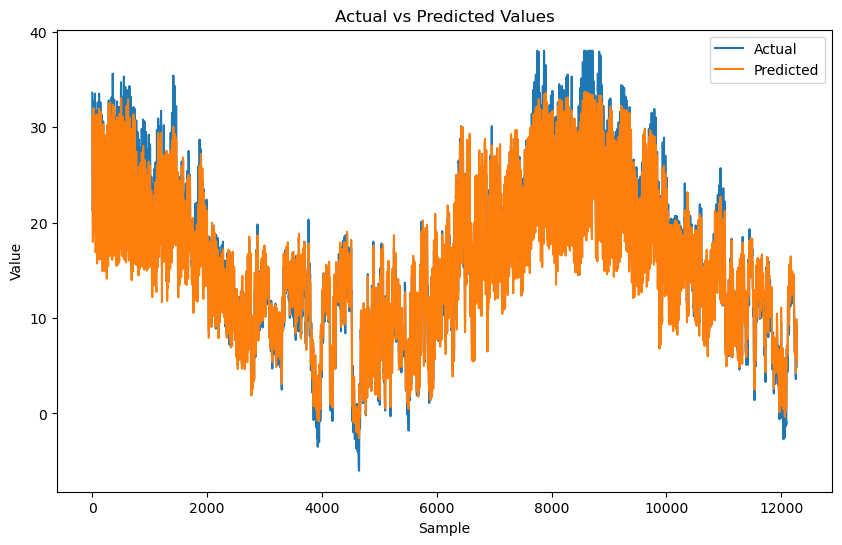

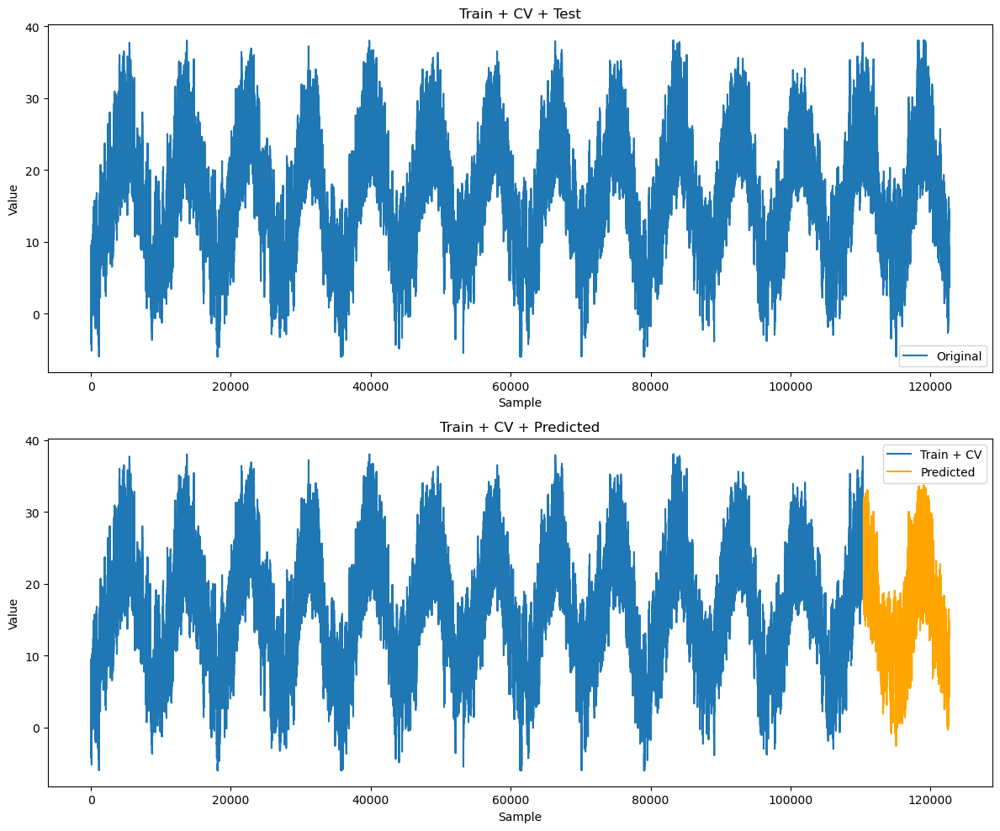

{'Name': 'GRU multivariate, 32,16, ADAM MSE, Batch 64, Epochs 20, dropout 0.2', 'MSE': 2.5969140342314216, 'MAE': 1.2463182172082805, 'RMSE': 1.611494348184759, 'R2 Score': 0.961793764022694}


In [80]:
model = GRU_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adam', loss='mse')

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "GRU multivariate, 32,16, ADAM MSE, Batch 64, Epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_10 (GRU)                (None, 1, 32)             22368     
                                                                 
 dropout_44 (Dropout)        (None, 1, 32)             0         
                                                                 
 gru_11 (GRU)                (None, 1, 16)             2400      
                                                                 
 dropout_45 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_22 (Dense)            (None, 1, 1)              17        
                                                                 
Total params: 24785 (96.82 KB)
Trainable params: 24785 (96.82 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534/1

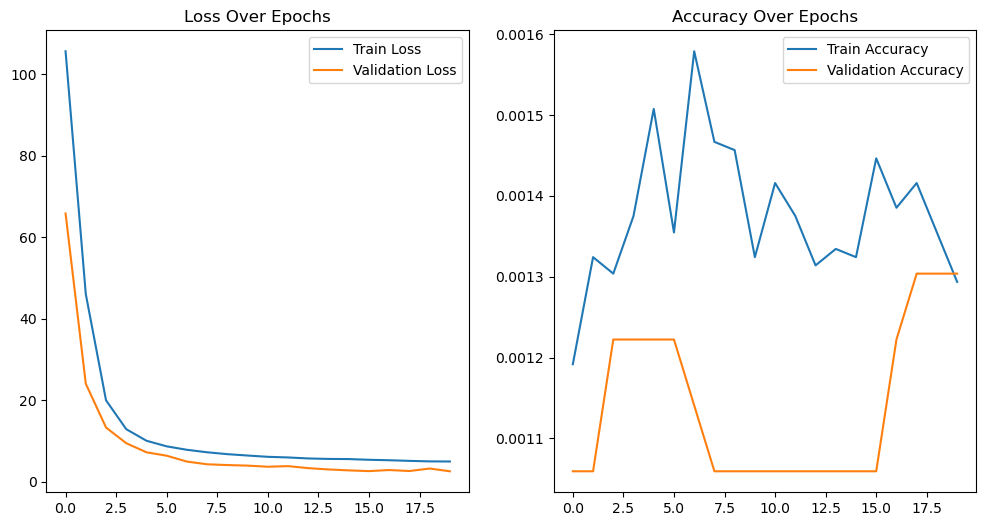

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 2s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[30.097908 ]
 [29.878244 ]
 [28.79767  ]
 ...
 [ 5.626337 ]
 [ 5.340513 ]
 [ 5.0693874]]
Name: GRU multivariate, 32,16, ADAMAX MSE, Batch 64, Epochs 20, dropout 0.2
MSE: 2.606777148929492
MAE: 1.2324820715041802
RMSE: 1.6145516866701703
R2 Score: 0.9616486562206419


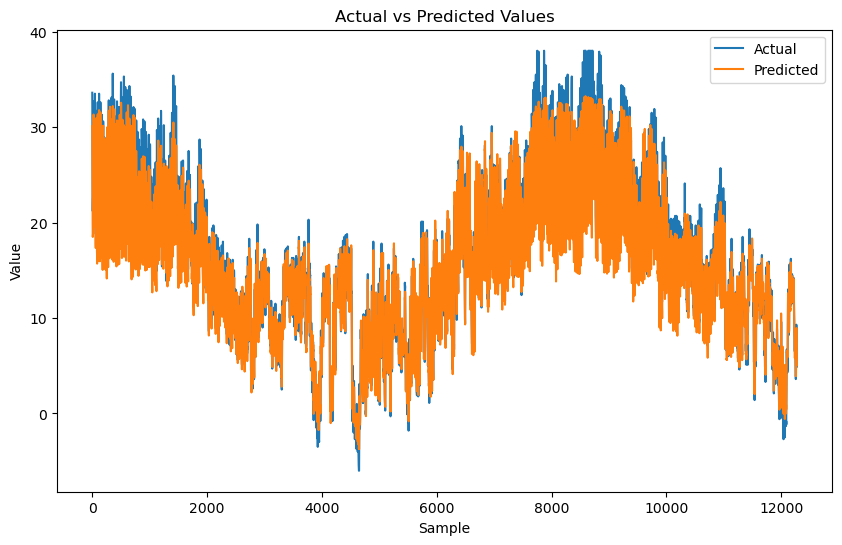

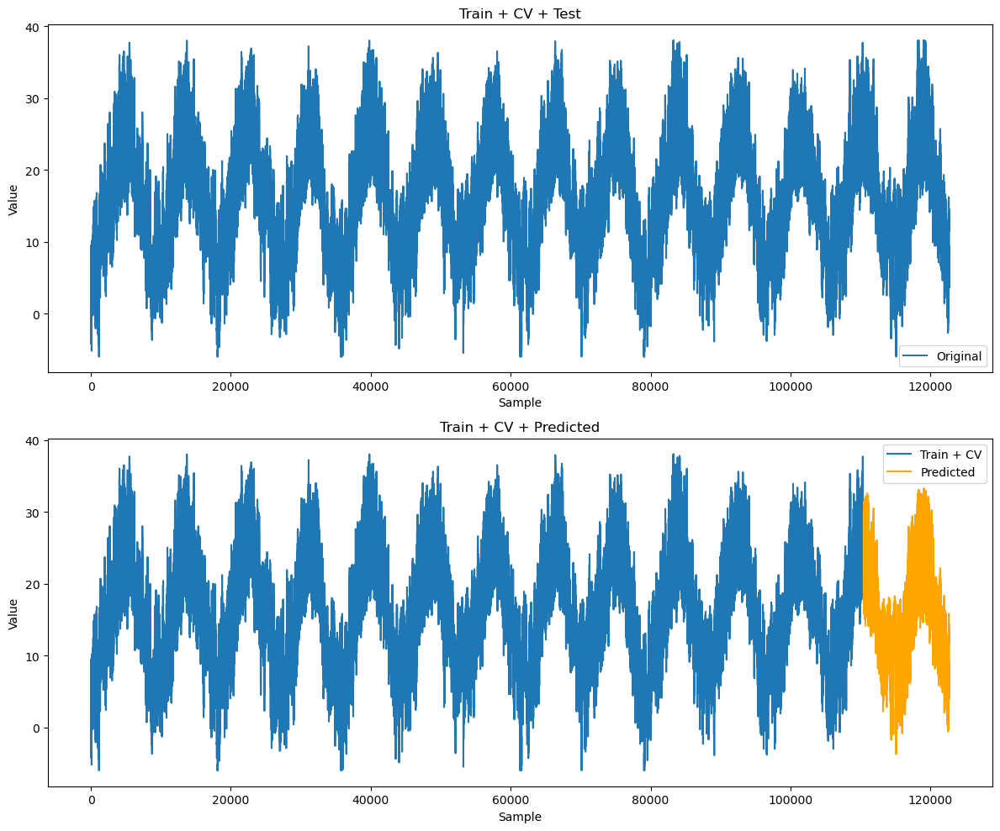

{'Name': 'GRU multivariate, 32,16, ADAMAX MSE, Batch 64, Epochs 20, dropout 0.2', 'MSE': 2.606777148929492, 'MAE': 1.2324820715041802, 'RMSE': 1.6145516866701703, 'R2 Score': 0.9616486562206419}


In [81]:
model = GRU_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adamax', loss='mse')

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "GRU multivariate, 32,16, ADAMAX MSE, Batch 64, Epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

Model: "sequential_23"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_12 (GRU)                (None, 1, 32)             22368     
                                                                 
 dropout_46 (Dropout)        (None, 1, 32)             0         
                                                                 
 gru_13 (GRU)                (None, 1, 16)             2400      
                                                                 
 dropout_47 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_23 (Dense)            (None, 1, 1)              17        
                                                                 
Total params: 24785 (96.82 KB)
Trainable params: 24785 (96.82 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534/1

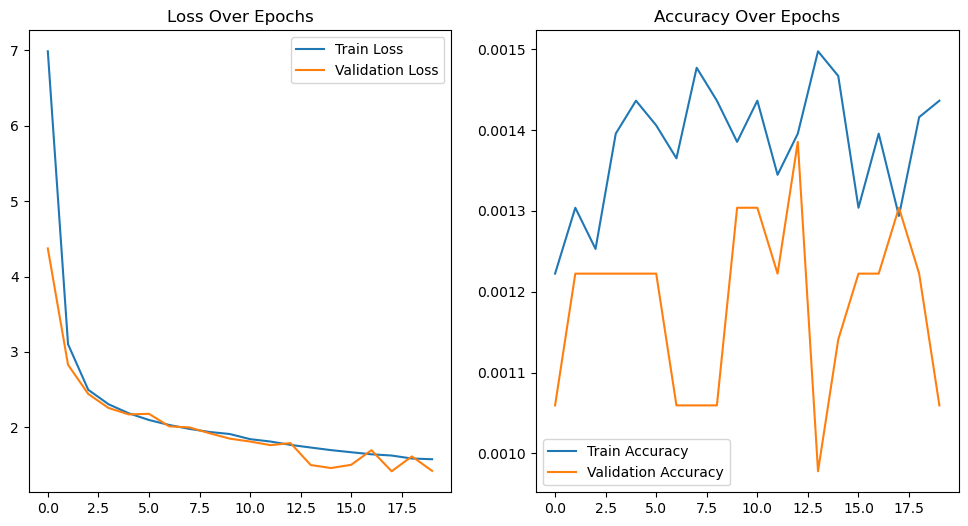

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 2s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[30.706972 ]
 [30.313189 ]
 [28.98994  ]
 ...
 [ 6.528561 ]
 [ 6.234431 ]
 [ 6.0563188]]
Name: GRU multivariate, 32,16, ADAM MAE, Batch 64, Epochs 20, dropout 0.2
MSE: 3.186664331789391
MAE: 1.3845408716661094
RMSE: 1.785123057884075
R2 Score: 0.9531172584706514


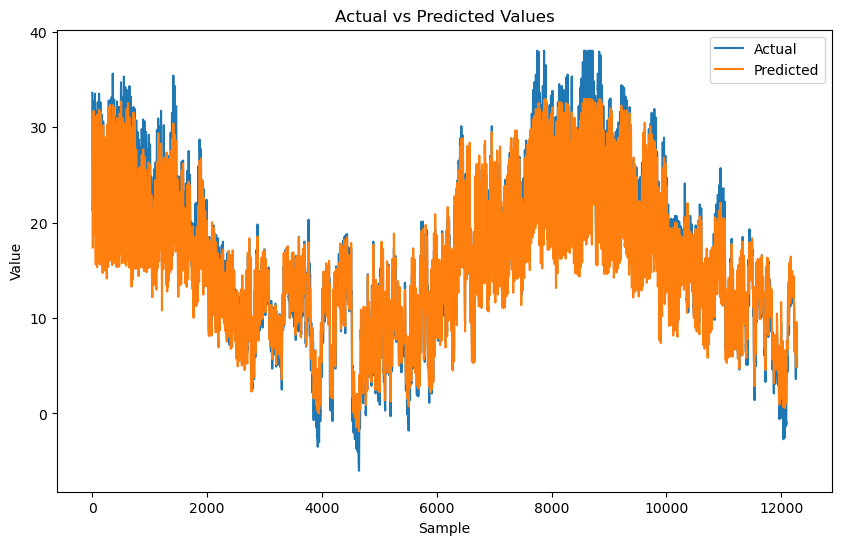

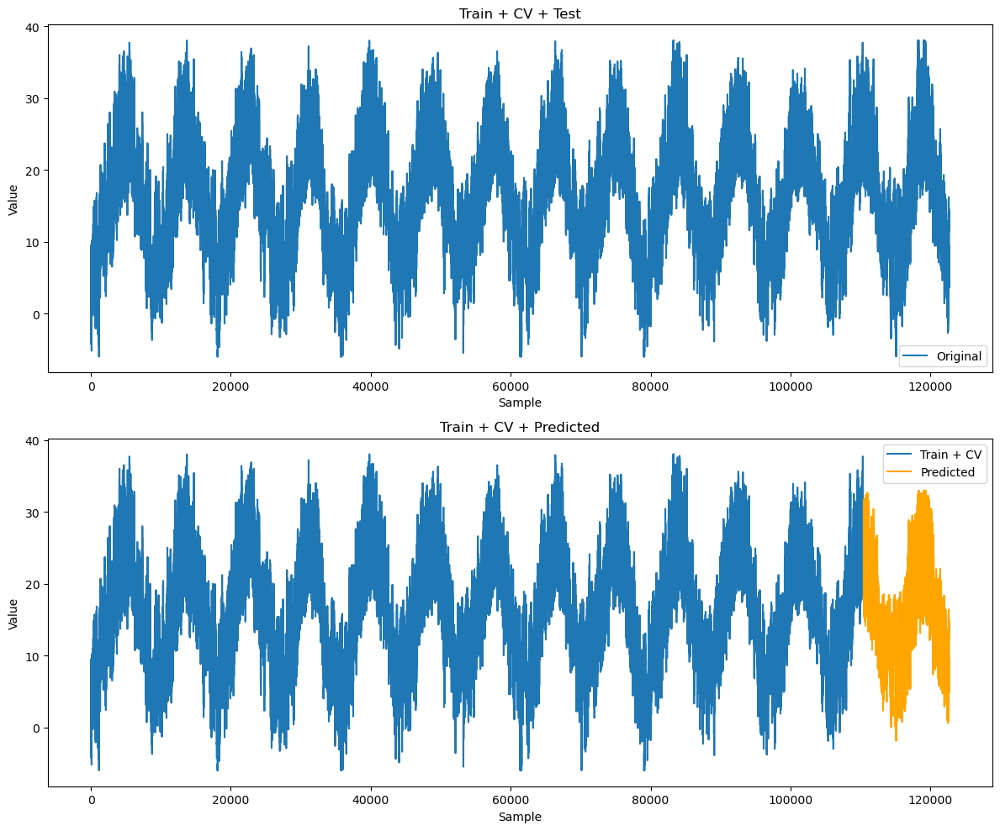

{'Name': 'GRU multivariate, 32,16, ADAM MAE, Batch 64, Epochs 20, dropout 0.2', 'MSE': 3.186664331789391, 'MAE': 1.3845408716661094, 'RMSE': 1.785123057884075, 'R2 Score': 0.9531172584706514}


In [82]:
model = GRU_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adam', loss='mae')

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "GRU multivariate, 32,16, ADAM MAE, Batch 64, Epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_14 (GRU)                (None, 1, 32)             22368     
                                                                 
 dropout_48 (Dropout)        (None, 1, 32)             0         
                                                                 
 gru_15 (GRU)                (None, 1, 16)             2400      
                                                                 
 dropout_49 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_24 (Dense)            (None, 1, 1)              17        
                                                                 
Total params: 24785 (96.82 KB)
Trainable params: 24785 (96.82 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534/1

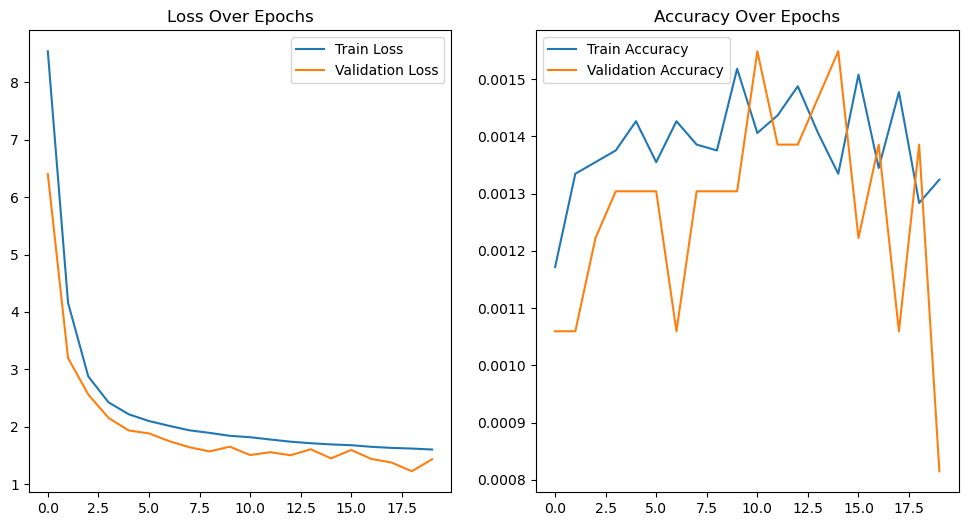

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 2s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[30.425451 ]
 [29.92773  ]
 [28.644453 ]
 ...
 [ 5.353969 ]
 [ 4.8811383]
 [ 4.588789 ]]
Name: GRU multivariate, 32,16, ADAMAX MAE, Batch 64, Epochs 20, dropout 0.2
MSE: 2.8868417095543264
MAE: 1.3306467547275629
RMSE: 1.6990708371207854
R2 Score: 0.9575282993081422


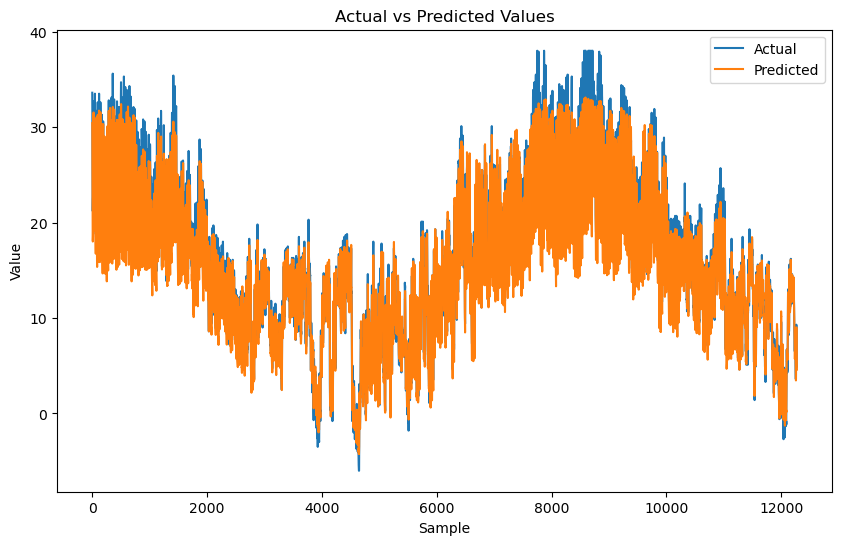

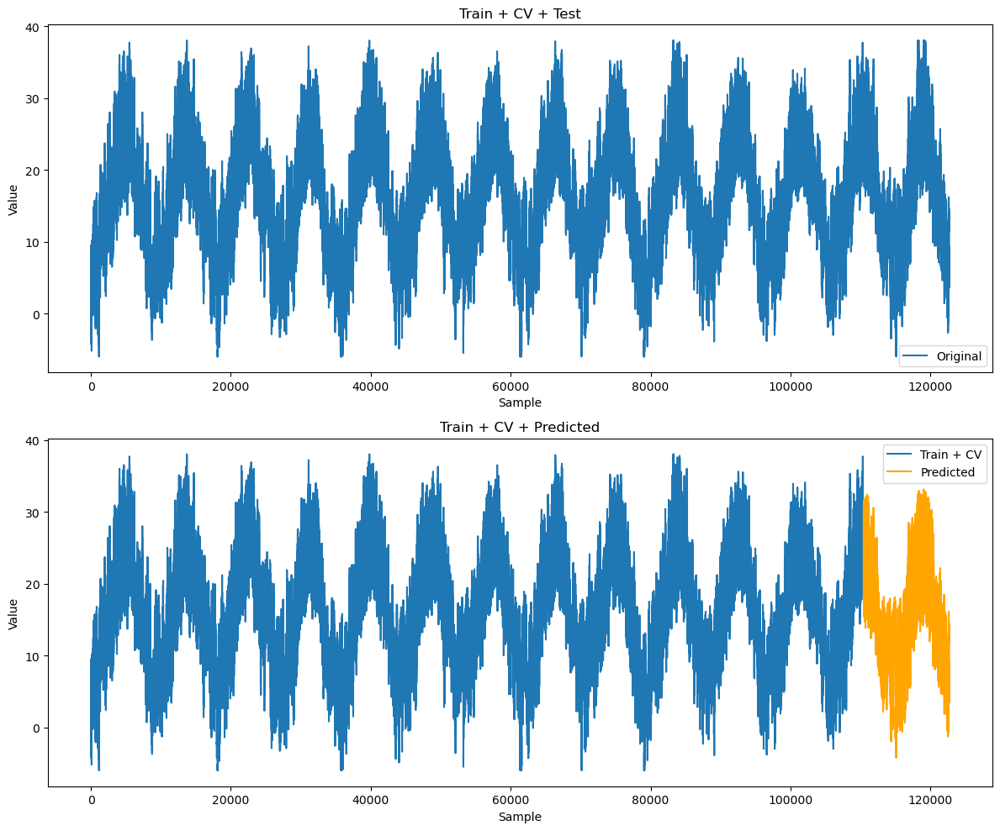

{'Name': 'GRU multivariate, 32,16, ADAMAX MAE, Batch 64, Epochs 20, dropout 0.2', 'MSE': 2.8868417095543264, 'MAE': 1.3306467547275629, 'RMSE': 1.6990708371207854, 'R2 Score': 0.9575282993081422}


In [83]:
model = GRU_32and16(train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adamax', loss='mae')

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "GRU multivariate, 32,16, ADAMAX MAE, Batch 64, Epochs 20, dropout 0.2",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

In [85]:
df_results

,Name,MSE,MAE,RMSE,R2 Score
0,"Simple RNN, 32,16, ADAM MSE, Batch 64, epochs ...",1.964202,0.977420,1.401500,0.971102
1,"Simple RNN, 32,16, ADAMAX MSE, batch 64, epoch...",7.897633,1.978019,2.810273,0.883809
2,"Simple RNN, 32,16, ADAM MAE, Batch 64, Epochs ...",1.976923,0.954836,1.406031,0.970915
3,"Simple RNN, 32,16, ADAMAX MAE, Batch 64, Epoch...",4.374293,1.467342,2.091481,0.935645
4,"LSTM, 32,16, ADAM MSE, Batch 64, Epochs 20, dr...",1.170285,0.791649,1.081797,0.982783
5,"LSTM, 32,16, ADAMAX MSE, Batch 64, Epochs 20, ...",3.089672,1.192901,1.757746,0.954544
6,"LSTM, 32,16, ADAM MAE, Batch 64, Epochs 20, dr...",1.861503,0.951772,1.364369,0.972613
7,"LSTM, 32,16, ADAMAX MAE, Batch 64, Epochs 20, ...",3.409464,1.237881,1.846474,0.949839
8,"GRU, 32,16, ADAM MSE, Batch 64, Epochs 20, dro...",1.721455,0.972279,1.312042,0.974674
9,"GRU, 32,16, ADAMAX MSE, Batch 64, Epochs 20, d...",1.583056,0.895303,1.258195,0.976710


In [86]:
df_lagged = create_lagged_dataset(df_outliers_clipped[['Temperature']], 24)
target_cols = ['Temperature(t)']
train_X_scaled, train_y, val_X_scaled, val_y, test_X_scaled, test_y, scaler = scale_and_split(df_lagged, target_cols)

train_X_simple_rnn = train_X_scaled.reshape((train_X_scaled.shape[0], 1, train_X_scaled.shape[1]))
val_X_simple_rnn = val_X_scaled.reshape((val_X_scaled.shape[0], 1, val_X_scaled.shape[1]))
test_X_simple_rnn = test_X_scaled.reshape((test_X_scaled.shape[0], 1, test_X_scaled.shape[1]))

train_y_simple_rnn = train_y.values if hasattr(train_y, 'values') else train_y
val_y_simple_rnn = val_y.values if hasattr(val_y, 'values') else val_y
test_y_simple_rnn = test_y.values if hasattr(test_y, 'values') else test_y

Model: "sequential_25"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_16 (GRU)                (None, 1, 32)             5568      
                                                                 
 dropout_50 (Dropout)        (None, 1, 32)             0         
                                                                 
 gru_17 (GRU)                (None, 1, 16)             2400      
                                                                 
 dropout_51 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_25 (Dense)            (None, 1, 1)              17        
                                                                 
Total params: 7985 (31.19 KB)
Trainable params: 7985 (31.19 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/40
1534/153

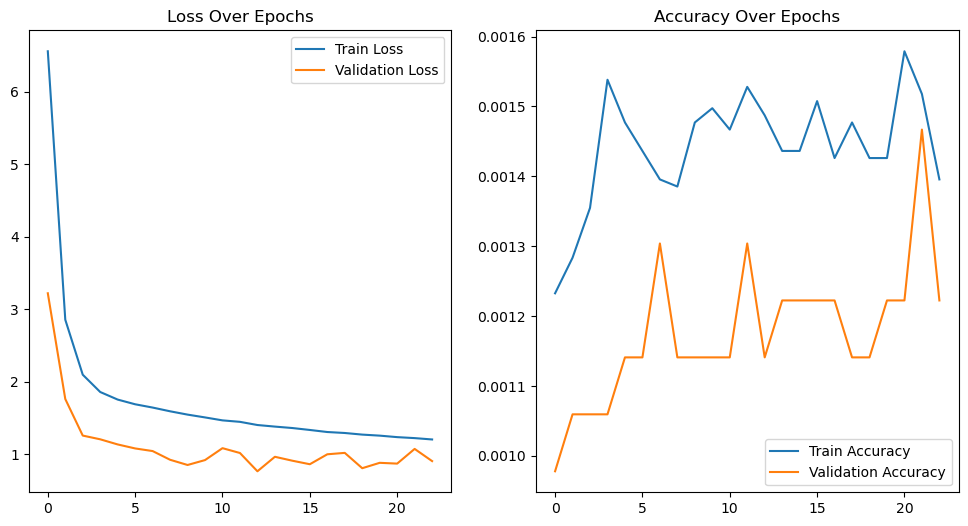

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 2s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[29.903572 ]
 [29.440191 ]
 [28.380314 ]
 ...
 [ 5.6100154]
 [ 5.0983586]
 [ 4.980806 ]]
Name: GRU,32,16, ADAM MAE, Batch 64, Epochs 40
MSE: 1.5104431053207257
MAE: 0.8552295286161335
RMSE: 1.2290008565174906
R2 Score: 0.9777781070333899


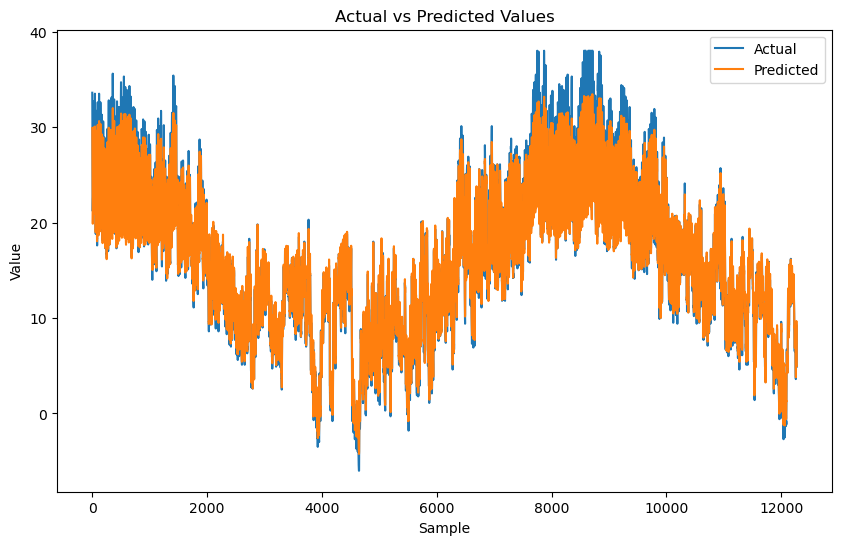

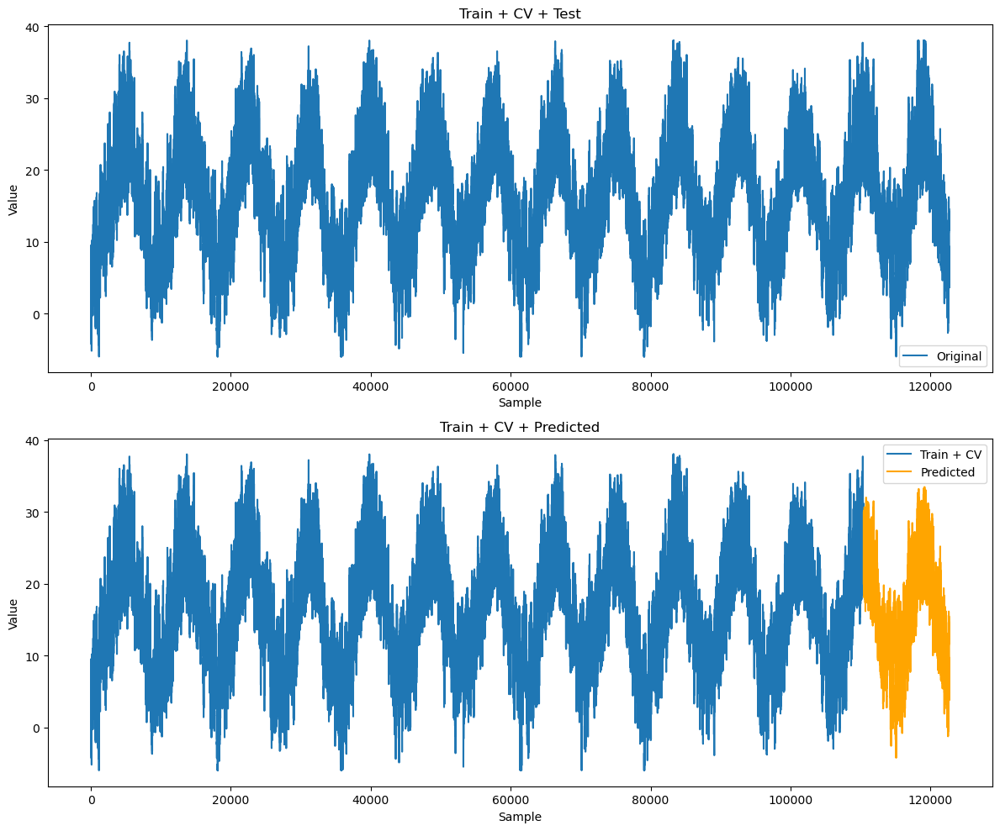

{'Name': 'GRU,32,16, ADAM MAE, Batch 64, Epochs 40', 'MSE': 1.5104431053207257, 'MAE': 0.8552295286161335, 'RMSE': 1.2290008565174906, 'R2 Score': 0.9777781070333899}


In [87]:
model = GRU_32and16(
    train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adam', loss='mae',
    batch_size=64, epochs=40
)

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "GRU,32,16, ADAM MAE, Batch 64, Epochs 40",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

Model: "sequential_26"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_18 (GRU)                (None, 1, 32)             5568      
                                                                 
 dropout_52 (Dropout)        (None, 1, 32)             0         
                                                                 
 gru_19 (GRU)                (None, 1, 16)             2400      
                                                                 
 dropout_53 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_26 (Dense)            (None, 1, 1)              17        
                                                                 
Total params: 7985 (31.19 KB)
Trainable params: 7985 (31.19 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
767/767 

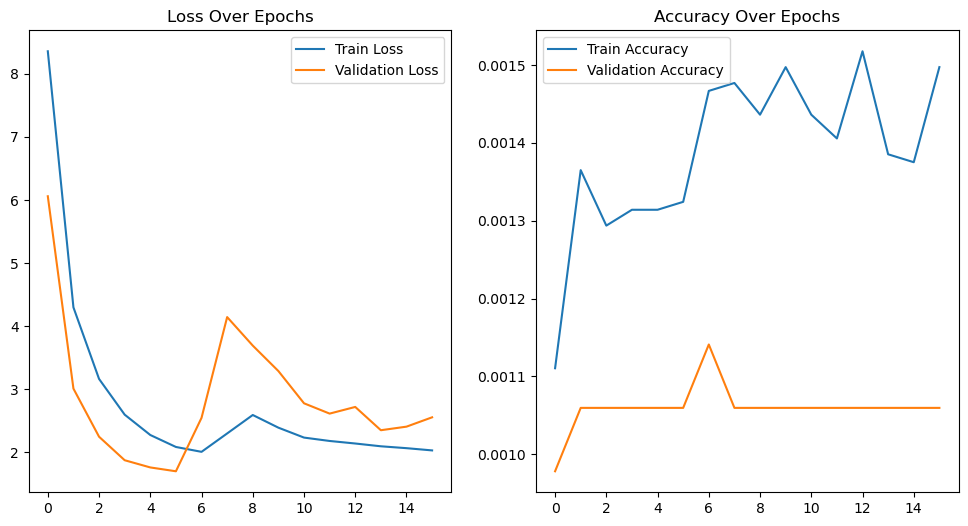

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 1s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[25.865177 ]
 [25.678043 ]
 [25.219677 ]
 ...
 [ 5.086064 ]
 [ 4.473831 ]
 [ 4.1619573]]
Name: GRU,32,16, ADAM MAE, Batch 128, Epochs 20
MSE: 6.72007018322936
MAE: 1.8355584098223943
RMSE: 2.5923098162120515
R2 Score: 0.9011331973949975


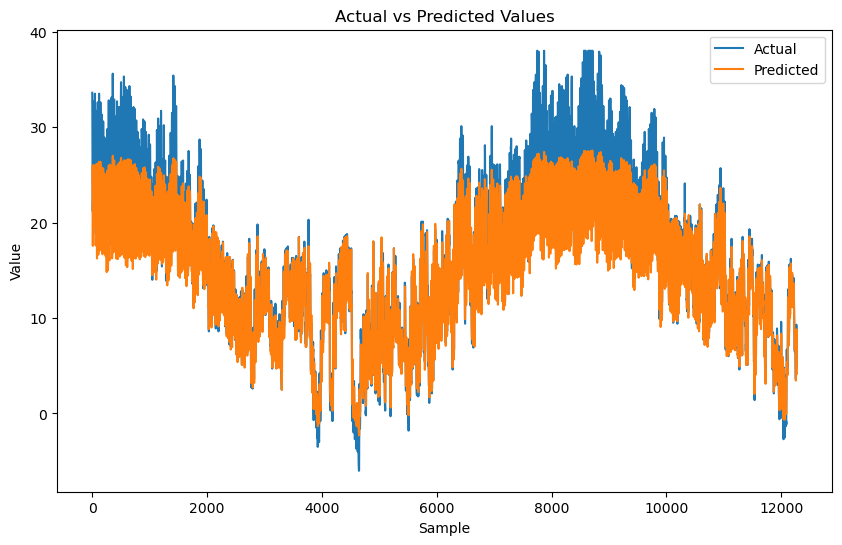

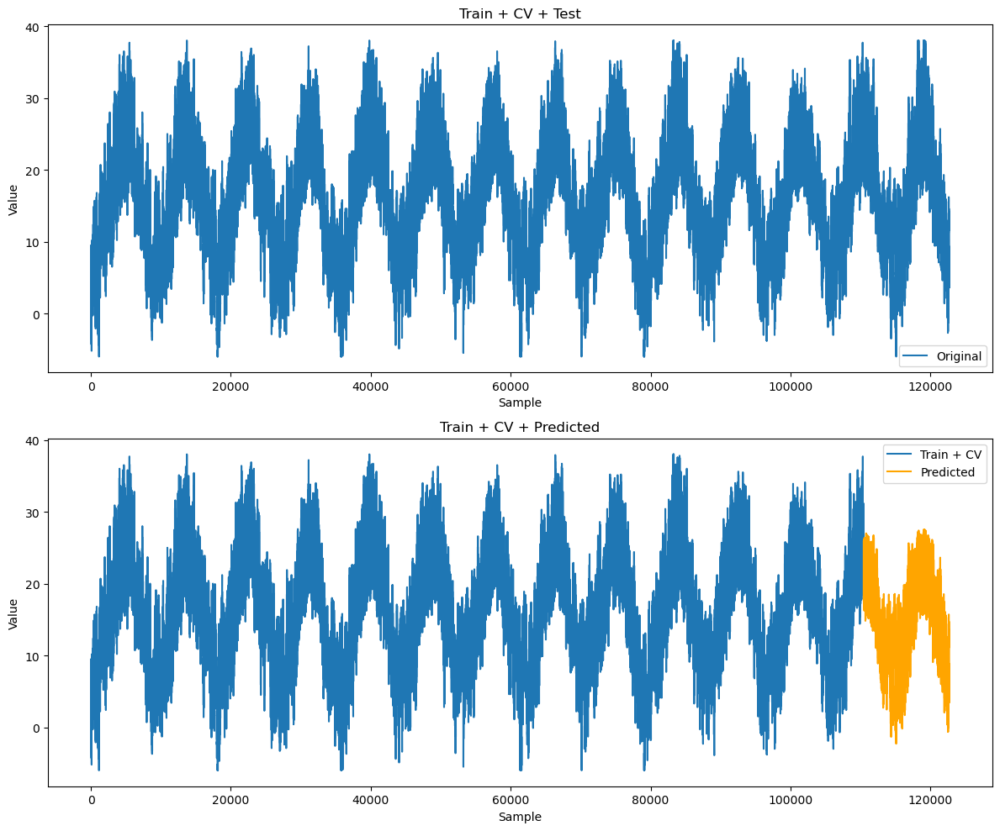

{'Name': 'GRU,32,16, ADAM MAE, Batch 128, Epochs 20', 'MSE': 6.72007018322936, 'MAE': 1.8355584098223943, 'RMSE': 2.5923098162120515, 'R2 Score': 0.9011331973949975}


In [88]:
model = GRU_32and16(
    train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adam', loss='mae',
    batch_size=128, epochs=20
)

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "GRU,32,16, ADAM MAE, Batch 128, Epochs 20",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

In [93]:
def GRU_32and16(
    train_X, train_y, val_X, val_y, optimizer='adam', loss='mse', metrics=['accuracy'],
    batch_size=64, epochs=20, learning_rate = 0.01, dropout=0.2
):
    model = Sequential()
    model.add(GRU(32, return_sequences=True, input_shape=(train_X.shape[1], train_X.shape[2])))
    model.add(Dropout(dropout))
    model.add(GRU(16, return_sequences=True))
    model.add(Dropout(dropout))
    model.add(Dense(1))

    model.compile(loss=loss, optimizer=keras.optimizers.Adam(learning_rate=learning_rate), metrics=metrics)
    model.summary()
    
    history = model.fit(train_X, train_y, epochs=epochs, batch_size=batch_size, validation_data=(val_X, val_y), 
                        verbose=2, shuffle=False, callbacks=[early_stopping, checkpoint])

    plot_history(history)

    return model

In [94]:
df_results

,Name,MSE,MAE,RMSE,R2 Score
0,"Simple RNN, 32,16, ADAM MSE, Batch 64, epochs ...",1.964202,0.977420,1.401500,0.971102
1,"Simple RNN, 32,16, ADAMAX MSE, batch 64, epoch...",7.897633,1.978019,2.810273,0.883809
2,"Simple RNN, 32,16, ADAM MAE, Batch 64, Epochs ...",1.976923,0.954836,1.406031,0.970915
3,"Simple RNN, 32,16, ADAMAX MAE, Batch 64, Epoch...",4.374293,1.467342,2.091481,0.935645
4,"LSTM, 32,16, ADAM MSE, Batch 64, Epochs 20, dr...",1.170285,0.791649,1.081797,0.982783
5,"LSTM, 32,16, ADAMAX MSE, Batch 64, Epochs 20, ...",3.089672,1.192901,1.757746,0.954544
6,"LSTM, 32,16, ADAM MAE, Batch 64, Epochs 20, dr...",1.861503,0.951772,1.364369,0.972613
7,"LSTM, 32,16, ADAMAX MAE, Batch 64, Epochs 20, ...",3.409464,1.237881,1.846474,0.949839
8,"GRU, 32,16, ADAM MSE, Batch 64, Epochs 20, dro...",1.721455,0.972279,1.312042,0.974674
9,"GRU, 32,16, ADAMAX MSE, Batch 64, Epochs 20, d...",1.583056,0.895303,1.258195,0.976710


Model: "sequential_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_22 (GRU)                (None, 1, 32)             5568      
                                                                 
 dropout_56 (Dropout)        (None, 1, 32)             0         
                                                                 
 gru_23 (GRU)                (None, 1, 16)             2400      
                                                                 
 dropout_57 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_28 (Dense)            (None, 1, 1)              17        
                                                                 
Total params: 7985 (31.19 KB)
Trainable params: 7985 (31.19 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534/153

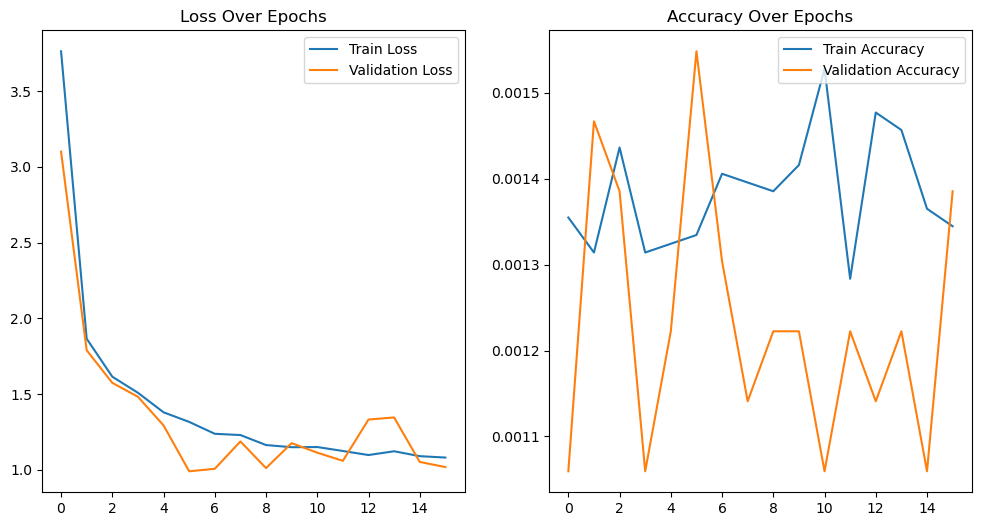

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 2s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[28.977276 ]
 [28.584972 ]
 [27.562233 ]
 ...
 [ 5.6385965]
 [ 5.009376 ]
 [ 4.7071886]]
Name: GRU,32,16, ADAM MAE, Batch 64, Epochs 20, lr 0.01
MSE: 2.409260647242924
MAE: 1.0549458087700114
RMSE: 1.5521793218706799
R2 Score: 0.964554552208486


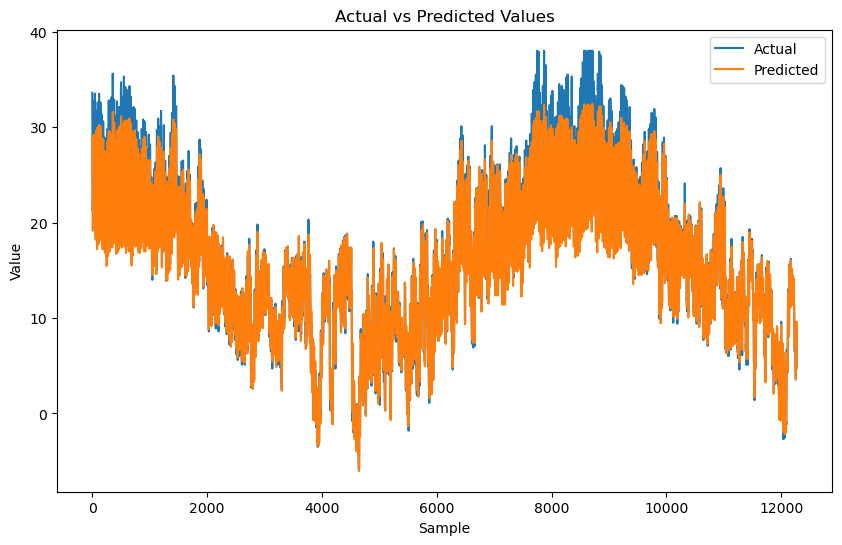

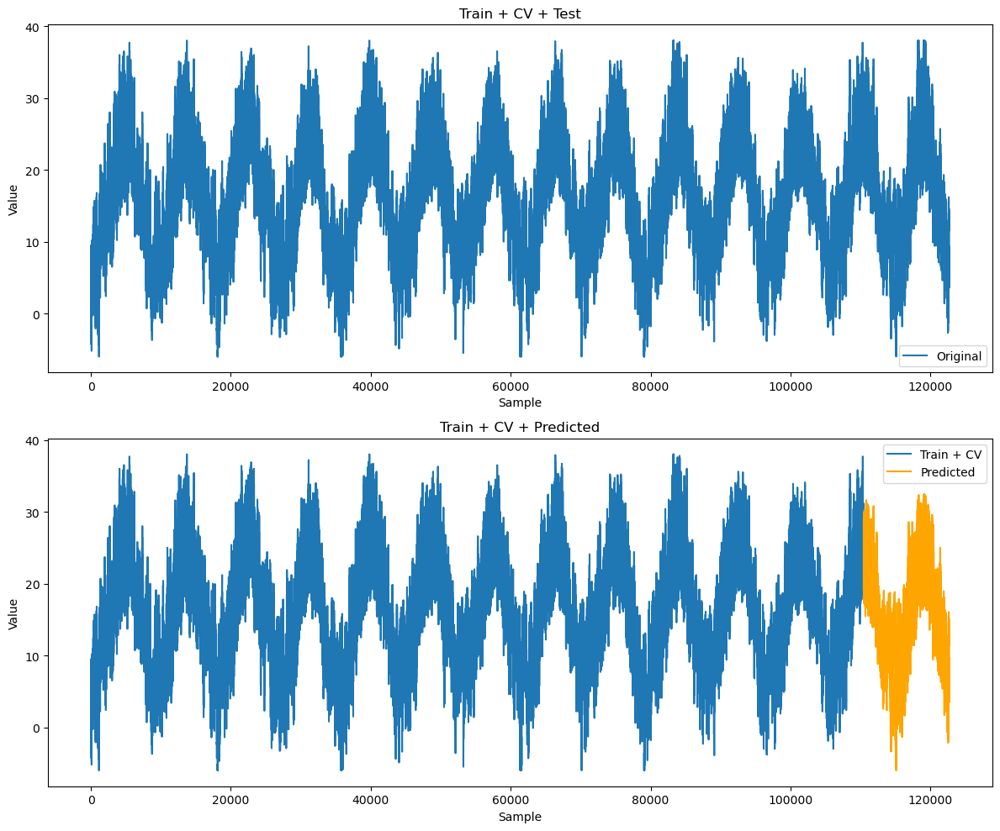

{'Name': 'GRU,32,16, ADAM MAE, Batch 64, Epochs 20, lr 0.01', 'MSE': 2.409260647242924, 'MAE': 1.0549458087700114, 'RMSE': 1.5521793218706799, 'R2 Score': 0.964554552208486}


In [95]:
model = GRU_32and16(
    train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adam', loss='mae',
    batch_size=64, epochs=20, learning_rate = 0.01
)

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "GRU,32,16, ADAM MAE, Batch 64, Epochs 20, lr 0.01",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 gru_24 (GRU)                (None, 1, 32)             5568      
                                                                 
 dropout_58 (Dropout)        (None, 1, 32)             0         
                                                                 
 gru_25 (GRU)                (None, 1, 16)             2400      
                                                                 
 dropout_59 (Dropout)        (None, 1, 16)             0         
                                                                 
 dense_29 (Dense)            (None, 1, 1)              17        
                                                                 
Total params: 7985 (31.19 KB)
Trainable params: 7985 (31.19 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/20
1534/153

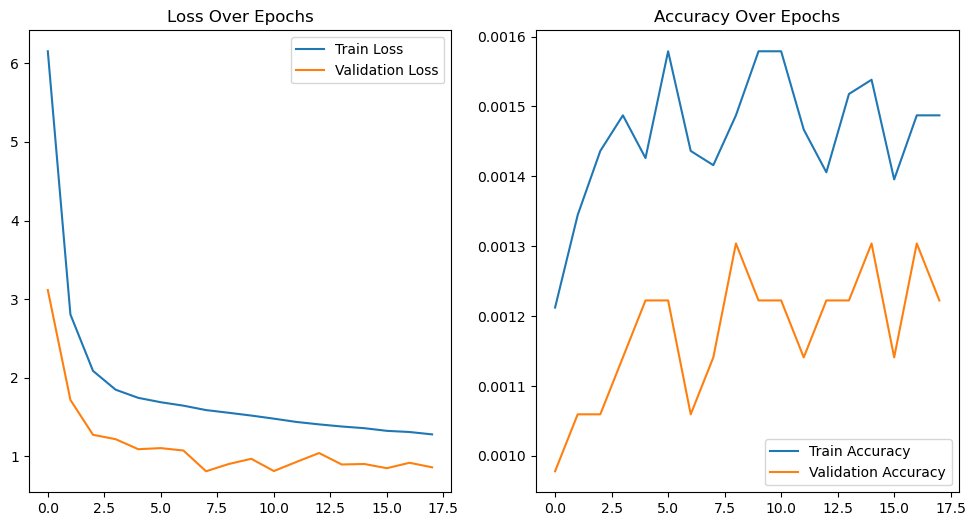

test_y
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
384/384 [==============================] - 2s 2ms/step
test_y reshape
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
actual_rescaled
[[33.6]
 [32.5]
 [30.9]
 ...
 [ 5.2]
 [ 5. ]
 [ 4.9]]
predicted_rescaled
[[29.810158 ]
 [29.322517 ]
 [28.340054 ]
 ...
 [ 5.2217464]
 [ 4.8378916]
 [ 4.830662 ]]
Name: GRU,32,16, ADAM MAE, Batch 64, Epochs 20, lr 0.001
MSE: 1.6712262193100247
MAE: 0.9089484331378745
RMSE: 1.2927591497684419
R2 Score: 0.9754126388225566


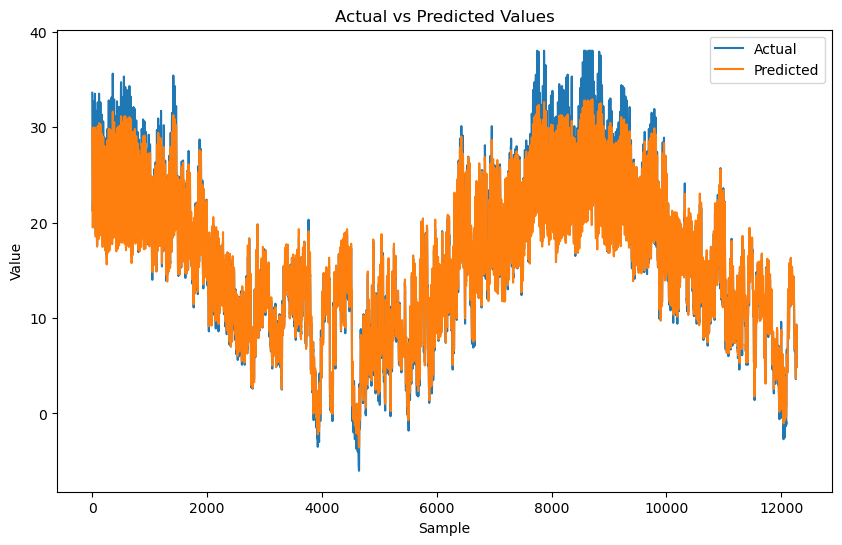

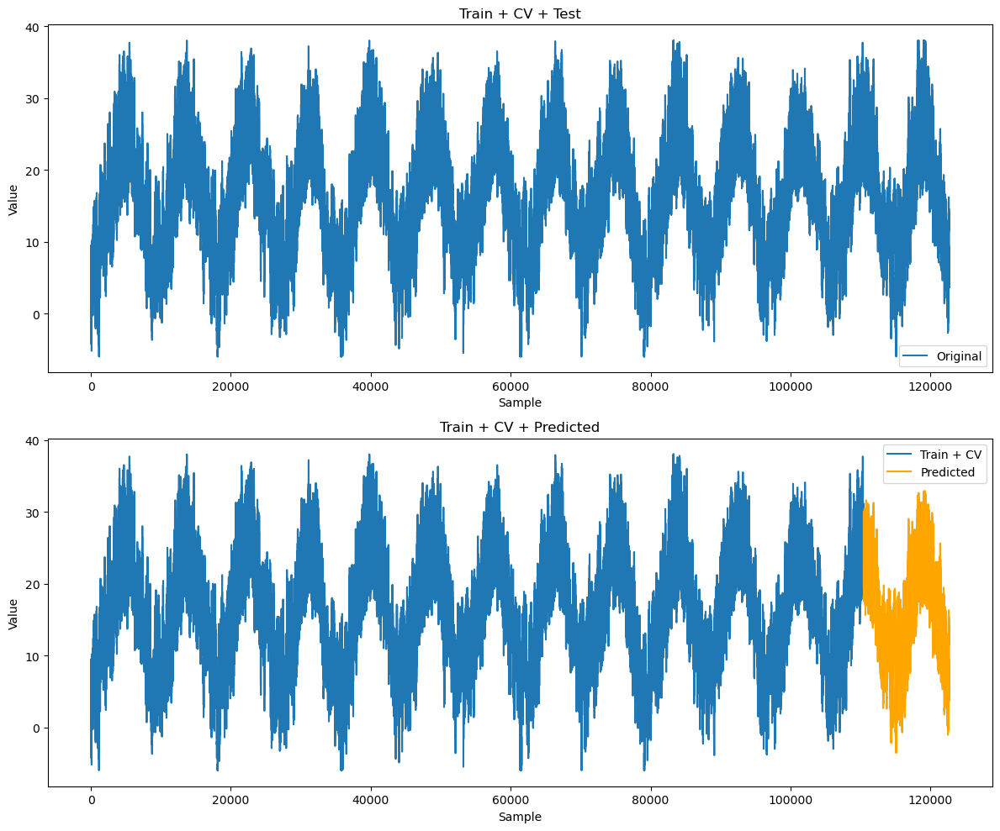

{'Name': 'GRU,32,16, ADAM MAE, Batch 64, Epochs 20, lr 0.001', 'MSE': 1.6712262193100247, 'MAE': 0.9089484331378745, 'RMSE': 1.2927591497684419, 'R2 Score': 0.9754126388225566}


In [96]:
model = GRU_32and16(
    train_X_simple_rnn, train_y_simple_rnn, val_X_simple_rnn, val_y_simple_rnn, optimizer='adam', loss='mae',
    batch_size=64, epochs=20, learning_rate = 0.001
)

results = evaluate(model, test_X_simple_rnn, test_y_simple_rnn, scaler.data_min_, scaler.data_max_)

metrics = {
    "Name": "GRU,32,16, ADAM MAE, Batch 64, Epochs 20, lr 0.001",
    "MSE": results["metrics"]["mse"],
    "MAE": results["metrics"]["mae"],
    "RMSE": results["metrics"]["rmse"],
    "R2 Score": results["metrics"]["r2"]
}

for key, value in metrics.items():
    print(f"{key}: {value}")
    
actual_rescaled = results["actual_rescaled"]
predicted_rescaled = results["predicted_rescaled"]

plot_actual_vs_predicted(actual_rescaled, predicted_rescaled)
train_series = df_outliers_clipped['Temperature'].iloc[:train_X_simple_rnn.shape[0]].values
val_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0]:train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]].values
test_series = df_outliers_clipped['Temperature'].iloc[train_X_simple_rnn.shape[0] + val_X_simple_rnn.shape[0]:].values

plot_comparison(train_series, val_series, test_series, predicted_rescaled)
print(metrics)
df_new = pd.DataFrame([metrics])
df_results = pd.concat([df_results, df_new], ignore_index=True)

In [101]:
df_results_sorted = df_results.sort_values(by='MSE')

In [102]:
pd.set_option('display.max_colwidth', None)
df_results_sorted

,Name,MSE,MAE,RMSE,R2 Score
10,"GRU, 32,16, ADAM MAE, Batch 64, Epochs 20, dropout 0.2",1.104969,0.767722,1.051175,0.983744
4,"LSTM, 32,16, ADAM MSE, Batch 64, Epochs 20, dropout 0.2",1.170285,0.791649,1.081797,0.982783
25,"GRU,32,16, ADAM MAE, Batch 64, Epochs 40",1.510443,0.855230,1.229001,0.977778
9,"GRU, 32,16, ADAMAX MSE, Batch 64, Epochs 20, dropout 0.2",1.583056,0.895303,1.258195,0.976710
28,"GRU,32,16, ADAM MAE, Batch 64, Epochs 20, lr 0.001",1.671226,0.908948,1.292759,0.975413
8,"GRU, 32,16, ADAM MSE, Batch 64, Epochs 20, dropout 0.2",1.721455,0.972279,1.312042,0.974674
6,"LSTM, 32,16, ADAM MAE, Batch 64, Epochs 20, dropout 0.2",1.861503,0.951772,1.364369,0.972613
0,"Simple RNN, 32,16, ADAM MSE, Batch 64, epochs 20, dropout 0.2",1.964202,0.977420,1.401500,0.971102
2,"Simple RNN, 32,16, ADAM MAE, Batch 64, Epochs 20, dropout 0.2",1.976923,0.954836,1.406031,0.970915
11,"GRU, 32,16, ADAMAX MAE, Batch 64, Epochs 20, dropout 0.2",2.001389,1.007312,1.414705,0.970555
